### Integrated CA2 – Data Visualization Techniques and Machine Learning for Business HDip
#### Author: Cristhian Macedo - 2024104
[GitHub Repository](https://github.com/CCT-College-Dublin/integrated-ca2-50-CristhianMacedo2024104)

[Google Drive with Data sets](https://drive.google.com/drive/folders/13YLds_zNIfJyyT6EeDVrUzXZgO09kDjW?usp=sharing)

# 1. Introduction

This project aims to complete the second Assessment Task for the module Data Visualization Techniques and Machine Learning for Business from the course Higher Diploma in Science in Data Analytics for Business by CCT College Dublin, this is a document to describe the project itself whose name is "CristhianMacedo_Integrated_MLB_DVizHDip_CA2". This Data Visualization Techniques and Machine Learning for Business project uses the programming language Python, the environment of Anaconda Navigator with Jupyter Notebook, with CRISP-DM methodology as project management.

The area that has been chosen to be covered the Recommendation System subject is Animes containing four databases called “animalist, rating_complete, anime and anime_with_synopsis” Those data sets contain information about 17562 animes with 325.772 different users collected from the website myanimelist.net database available on Kaggle website with 10 points of Usability.

**Note:**

The Plotly graphs previews are not being displayed after uploading to the GitHub repository, so it would be advisable to download the document and open it if you desire to see the visualisations, thank you.

Questions:

1) Discuss and explain the purpose of a recommendation system for online retail business in machine learning. Briefly compare Content and Collaborative filtering using any dataset of your choice (Datasets used in the class tutorials or exercises are not allowed to use in this CA2). Train and test machine learning models for the user-user and item-item collaborative filtering. Justify your recommendations for the considered scenario by providing a conceptual insight.

2) Perform Market Basket Analysis on the chosen dataset by using Apriori and FP growth algorithms. Can you express major similarities/divergence between these models? Compare and contrast the machine learning results obtained based on both algorithms.

3) Create an interactive Dashboard aimed at younger adults (18 - 35 years) with specific features to summarise the most important aspects of the data and identify through your visualisation why this dataset is suitable for Machine Learning models in an online retail business. Explain how your dashboard is designed with this demographic in mind.

4) Discuss in detail your rationale and justification for all stages of data preparation for your visualizations.

# 2. Data Understanding

This first stage will cover some approaches to understanding the database, first importing the essential libraries to run this project, loading the database, inspecting the data frame, and so on. 

## 2.1 Importing Libraries

This section is dedicated to all libraries used in this project, once needed it will be added to this section keeping the document organised, the libraries are: 

- "`pandas`"
- "`numpy`"
- "`matplotlib`"
- "`seaborn`"
- "`missingno`"
- "`plotly`"
- "`time`"
- "`dash_bootstrap_components`"
- "`tkinter`"
- "`sklearn`"
- "`googletrans`"
- "`fuzzywuzzy`"
- "`scipy`"
- "`copy`"
- "`mlxtend`"
- "`dash`"
- "`warnings`"

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px
import time
import tkinter as tk
import dash_bootstrap_components as dbc

from sklearn.impute import SimpleImputer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import linear_kernel, cosine_similarity
from sklearn.neighbors import NearestNeighbors
from googletrans import Translator
from fuzzywuzzy import fuzz
from scipy.sparse import csr_matrix
from scipy.spatial.distance import pdist, squareform
from copy import deepcopy
from mlxtend.frequent_patterns import apriori, association_rules, fpgrowth
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from dash import Dash, html, dcc, Input, Output, State

import warnings
warnings.filterwarnings("ignore")

## 2.2 Loading Data 

Creating a Data Frame named "`anime`" after loading the data set "`anime.csv`" from the folder "animes_data" using the command "`.read_csv()`", also used the method "`time`" to get an idea of ​​how long it takes to import the database.

In [2]:
start_time = time.time()

anime = pd.read_csv("animes_data/anime.csv")

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 0.06 seconds.
CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 1.19 μs


After loaded the database, it tooks **0.09 seconds**.

## 2.3 Inspecting the Data

Before inspecting the data, use the command below to show all columns when using the command "`.head()`" learned on the article "How to Show All Columns and Rows in a Pandas DataFrame" (Andryw Marques, 2024).

In [3]:
pd.set_option('display.max_columns', None)

Next, it uses the commands to get the "`Head, Shape and columns`" information about the data frame.

In [4]:
anime.head()

,MAL_ID,Name,Score,Genres,English name,Japanese name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On-Hold,Dropped,Plan to Watch,Score-10,Score-9,Score-8,Score-7,Score-6,Score-5,Score-4,Score-3,Score-2,Score-1
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space",Cowboy Bebop,カウボーイビバップ,TV,26,"Apr 3, 1998 to Apr 24, 1999",Spring 1998,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min. per ep.,R - 17+ (violence & profanity),28.0,39,1251960,61971,105808,718161,71513,26678,329800,229170.0,182126.0,131625.0,62330.0,20688.0,8904.0,3184.0,1357.0,741.0,1580.0
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space",Cowboy Bebop:The Movie,カウボーイビバップ 天国の扉,Movie,1,"Sep 1, 2001",Unknown,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr. 55 min.,R - 17+ (violence & profanity),159.0,518,273145,1174,4143,208333,1935,770,57964,30043.0,49201.0,49505.0,22632.0,5805.0,1877.0,577.0,221.0,109.0,379.0
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen",Trigun,トライガン,TV,26,"Apr 1, 1998 to Sep 30, 1998",Spring 1998,Victor Entertainment,"Funimation, Geneon Entertainment USA",Madhouse,Manga,24 min. per ep.,PG-13 - Teens 13 or older,266.0,201,558913,12944,29113,343492,25465,13925,146918,50229.0,75651.0,86142.0,49432.0,15376.0,5838.0,1965.0,664.0,316.0,533.0
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",Witch Hunter Robin,Witch Hunter ROBIN (ウイッチハンターロビン),TV,26,"Jul 2, 2002 to Dec 24, 2002",Summer 2002,"TV Tokyo, Bandai Visual, Dentsu, Victor Entert...","Funimation, Bandai Entertainment",Sunrise,Original,25 min. per ep.,PG-13 - Teens 13 or older,2481.0,1467,94683,587,4300,46165,5121,5378,33719,2182.0,4806.0,10128.0,11618.0,5709.0,2920.0,1083.0,353.0,164.0,131.0
4,8,Bouken Ou Beet,6.98,"Adventure, Fantasy, Shounen, Supernatural",Beet the Vandel Buster,冒険王ビィト,TV,52,"Sep 30, 2004 to Sep 29, 2005",Fall 2004,"TV Tokyo, Dentsu",Unknown,Toei Animation,Manga,23 min. per ep.,PG - Children,3710.0,4369,13224,18,642,7314,766,1108,3394,312.0,529.0,1242.0,1713.0,1068.0,634.0,265.0,83.0,50.0,27.0


In [5]:
anime.shape

(17562, 35)

In [6]:
anime.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Japanese name',
       'Type', 'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors',
       'Studios', 'Source', 'Duration', 'Rating', 'Ranked', 'Popularity',
       'Members', 'Favorites', 'Watching', 'Completed', 'On-Hold', 'Dropped',
       'Plan to Watch', 'Score-10', 'Score-9', 'Score-8', 'Score-7', 'Score-6',
       'Score-5', 'Score-4', 'Score-3', 'Score-2', 'Score-1'],
      dtype='object')

It is possible to see that the dataframe has a size of **17562 observations (Rows)** and **35 features (Columns)**, named as: 
- MAL_ID, Name, Score, Genres, English name, Japanese name, Type, Episodes, Aired, Premiered, Producers, Licensors, Studios, Source, Duration, Rating, Ranked, Popularity, Members, Favorites, Watching, Completed, On-Hold, Dropped, Plan to Watch, Score-10, Score-9, Score-8, Score-7, Score-6, Score-5, Score-4, Score-3, Score-2 and Score-1.

Getting the "`Info`" of the data frame, to check Data Types, Non-Null values count, column's name and ID, etc. 

In [7]:
anime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17562 entries, 0 to 17561
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MAL_ID         17562 non-null  int64 
 1   Name           17562 non-null  object
 2   Score          17562 non-null  object
 3   Genres         17562 non-null  object
 4   English name   17562 non-null  object
 5   Japanese name  17562 non-null  object
 6   Type           17562 non-null  object
 7   Episodes       17562 non-null  object
 8   Aired          17562 non-null  object
 9   Premiered      17562 non-null  object
 10  Producers      17562 non-null  object
 11  Licensors      17562 non-null  object
 12  Studios        17562 non-null  object
 13  Source         17562 non-null  object
 14  Duration       17562 non-null  object
 15  Rating         17562 non-null  object
 16  Ranked         17562 non-null  object
 17  Popularity     17562 non-null  int64 
 18  Members        17562 non-n

There are **17562 entries, 0 to 17561 observations**, *Data columns (total 35 columns)*, # showing the index of the features, Column's name, Non-Null Count preseting that there are no features missing values, Dtype describing the type of each feature and an overview of dtypes: **int64(9) and object(26)** and memory usage of **4.7+ MB**.

Next, check the "`memory usage`", of the data, in this case, is allocated **30.6 MB** in the RAM Memory, learned on: "Reducing Pandas memory usage #1: lossless compression" (Itamar Turner-Trauring, 2019).

In [8]:
anime.info(verbose = False, memory_usage = "deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17562 entries, 0 to 17561
Columns: 35 entries, MAL_ID to Score-1
dtypes: int64(9), object(26)
memory usage: 30.6 MB


Getting a "`Describe`" of the data frame to check the values of "count, mean, standard deviation, min, Q1 25%, Q2 50%, Q3 75% and max" for each numerical feature, using "`.T`" in the end to transpose it.

In [9]:
anime.describe().T

,count,mean,std,min,25%,50%,75%,max
MAL_ID,17562.0,21477.192347,14900.093170,1.0,5953.5,22820.0,35624.75,48492.0
Popularity,17562.0,8763.452340,5059.327278,0.0,4383.5,8762.5,13145.00,17565.0
Members,17562.0,34658.539517,125282.141428,1.0,336.0,2065.0,13223.25,2589552.0
Favorites,17562.0,457.746270,4063.473313,0.0,0.0,3.0,31.00,183914.0
Watching,17562.0,2231.487758,14046.688133,0.0,13.0,73.0,522.00,887333.0
Completed,17562.0,22095.571347,91009.188504,0.0,111.0,817.5,6478.00,2182587.0
On-Hold,17562.0,955.049653,4275.675096,0.0,6.0,45.0,291.75,187919.0
Dropped,17562.0,1176.599533,4740.348653,0.0,37.0,77.0,271.00,174710.0
Plan to Watch,17562.0,8199.831227,23777.691963,1.0,112.0,752.5,4135.50,425531.0


Getting the "`Null information`" of the data frame, checking the missing values in the data frame, just to confirm and next plotting it.

In [10]:
anime.isnull().sum()

MAL_ID           0
Name             0
Score            0
Genres           0
English name     0
Japanese name    0
Type             0
Episodes         0
Aired            0
Premiered        0
Producers        0
Licensors        0
Studios          0
Source           0
Duration         0
Rating           0
Ranked           0
Popularity       0
Members          0
Favorites        0
Watching         0
Completed        0
On-Hold          0
Dropped          0
Plan to Watch    0
Score-10         0
Score-9          0
Score-8          0
Score-7          0
Score-6          0
Score-5          0
Score-4          0
Score-3          0
Score-2          0
Score-1          0
dtype: int64

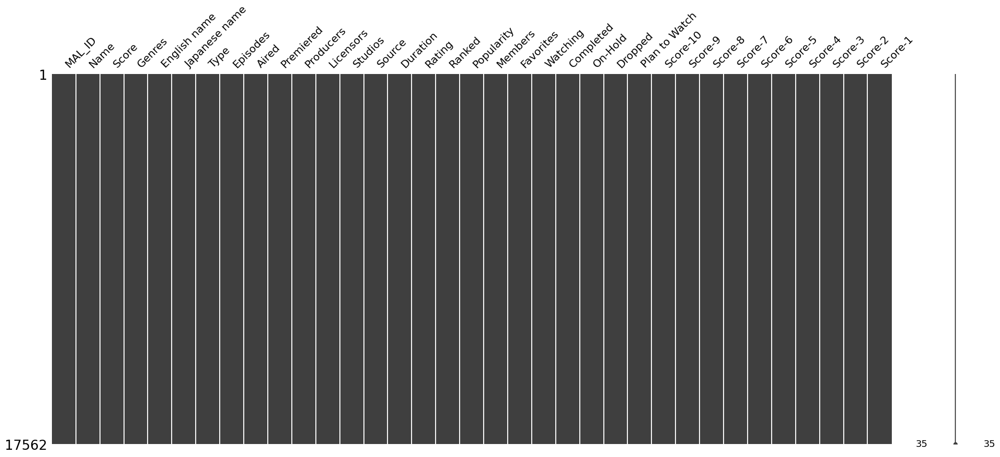

In [11]:
ax = msno.matrix(anime)

In this case, there exist no features missing values.

Getting "`Duplicates`" of the data frame.

In [12]:
anime[anime.duplicated()].shape

(0, 35)

In this case, there are no duplicated observations to be handled.

Checking the "`dtypes`" of each feature.

In [13]:
anime.dtypes

MAL_ID            int64
Name             object
Score            object
Genres           object
English name     object
Japanese name    object
Type             object
Episodes         object
Aired            object
Premiered        object
Producers        object
Licensors        object
Studios          object
Source           object
Duration         object
Rating           object
Ranked           object
Popularity        int64
Members           int64
Favorites         int64
Watching          int64
Completed         int64
On-Hold           int64
Dropped           int64
Plan to Watch     int64
Score-10         object
Score-9          object
Score-8          object
Score-7          object
Score-6          object
Score-5          object
Score-4          object
Score-3          object
Score-2          object
Score-1          object
dtype: object

It is possible to notice, that a few features that should be numeric are presenting the type as "object".

Next, visualising a few important values about the data frame.

In [14]:
print(anime["Name"].nunique(), "Different Animes")
print(anime["Genres"].nunique(), "Different Genres")
print(anime["English name"].nunique(), "Different English names")
print(anime["Japanese name"].nunique(), "Different Japanese names")
print(anime["Type"].nunique(), "Different Types")
print(anime["Producers"].nunique(), "Different Producers")
print(anime["Licensors"].nunique(), "Different Licensors")
print(anime["Studios"].nunique(), "Different Studios")
print(anime["Source"].nunique(), "Different Sources")
print(anime["Rating"].nunique(), "Different Ratings")
print(anime["Members"].sum(), "Members")
print(anime["Popularity"].mean(), "Popularity")

17558 Different Animes
5034 Different Genres
6831 Different English names
16679 Different Japanese names
7 Different Types
3783 Different Producers
231 Different Licensors
1090 Different Studios
16 Different Sources
7 Different Ratings
608673271 Members
8763.45234028015 Popularity


# 3. Data Preparation

This stage will cover some approaches to manipulating the data and preparing it for use in the algorithms of a **recommendation system**, comparison of **Content and Collaborative filtering**, **Train and test** for machine learning models for the **user-user and item-item** with collaborative filtering, performing **Market Basket Analysis** by using **Apriori and FP growth algorithm**, and finally creating an **interactive Dashboard**.

## 3.1 Finding Unique Values

Using "`Unique`", to check the values in the features.

In [15]:
anime["Type"].unique()

array(['TV', 'Movie', 'OVA', 'Special', 'ONA', 'Music', 'Unknown'],
      dtype=object)

- MAL_ID, Name, Genres, English name, Japanese name, Producers, Studios, Rating, Ranked, Popularity, Members, Favorites, Watching, Completed, On-Hold, Dropped, Plan to Watch, Score-10, Score-9, Score-8, Score-7, Score-6, Score-5, Score-4, Score-3, Score-2 and Score-1: Seems to be ok.
- Score, Type, Episodes, Premiered, Licensors, Source and Duration - **has 'Unknown' values**.
- Aired - **has some years with the description "to ?" in the end**.

After analysing the high frequency of "`unknown`" values ​​in the features, it decided to create a for loop and check value by value, since using "unique" values ​​is not simple to analyse, it also added the column's name in the variable "`col_unknown_values`".

In [16]:
col_unknown_values = []

for col in anime.columns:
    if "Unknown" in anime[col].values:
        col_unknown_values.append(col) 
        print(col)

Score
Genres
English name
Japanese name
Type
Episodes
Aired
Premiered
Producers
Licensors
Studios
Source
Duration
Rating
Ranked
Score-10
Score-9
Score-8
Score-7
Score-6
Score-5
Score-4
Score-3
Score-2
Score-1


As suspected before there are more columns with "`unknown`" values, 25 in total, they are:

- Score, Genres, English name, Japanese name, Type, Episodes, Aired, Premiered, Producers, Licensors, Studios, Source, Duration, Rating, Ranked, Score-10, Score-9, Score-8, Score-7, Score-6, Score-5, Score-4, Score-3, Score-2 and Score-1.

Before plotting all features with "`unknown values`", it created a function called "`graph_patterns`" using "`Plotly`" library to standardise parameters, such as colours, title, the size of the title, the font size and family and so on, most of the parameters of Plotly it learned in the articles "Setting the Font, Title, Legend Entries, and Axis Titles in Python" (Plotly, 2024d) and "Python Figure Reference: layout.xaxis" (Plotly, 2016).

In [17]:
def graph_patterns():
    fig.update_layout(
        title = dict(font = dict(size = 16)),
        font_family = "Arial",
        font_color = "black",
        legend = dict(title = "Description:"),
        plot_bgcolor = "white",
        paper_bgcolor = "white",
        xaxis = dict(showline = True, showgrid = False, linecolor = "black"), 
        yaxis = dict(showline = True, showgrid = False, linecolor = "black")
    )

Next, it creates a "`for loop`" to show all features and their respective total of "`Unknown values and total values`".

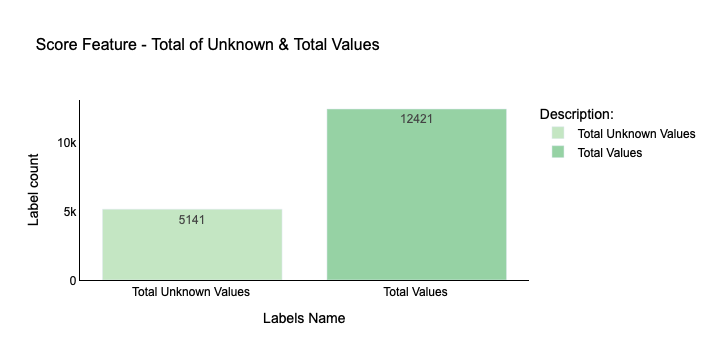

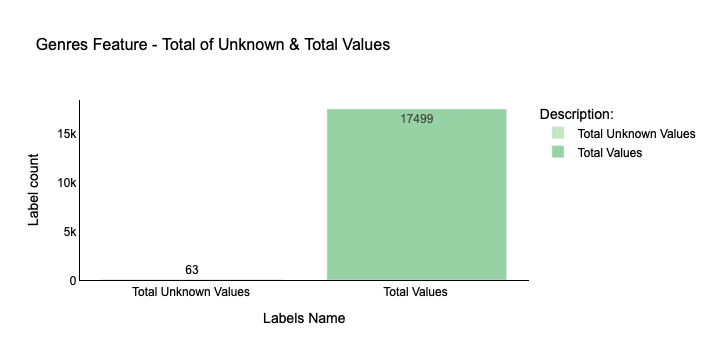

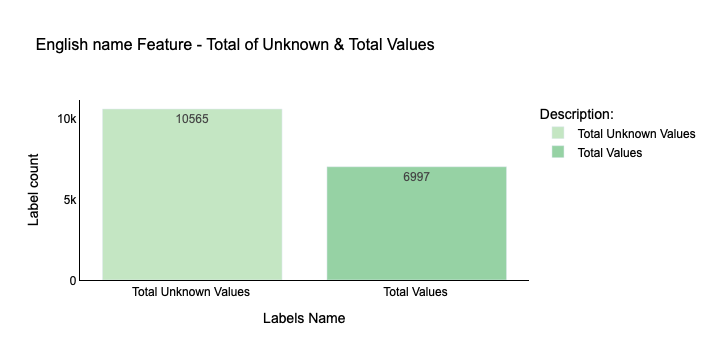

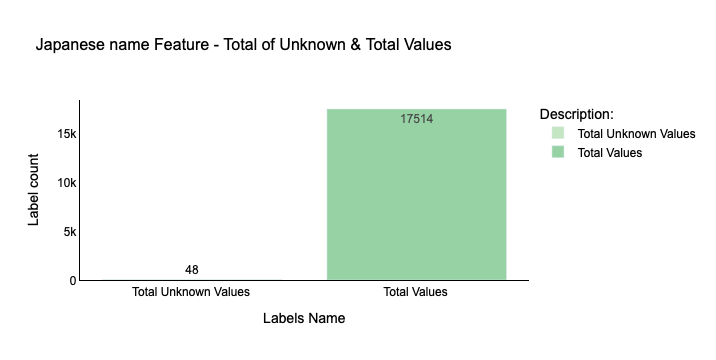

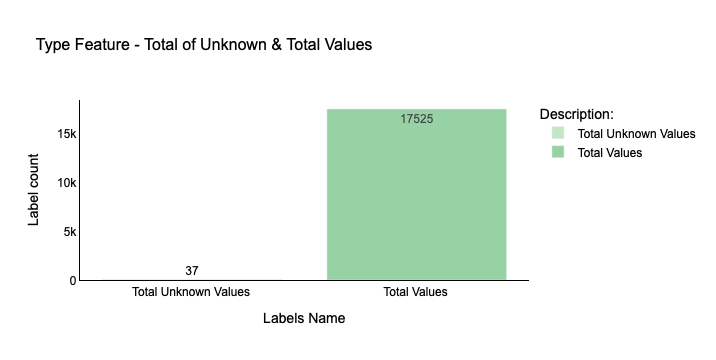

...

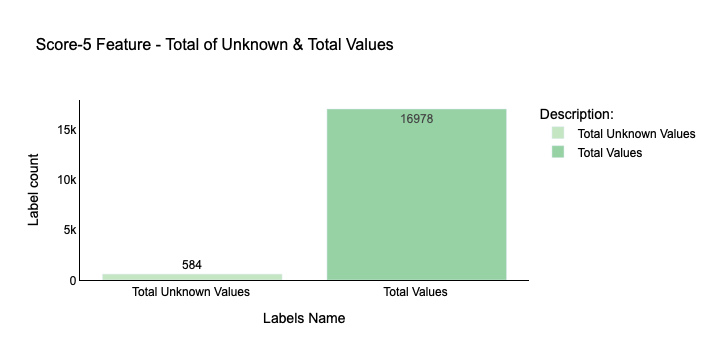

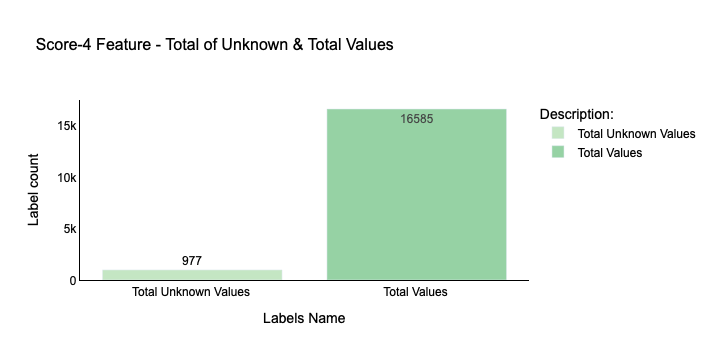

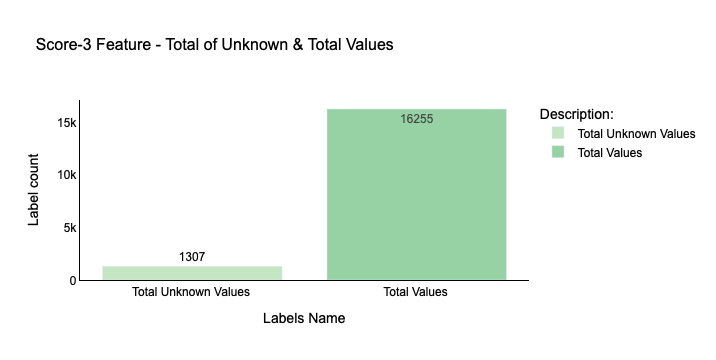

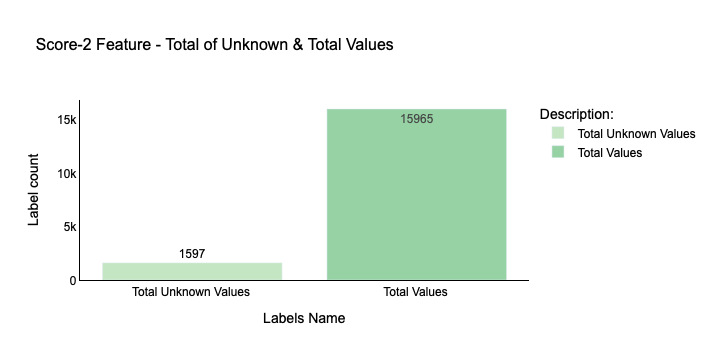

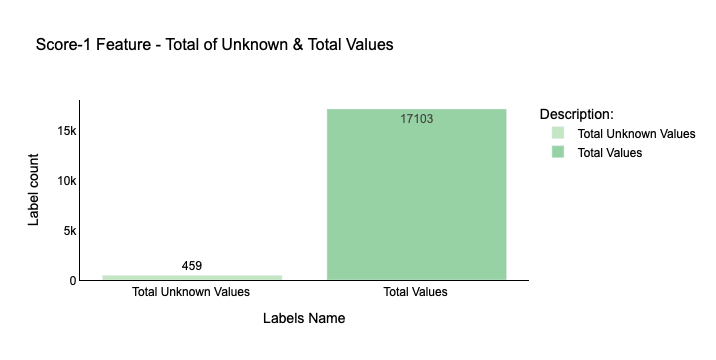

In [18]:
for col in anime[col_unknown_values]:

    total_unknown = anime[anime[col] == "Unknown"].shape[0]
    total_values = len(anime) - total_unknown
    
    labels = ['Total Unknown Values', 'Total Values']
    values = [total_unknown, total_values]

    fig = px.bar(anime, y = values, x = labels, text_auto = '.5',
                 title = col + " Feature - Total of Unknown & Total Values",
                 labels = {'x': 'Labels Name', 'y': 'Label count'},
                 color = labels, color_discrete_sequence = px.colors.sequential.Blugrn)
    
    graph_patterns()
    
    fig.show()

Next, it creates a "`for loop`" to show all features with their respective total of "`Unknown values`" and the percentage.

In [19]:
for col in anime[col_unknown_values]:
    total_unknown = anime[anime[col] == "Unknown"].shape[0]
    print(col, "-", total_unknown, f"| {(total_unknown / anime.shape[0]) * 100:.2f}%")

Score - 5141 | 29.27%
Genres - 63 | 0.36%
English name - 10565 | 60.16%
Japanese name - 48 | 0.27%
Type - 37 | 0.21%
Episodes - 516 | 2.94%
Aired - 309 | 1.76%
Premiered - 12817 | 72.98%
Producers - 7794 | 44.38%
Licensors - 13616 | 77.53%
Studios - 7079 | 40.31%
Source - 3567 | 20.31%
Duration - 555 | 3.16%
Rating - 688 | 3.92%
Ranked - 1762 | 10.03%
Score-10 - 437 | 2.49%
Score-9 - 3167 | 18.03%
Score-8 - 1371 | 7.81%
Score-7 - 503 | 2.86%
Score-6 - 511 | 2.91%
Score-5 - 584 | 3.33%
Score-4 - 977 | 5.56%
Score-3 - 1307 | 7.44%
Score-2 - 1597 | 9.09%
Score-1 - 459 | 2.61%


## 3.2 Checking/Handling Unknown Values

In case of the need for input values, it will choose to use Multiple imputations once this "is a statistical technique that generates multiple plausible imputed datasets to account for the uncertainty associated with missing values. It involves creating multiple copies of the original dataset, imputing missing values in each copy using a chosen method, and then analyzing the results from all imputed datasets. The final analysis combines the results to provide more robust estimates." (Berukoff, 2023).

### 3.2.1 Score Feature

Score feature with **5141** unknown values ​​as **29.27%** ​​of data.

First, analysing the type of values ​​that this column has.

In [20]:
anime[["Name", "Score"]].head(2)

,Name,Score
0,Cowboy Bebop,8.78
1,Cowboy Bebop: Tengoku no Tobira,8.39


In [21]:
anime[["Name", "Score"]][anime["Score"] == "Unknown"].head(2)

,Name,Score
1404,Obake no Q-tarou,Unknown
1504,PostPet Momobin,Unknown


As the name suggests, this feature of scores must be numeric.

Next, "`Replacing`" the "Unknown" values with "Null Values" and applying the "SimpleImputer" technique using "median" to replace missing values (Null Values), and print the total of "Unknown Values" and its feature type.

In [22]:
anime["Score"].replace({"Unknown": None}, inplace = True)

imputer = SimpleImputer(strategy = "median")
anime["Score"] = imputer.fit_transform(anime[["Score"]])

In [23]:
print(anime[anime["Score"] == "Unknown"].shape[0], "Unknown Values")
print(anime["Score"].dtype, "Type")

0 Unknown Values
float64 Type


### 3.2.2 Genres Feature

Score feature with **63** unknown values ​​as **0.36%** ​​of data.

First, analysing the type of values ​​that this column has.

In [24]:
anime[["Name", "Genres"]].head(2)

,Name,Genres
0,Cowboy Bebop,"Action, Adventure, Comedy, Drama, Sci-Fi, Space"
1,Cowboy Bebop: Tengoku no Tobira,"Action, Drama, Mystery, Sci-Fi, Space"


In [25]:
anime[["Name", "Genres"]][anime["Genres"] == "Unknown"].head(2)

,Name,Genres
9788,Ikite Iru,Unknown
9838,Maze,Unknown


In this case, this feature is an object type, but has "Unknown" values, then opted to drop the "Unknown" values, once is just **63** values representing **0.36%** ​​of data.

Next, "`Replacing`" the "Unknown" values with "Null Values" and printing the total of "Null Values", followed by "Dropping" of null values, printing the total of "Null Values" and its feature type.

In [26]:
anime["Genres"].replace({"Unknown": None}, inplace = True)
print("Null values:", anime["Genres"].isnull().sum())

Null values: 63


In [27]:
anime.dropna(subset = ["Genres"], inplace = True)
print("Null values:", anime["Genres"].isnull().sum())
print(anime["Genres"].dtype, "Type")

Null values: 0
object Type


### 3.2.3 English name Feature

Score feature with **10513** unknown values ​​as **60.08%** ​​of data.

First, analysing the type of values ​​that this column has.

In [28]:
anime[["Name", "English name"]].head()

,Name,English name
0,Cowboy Bebop,Cowboy Bebop
1,Cowboy Bebop: Tengoku no Tobira,Cowboy Bebop:The Movie
2,Trigun,Trigun
3,Witch Hunter Robin,Witch Hunter Robin
4,Bouken Ou Beet,Beet the Vandel Buster


In [29]:
anime[["Name", "English name"]][anime["English name"] == "Unknown"].head(2)

,Name,English name
5,Eyeshield 21,Unknown
7,Hungry Heart: Wild Striker,Unknown


In this case, it is basically all values of the feature with "Unknown" values, 60.08% of 100% with Unknown English Title. 

In this case, there are three options: 
1. Keep the values as "Unknown" and ignore them when using this feature, which does not seem very viable.
2. The Feature Name and English Name have basically the same title, so could copy and paste the Title from the "Name Feature" to the "English name" feature, that also does not seem very viable, once it will be two features with basically the same values.
3. Drop this feature once it already has one feature with the anime's title.

So, in this case, it will opt to choose the third option, to drop the column once it is possible to use the feature "Name" for any title purposes.

In [30]:
anime.drop(columns = "English name", inplace = True)

In [31]:
anime.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'Japanese name', 'Type',
       'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors', 'Studios',
       'Source', 'Duration', 'Rating', 'Ranked', 'Popularity', 'Members',
       'Favorites', 'Watching', 'Completed', 'On-Hold', 'Dropped',
       'Plan to Watch', 'Score-10', 'Score-9', 'Score-8', 'Score-7', 'Score-6',
       'Score-5', 'Score-4', 'Score-3', 'Score-2', 'Score-1'],
      dtype='object')

### 3.2.4 Japanese name Feature

Score feature with **48** unknown values ​​as **0.27%** ​​of data.

First, analysing the type of values ​​that this column has.

In [32]:
anime[["Name", "Japanese name"]].head()

,Name,Japanese name
0,Cowboy Bebop,カウボーイビバップ
1,Cowboy Bebop: Tengoku no Tobira,カウボーイビバップ 天国の扉
2,Trigun,トライガン
3,Witch Hunter Robin,Witch Hunter ROBIN (ウイッチハンターロビン)
4,Bouken Ou Beet,冒険王ビィト


In [33]:
anime[["Name", "Japanese name"]][anime["Japanese name"] == "Unknown"].head(2)

,Name,Japanese name
5750,Ginga Hyouryuu Vifam Recaps,Unknown
10588,Why,Unknown


Once there are just **48** unknown values, it could be kept as "Unknown" once this feature can or can not be used. Also, it is possible to use a technique to translate the English Name into Japanese.

In this case, opted to translate the English Name to translate using Google Translate with "googletrans" method, learned in the article "Language Translation with Python: A Beginner’s Guide using googletrans library" (Abdu Musowir U, 2023). 

First, installing the dependencies of "googletrans" using pip install, next created a variable called "jp_unk_values" to save the ID numbers, using a "`for loop`" to run all observations and features of the date using the method "iterrows" to "Iterate the rows of the DataFrame" learned on the article "Pandas DataFrame iterrows() Method" (W3Schools, 2024), next printing the IDs values and testing one of these IDs using "`.loc`" to confirm it.

In [34]:
# pip install googletrans

In [35]:
jp_unk_values = []

for index, inf in anime.iterrows():
    if inf["Japanese name"] == "Unknown":
        jp_unk_values.append(index)

print(jp_unk_values)

[5750, 10588, 10618, 10619, 10684, 10942, 10974, 11076, 11292, 11543, 11797, 11837, 11845, 11899, 11999, 12000, 12005, 12006, 12024, 12232, 12268, 12340, 13062, 13314, 14066, 14456, 14555, 14666, 14756, 15145, 15422, 15493, 15728, 15753, 15856, 15941, 15943, 15978, 16249, 16492, 16591, 16785, 17255, 17512, 17548]


In [36]:
 anime.loc[10588, "Japanese name"]

'Unknown'

Next, it creating the instance of the Translator Class, and once again as before, create a "`for loop`" to run it all and translate the English Name to Japanese whether the ID is a Japanese name with an Unknown value and printing the total of Unknown Values to confirm the end of the translation.

In [37]:
translator = Translator()

for index, inf in anime.iterrows():
    if inf["Japanese name"] == "Unknown":
        anime.loc[index, "Japanese name"] = translator.translate(inf["Name"], src = "en", dest = 'ja').text 

print(anime[anime["Japanese name"] == "Unknown"].shape[0], "Unknown Values")
print(anime.loc[10588, "Japanese name"])

0 Unknown Values
なぜ


### 3.2.5 Type Feature

Score feature with **37** unknown values ​​as **0.21%** ​​of data.

First, analysing the type of values ​​that this column has.

In [38]:
anime[["Name", "Type"]].head()

,Name,Type
0,Cowboy Bebop,TV
1,Cowboy Bebop: Tengoku no Tobira,Movie
2,Trigun,TV
3,Witch Hunter Robin,TV
4,Bouken Ou Beet,TV


In [39]:
anime[["Name", "Type"]][anime["Type"] == "Unknown"].head(2)

,Name,Type
9074,Project758,Unknown
10552,Mirai Arise,Unknown


In this case, similiar as "`Genres Feature`" this feature is an object type, but has "Unknown" values, then opted to drop the "Unknown" values, once is just **37** values representing **0.21%** ​​of data.

Next, "`Replacing`" the "Unknown" values with "Null Values" and printing the total of "Null Values", followed by "Dropping" of null values, printing the total of "Null Values" and its feature type.

In [40]:
anime["Type"].replace({"Unknown": None}, inplace = True)
print("Null values:", anime["Type"].isnull().sum())

Null values: 36


In [41]:
anime.dropna(subset = ["Type"], inplace = True)
print("Null values:", anime["Type"].isnull().sum())
print(anime["Type"].dtype, "Type")

Null values: 0
object Type


### 3.2.6 Episodes Feature

Score feature with **516** unknown values ​​as **2.94%** ​​of data.

First, analysing the type of values ​​that this column has.

In [42]:
anime[["Name", "Episodes"]].head()

,Name,Episodes
0,Cowboy Bebop,26
1,Cowboy Bebop: Tengoku no Tobira,1
2,Trigun,26
3,Witch Hunter Robin,26
4,Bouken Ou Beet,52


In [43]:
anime[["Name", "Episodes"]][anime["Episodes"] == "Unknown"].head(2)

,Name,Episodes
11,One Piece,Unknown
211,Detective Conan,Unknown


Similiar to"`Score Feature`", this feature of Episodes must be numeric.

Next, "`Replacing`" the "Unknown" values with "Null Values" and applying the "SimpleImputer" technique using "median" to replace missing values (Null Values), and print the total of "Unknown Values" and its feature type.

In [44]:
anime["Episodes"].replace({"Unknown": None}, inplace = True)

imputer = SimpleImputer(strategy = "median")
anime["Episodes"] = imputer.fit_transform(anime[["Episodes"]])

In [45]:
print(anime[anime["Episodes"] == "Unknown"].shape[0], "Unknown Values")
print(anime["Episodes"].dtype, "Type")

0 Unknown Values
float64 Type


### 3.2.7 Object Features

Below is the feature's name with the amount of unknown values ​​and the percentage ​​of data.

- Aired - 309 | 1.76%
- Premiered - 12817 | 72.98%
- Producers - 7794 | 44.38%
- Licensors - 13616 | 77.53%
- Studios - 7079 | 40.31%
- Source - 3567 | 20.31%
- Duration - 555 | 3.16%
- Rating - 688 | 3.92%
- Ranked - 1762 | 10.03%

In [46]:
anime[["Name", "Aired", "Premiered", "Producers", "Licensors", "Studios", "Source", "Duration", "Rating"]].head()

,Name,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating
0,Cowboy Bebop,"Apr 3, 1998 to Apr 24, 1999",Spring 1998,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min. per ep.,R - 17+ (violence & profanity)
1,Cowboy Bebop: Tengoku no Tobira,"Sep 1, 2001",Unknown,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr. 55 min.,R - 17+ (violence & profanity)
2,Trigun,"Apr 1, 1998 to Sep 30, 1998",Spring 1998,Victor Entertainment,"Funimation, Geneon Entertainment USA",Madhouse,Manga,24 min. per ep.,PG-13 - Teens 13 or older
3,Witch Hunter Robin,"Jul 2, 2002 to Dec 24, 2002",Summer 2002,"TV Tokyo, Bandai Visual, Dentsu, Victor Entert...","Funimation, Bandai Entertainment",Sunrise,Original,25 min. per ep.,PG-13 - Teens 13 or older
4,Bouken Ou Beet,"Sep 30, 2004 to Sep 29, 2005",Fall 2004,"TV Tokyo, Dentsu",Unknown,Toei Animation,Manga,23 min. per ep.,PG - Children


For now, it will keep these features with unknown values.

### 3.2.8 Ranked and Score Features

Below is the feature's name with the amount of unknown values ​​and the percentage ​​of data, these features should be numeric.

- Ranked - 1762 | 10.03%
- Score-10 - 437 | 2.49%
- Score-9 - 3167 | 18.03%
- Score-8 - 1371 | 7.81%
- Score-7 - 503 | 2.86%
- Score-6 - 511 | 2.91%
- Score-5 - 584 | 3.33%
- Score-4 - 977 | 5.56%
- Score-3 - 1307 | 7.44%
- Score-2 - 1597 | 9.09%
- Score-1 - 459 | 2.61%

First, analysing the type of values ​​that this column has.

In [47]:
anime[["Name", "Ranked", "Score-10", "Score-9", "Score-8", "Score-7", "Score-6", "Score-5", "Score-4", "Score-3", "Score-2", "Score-1"]].head(2)

,Name,Ranked,Score-10,Score-9,Score-8,Score-7,Score-6,Score-5,Score-4,Score-3,Score-2,Score-1
0,Cowboy Bebop,28.0,229170.0,182126.0,131625.0,62330.0,20688.0,8904.0,3184.0,1357.0,741.0,1580.0
1,Cowboy Bebop: Tengoku no Tobira,159.0,30043.0,49201.0,49505.0,22632.0,5805.0,1877.0,577.0,221.0,109.0,379.0


Next, "`Replacing`" the "Unknown" values with "Null Values", checking the amount of "Null Values" and applying the "SimpleImputer" technique using "median" to replace missing values (Null Values), and using a "`For Loop`" to check if there exist any features with "Unknown Values".

In [48]:
anime["Ranked"].replace({"Unknown": None}, inplace = True)
anime["Score-10"].replace({"Unknown": None}, inplace = True)
anime["Score-9"].replace({"Unknown": None}, inplace = True)
anime["Score-8"].replace({"Unknown": None}, inplace = True)
anime["Score-7"].replace({"Unknown": None}, inplace = True)
anime["Score-6"].replace({"Unknown": None}, inplace = True)
anime["Score-5"].replace({"Unknown": None}, inplace = True)
anime["Score-4"].replace({"Unknown": None}, inplace = True)
anime["Score-3"].replace({"Unknown": None}, inplace = True)
anime["Score-2"].replace({"Unknown": None}, inplace = True)
anime["Score-1"].replace({"Unknown": None}, inplace = True)

anime.isnull().sum()[anime.isnull().sum() > 0]

Ranked      1722
Score-10     402
Score-9     3095
Score-8     1316
Score-7      463
Score-6      471
Score-5      542
Score-4      927
Score-3     1253
Score-2     1540
Score-1      418
dtype: int64

In [49]:
imputer = SimpleImputer(strategy = "median")

anime["Ranked"] = imputer.fit_transform(anime[["Ranked"]])
anime["Score-10"] = imputer.fit_transform(anime[["Score-10"]])
anime["Score-9"] = imputer.fit_transform(anime[["Score-9"]])
anime["Score-8"] = imputer.fit_transform(anime[["Score-8"]])
anime["Score-7"] = imputer.fit_transform(anime[["Score-7"]])
anime["Score-6"] = imputer.fit_transform(anime[["Score-6"]])
anime["Score-5"] = imputer.fit_transform(anime[["Score-5"]])
anime["Score-4"] = imputer.fit_transform(anime[["Score-4"]])
anime["Score-3"] = imputer.fit_transform(anime[["Score-3"]])
anime["Score-2"] = imputer.fit_transform(anime[["Score-2"]])
anime["Score-1"] = imputer.fit_transform(anime[["Score-1"]])

In [50]:
col_unknown_values = []

print("Features with 'Unknown' Value:\n")

for col in anime.columns:
    if "Unknown" in anime[col].values:
        col_unknown_values.append(col) 
        print(col)

Features with 'Unknown' Value:

Aired
Premiered
Producers
Licensors
Studios
Source
Duration
Rating


Next, checking the "`dtypes`" of each feature.

In [51]:
anime.dtypes

MAL_ID             int64
Name              object
Score            float64
Genres            object
Japanese name     object
Type              object
Episodes         float64
Aired             object
Premiered         object
Producers         object
Licensors         object
Studios           object
Source            object
Duration          object
Rating            object
Ranked           float64
Popularity         int64
Members            int64
Favorites          int64
Watching           int64
Completed          int64
On-Hold            int64
Dropped            int64
Plan to Watch      int64
Score-10         float64
Score-9          float64
Score-8          float64
Score-7          float64
Score-6          float64
Score-5          float64
Score-4          float64
Score-3          float64
Score-2          float64
Score-1          float64
dtype: object

Finally seems correct after Data Preparation techniques.

## 3.3 Renaming Columns

Renaming some features to maintain a standard and simple manipulation when needed.

In [52]:
anime.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'Japanese name', 'Type',
       'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors', 'Studios',
       'Source', 'Duration', 'Rating', 'Ranked', 'Popularity', 'Members',
       'Favorites', 'Watching', 'Completed', 'On-Hold', 'Dropped',
       'Plan to Watch', 'Score-10', 'Score-9', 'Score-8', 'Score-7', 'Score-6',
       'Score-5', 'Score-4', 'Score-3', 'Score-2', 'Score-1'],
      dtype='object')

In [53]:
anime = anime.rename(columns = {
    'MAL_ID': 'Anime_ID', 'Japanese name': 'Japanese_name', 'On-Hold': 'On_Hold',
    'Plan to Watch': 'Plan_to_Watch', 'Score-10': 'Score_10', 'Score-9': 'Score_9', 
    'Score-8': 'Score_8', 'Score-7': 'Score_7', 'Score-6': 'Score_6',
    'Score-5': 'Score_5', 'Score-4': 'Score_4', 'Score-3': 'Score_3', 
    'Score-2': 'Score_2', 'Score-1': 'Score_1'
})

In [54]:
anime.columns

Index(['Anime_ID', 'Name', 'Score', 'Genres', 'Japanese_name', 'Type',
       'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors', 'Studios',
       'Source', 'Duration', 'Rating', 'Ranked', 'Popularity', 'Members',
       'Favorites', 'Watching', 'Completed', 'On_Hold', 'Dropped',
       'Plan_to_Watch', 'Score_10', 'Score_9', 'Score_8', 'Score_7', 'Score_6',
       'Score_5', 'Score_4', 'Score_3', 'Score_2', 'Score_1'],
      dtype='object')

## 3.4 Preparing Genres Feature for Machine Learning 

Checking the feature "Genres", it is possible to see a few genre names with hyphens to separate the words, like "Sci-Fi", and a few with space between them, like "Slice of Life", so it is important to prepare it before applying any technique to separate Genre names, once Animes can have more than one gender and they are separated for comma.

In [55]:
anime[["Name", "Genres", "Japanese_name"]].head()

,Name,Genres,Japanese_name
0,Cowboy Bebop,"Action, Adventure, Comedy, Drama, Sci-Fi, Space",カウボーイビバップ
1,Cowboy Bebop: Tengoku no Tobira,"Action, Drama, Mystery, Sci-Fi, Space",カウボーイビバップ 天国の扉
2,Trigun,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen",トライガン
3,Witch Hunter Robin,"Action, Mystery, Police, Supernatural, Drama, ...",Witch Hunter ROBIN (ウイッチハンターロビン)
4,Bouken Ou Beet,"Adventure, Fantasy, Shounen, Supernatural",冒険王ビィト


To 

To get all different Genres, using ".unique()" below, it was not possible to analyse it. 

In [56]:
print(anime["Genres"].unique())

['Action, Adventure, Comedy, Drama, Sci-Fi, Space'
 'Action, Drama, Mystery, Sci-Fi, Space'
 'Action, Sci-Fi, Adventure, Comedy, Drama, Shounen' ...
 'Game, Magic, Fantasy' 'Sci-Fi, Space, Vampire'
 'Adventure, Mystery, Supernatural']


In this case, it was used the "`.str.contains`" to assist, in this stage, it was important the use, to find words contained in the text and understand them, for example, the word "Arts" if applied some technique to separate the genre names, the words "Martial" and "Arts" could be confused with different genders name when in this case it is the same name "Martial Arts". 

Learned more about "`.str.contains`" in the articles "Pandas: How to Check if Column Contains String" (Zach, 2022) and "pandas.Series.str.contains" (The Pandas Development Team, 2024). 

In [57]:
print(anime["Genres"][anime["Genres"].str.contains('Arts', case = False)])

10       Action, Adventure, Comedy, Super Power, Martia...
25       Action, Historical, Drama, Romance, Martial Ar...
75       Adventure, Comedy, Drama, Martial Arts, Mecha,...
102      Adventure, Fantasy, Magic, Martial Arts, Comed...
151      Action, Ecchi, Martial Arts, Comedy, Super Pow...
                               ...                        
17440    Action, Adventure, Fantasy, Historical, Martia...
17445                                         Martial Arts
17491            Action, Historical, Martial Arts, Fantasy
17524                                Martial Arts, Fantasy
17532               Action, Martial Arts, Fantasy, Shounen
Name: Genres, Length: 425, dtype: object


In [58]:
anime[anime["Genres"] == "Slice of Life"].head(2)

,Anime_ID,Name,Score,Genres,Japanese_name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch,Score_10,Score_9,Score_8,Score_7,Score_6,Score_5,Score_4,Score_3,Score_2,Score_1
1805,1982,Osu,5.28,Slice of Life,おす,Movie,1.0,"Nov 5, 1962",Unknown,Unknown,Unknown,Mushi Production,Original,3 min.,PG-13 - Teens 13 or older,10163.0,7886,2927,1,28,2482,18,44,355,45.0,41.0,93.0,269.0,428.0,367.0,214.0,149.0,116.0,84.0
3492,4091,Kagami no Genon,5.92,Slice of Life,かがみのげんおん,Movie,1.0,"Oct 17, 2004",Unknown,Kojiro Shishido Animation Works,Unknown,Unknown,Unknown,6 min.,G - All Ages,8478.0,8433,2371,2,31,1693,19,30,598,27.0,38.0,116.0,276.0,325.0,239.0,127.0,40.0,33.0,25.0


After analyses and creating the graphic at the end, the genres "`Sci-Fi, Slice of Life, Super Power, Shounen Ai, Shoujo Ai and Martial Arts`" need to be updated to not misunderstand into two different genres, opted to add an (underscore symbol "_") to separate it.

In [59]:
anime["Genres"] = anime["Genres"].str.replace('Sci-Fi', 'Sci_Fi')
anime["Genres"] = anime["Genres"].str.replace('Slice of Life', 'Slice_of_Life')
anime["Genres"] = anime["Genres"].str.replace('Super Power', 'Super_Power')
anime["Genres"] = anime["Genres"].str.replace('Shounen Ai', 'Shounen_Ai')
anime["Genres"] = anime["Genres"].str.replace('Shoujo Ai', 'Shoujo_Ai')
anime["Genres"] = anime["Genres"].str.replace('Martial Arts', 'Martial_Arts')

Next, replacing "comma" with "no space" in the "Genres" feature.

In [60]:
anime["Genres"] = anime["Genres"].str.replace(',', '')

Finally, using a "`for loop`" technique to split genre names where it finds a space " " between the words and prints the total next.

In [61]:
counts = dict()
unique_genres = []

for i in anime.index:
    for g in anime.loc[i, "Genres"].split(' '):
        if g not in counts:
            counts[g] = 1
            unique_genres.append(g)
        else:
            counts[g] = counts[g] + 1

print(len(unique_genres), "Total of different genre names")

43 Total of different genre names


The unique genres are: 

- Action, Adventure, Comedy, Drama, Sci_Fi, Space, Mystery, Shounen, Police, Supernatural, Magic, Fantasy, Sports, Josei, Romance, Slice_ofLife, Cars, Seinen, Horror, Psychological, Thriller, Super_Power, Martial_Arts School, Ecchi, Vampire, Military, Historical, Dementia, Mecha, Demons, Samurai, Game, Shoujo, Harem, Music, Shoujo_Ai, Shounen_Ai, Kids, Hentai, Parody, Yuri and Yaoi.

Next, plotting it in a graphic to understand and compare the amount of different Genders.

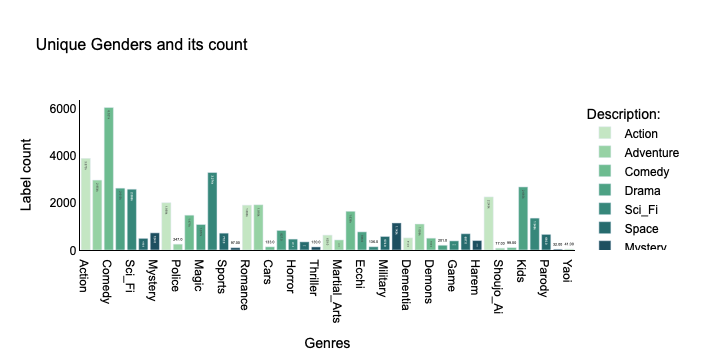

In [62]:
fig = px.bar(anime, x = list(counts.keys()), y = counts.values(), text_auto = '.4s',
            title = "Unique Genders and its count",
            labels = {"x": "Genres", "y": "Label count"},
            color = list(counts.keys()), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

## 3.5 Genres Feature get_dummies

Next, it will be created new features using "`Dummies`" based on the feature "`Genres`" with the separator space " ". Example learned on "Python | Pandas Series.str.get_dummies()" (GeeksforGeeks, 2018), and next creating a new data frame called "`anime_genres`" after "concat" the features "Anime_ID and Name" with the dummies data frame.

In [63]:
dummies = anime["Genres"].str.get_dummies(" ")
dummies

,Action,Adventure,Cars,Comedy,Dementia,Demons,Drama,Ecchi,Fantasy,Game,Harem,Hentai,Historical,Horror,Josei,Kids,Magic,Martial_Arts,Mecha,Military,Music,Mystery,Parody,Police,Psychological,Romance,Samurai,School,Sci_Fi,Seinen,Shoujo,Shoujo_Ai,Shounen,Shounen_Ai,Slice_of_Life,Space,Sports,Super_Power,Supernatural,Thriller,Vampire,Yaoi,Yuri
0,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17557,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
17558,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
17559,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
17560,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [64]:
anime_genres = pd.concat([anime[["Anime_ID", "Name"]], dummies], axis = 1)
anime_genres

,Anime_ID,Name,Action,Adventure,Cars,Comedy,Dementia,Demons,Drama,Ecchi,Fantasy,Game,Harem,Hentai,Historical,Horror,Josei,Kids,Magic,Martial_Arts,Mecha,Military,Music,Mystery,Parody,Police,Psychological,Romance,Samurai,School,Sci_Fi,Seinen,Shoujo,Shoujo_Ai,Shounen,Shounen_Ai,Slice_of_Life,Space,Sports,Super_Power,Supernatural,Thriller,Vampire,Yaoi,Yuri
0,1,Cowboy Bebop,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,5,Cowboy Bebop: Tengoku no Tobira,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,6,Trigun,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,7,Witch Hunter Robin,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,8,Bouken Ou Beet,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17557,48481,Daomu Biji Zhi Qinling Shen Shu,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
17558,48483,Mieruko-chan,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
17559,48488,Higurashi no Naku Koro ni Sotsu,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
17560,48491,Yama no Susume: Next Summit,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


Next, getting all Numerical features from the new data frame "anime_genres" converting in the list, removing the first Indice 0 that was the name of "Anime_ID" feature and creating a filter with the sum of all features and converting it "to_dict" and plotting it. 

In [65]:
numeric_anime_genres_cols = anime_genres.select_dtypes(exclude = ['object']).columns.to_list()
numeric_anime_genres_cols.pop(0)

filter_anime_genres = anime_genres[numeric_anime_genres_cols].sum().to_dict()

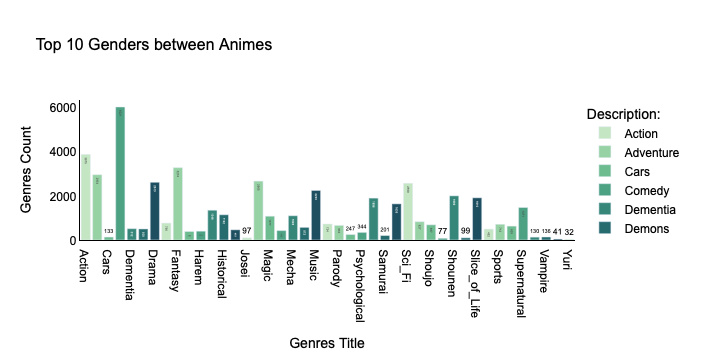

In [66]:
fig = px.bar(x = filter_anime_genres.keys(), y = filter_anime_genres.values(),
             text_auto = '.4', title = "Top 10 Genders between Animes",
             labels = {"x": "Genres Title", "y": "Genres Count"},
             color = filter_anime_genres.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

## 3.6 Feature Creation

Next, creating a new feature called "`Score_Total`" with the sum of the features: "Score_10, Score_9, Score_8, Score_7, Score_6, Score_5, Score_4, Score_3, Score_2 and Score_1" and getting the "`Head`" of it.

In [67]:
anime["Score_Total"] = (anime['Score_10'] + anime['Score_9'] + anime['Score_8'] + anime['Score_7'] + anime['Score_6'] + anime['Score_5'] + anime['Score_4'] + anime['Score_3'] + anime['Score_2'] + anime['Score_1'])
anime[["Name", "Genres", "Score_Total"]].head()

,Name,Genres,Score_Total
0,Cowboy Bebop,Action Adventure Comedy Drama Sci_Fi Space,641705.0
1,Cowboy Bebop: Tengoku no Tobira,Action Drama Mystery Sci_Fi Space,160349.0
2,Trigun,Action Sci_Fi Adventure Comedy Drama Shounen,286146.0
3,Witch Hunter Robin,Action Mystery Police Supernatural Drama Magic,39094.0
4,Bouken Ou Beet,Adventure Fantasy Shounen Supernatural,5923.0


# 4. Exploratory Data Analysis

This stage will cover some approaches to analyse the distribution of the features using "`dist plot, kde plot, hist plot and count plot`" graphics, and more analysis using graphics such as "`bar, treemap and histogram`" for the features: Name, Score, Genres, Type, Premiered, Producers, Studios, Source, Rating, Ranked, Popularity, Members, Favorites, Watching, Completed, On_Hold, Dropped and Plan_to_Watch.

## 4.1 Checking Data Distribution

Getting the feature names of all numerical and categorical features and storing them in the variables "numerical_cols and categorical_cols" respectively.

In [68]:
numerical_cols = anime.select_dtypes(exclude = ['object']).columns
categorical_cols = anime.select_dtypes(include = ['object']).columns

Checking the distribution of each numerical feature using a "`distplot and kdeplot`" returning their respective distribution and density, also how skewed these features are to the left or right, or in case of a normal distribution, and points of mean and median in the distribution also with their Standard Deviation value.

Feature: Anime_ID
Skew: -0.05
Mean: 21389.30, Median: 22617.00
Standard Deviation: 14890.14


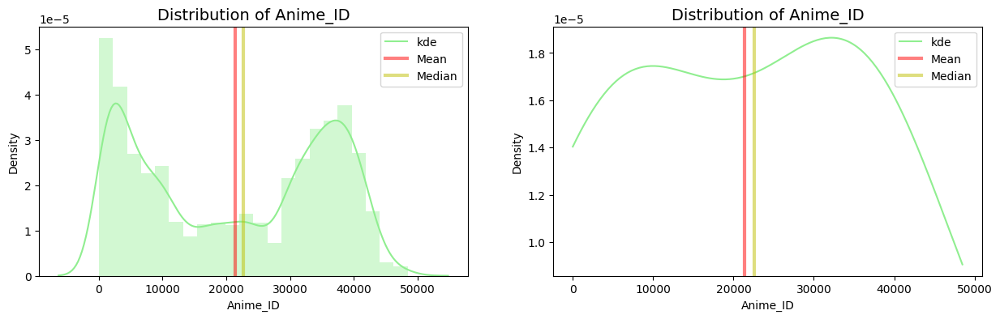

Feature: Score
Skew: -0.28
Mean: 6.51, Median: 6.52
Standard Deviation: 0.75


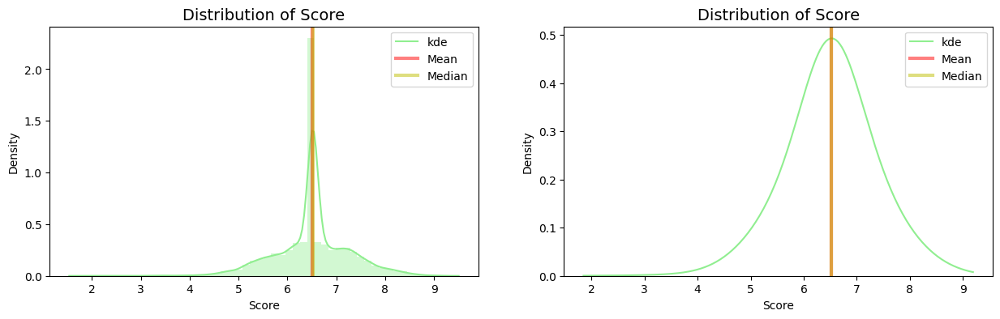

Feature: Episodes
Skew: 32.36
Mean: 11.29, Median: 2.00
Standard Deviation: 46.80


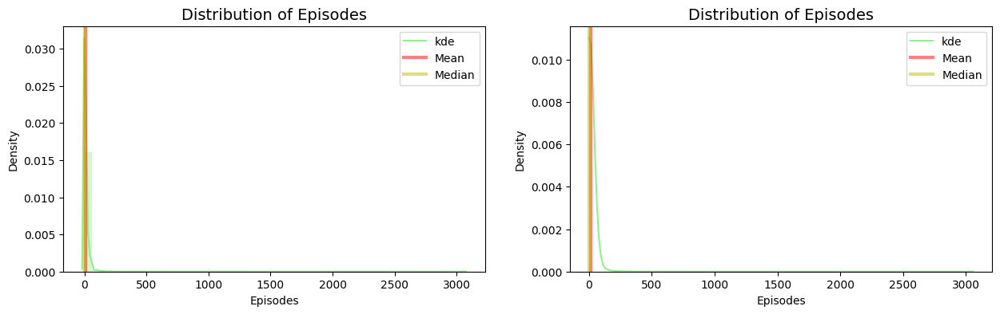

Feature: Ranked
Skew: 0.0
Mean: 7876.84, Median: 7870.00
Standard Deviation: 4324.73


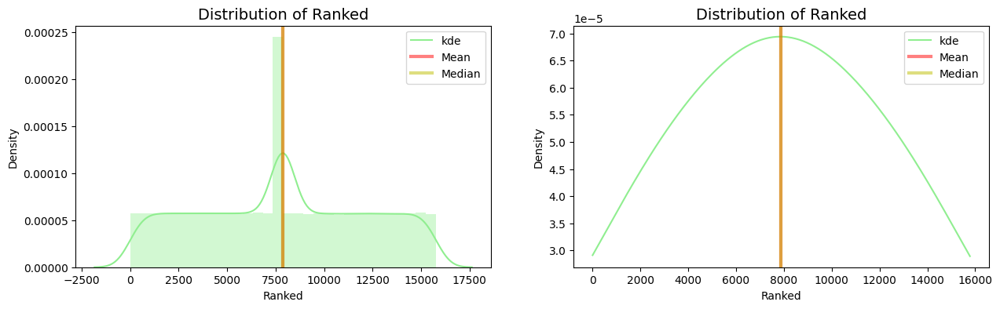

Feature: Popularity
Skew: 0.0
Mean: 8746.74, Median: 8735.00
Standard Deviation: 5059.82


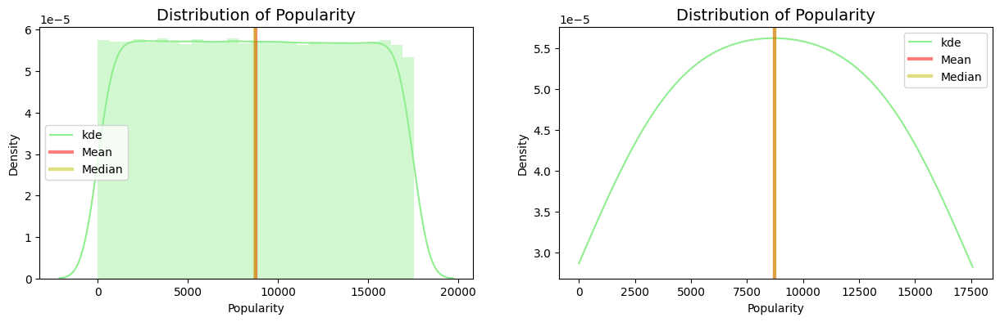

Feature: Members
Skew: 8.08
Mean: 34832.36, Median: 2081.00
Standard Deviation: 125612.54


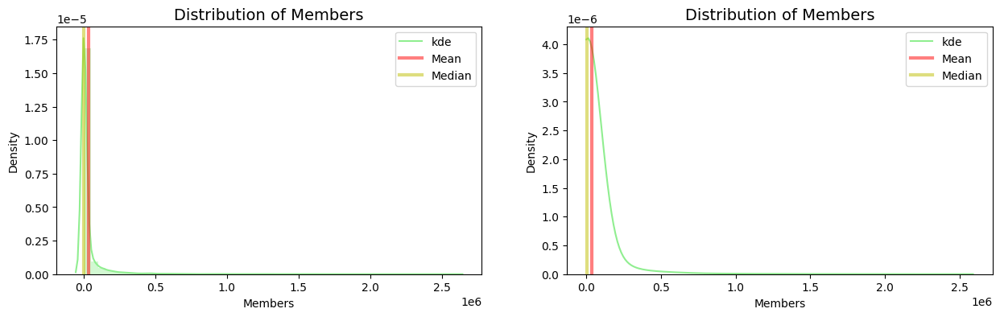

Feature: Favorites
Skew: 22.9
Mean: 460.27, Median: 3.00
Standard Deviation: 4074.84


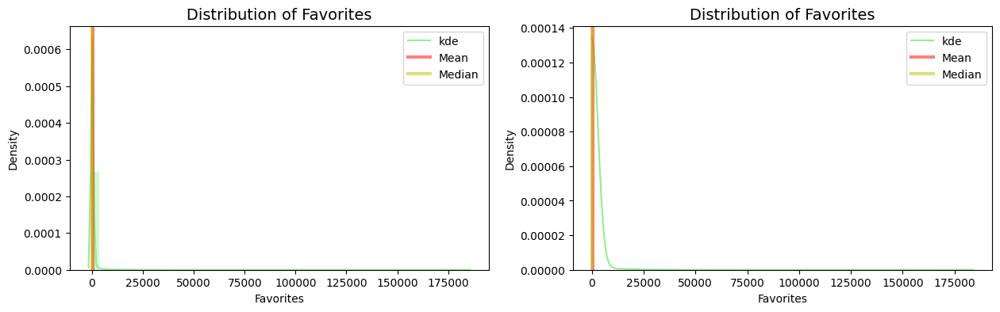

Feature: Watching
Skew: 29.01
Mean: 2244.07, Median: 75.00
Standard Deviation: 14085.45


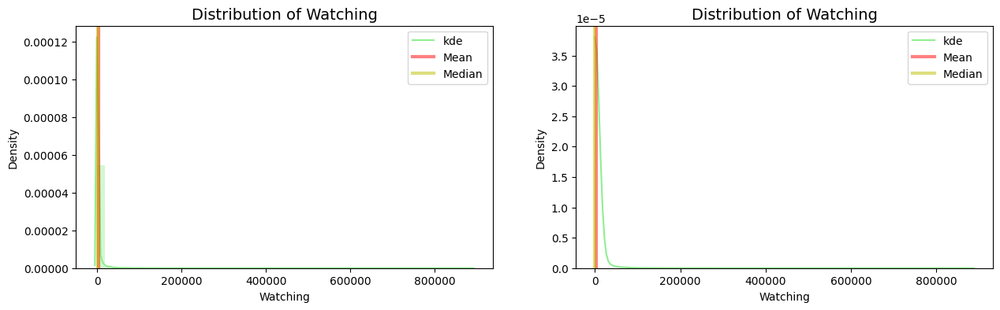

Feature: Completed
Skew: 9.66
Mean: 22220.12, Median: 840.00
Standard Deviation: 91251.73


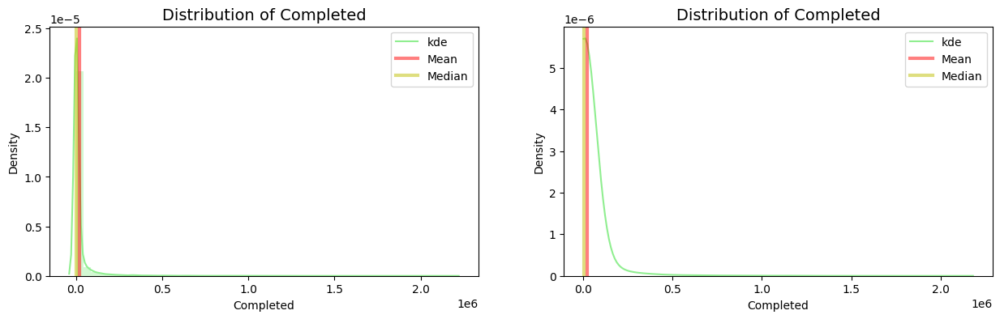

Feature: On_Hold
Skew: 14.73
Mean: 960.44, Median: 46.00
Standard Deviation: 4287.18


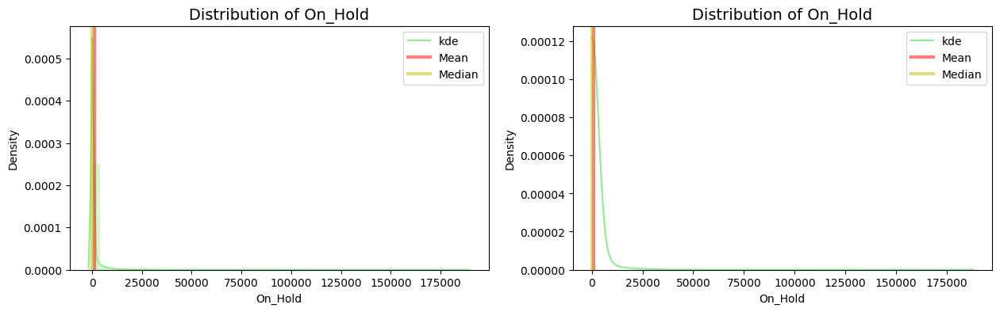

Feature: Dropped
Skew: 12.63
Mean: 1183.16, Median: 78.00
Standard Deviation: 4752.97


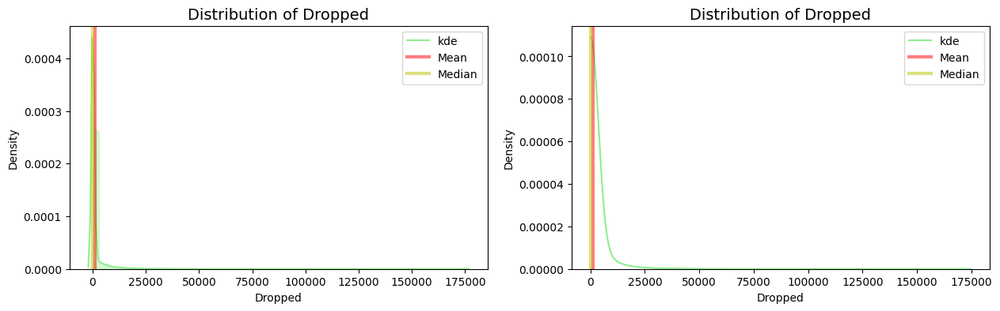

Feature: Plan_to_Watch
Skew: 5.65
Mean: 8224.58, Median: 758.00
Standard Deviation: 23827.32


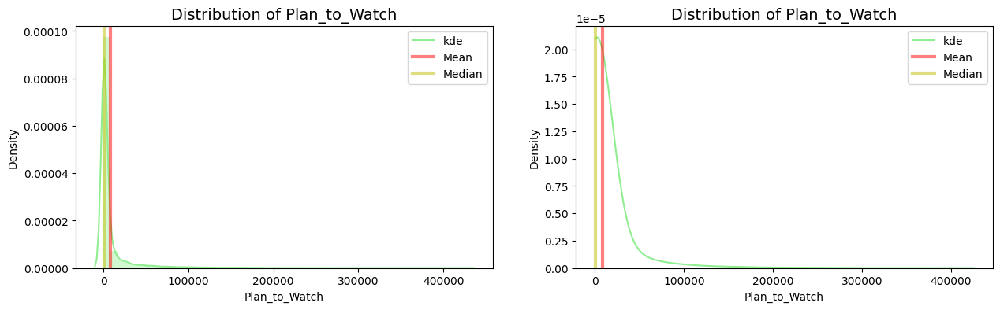

Feature: Score_10
Skew: 18.78
Mean: 2497.75, Median: 39.00
Standard Deviation: 16919.22


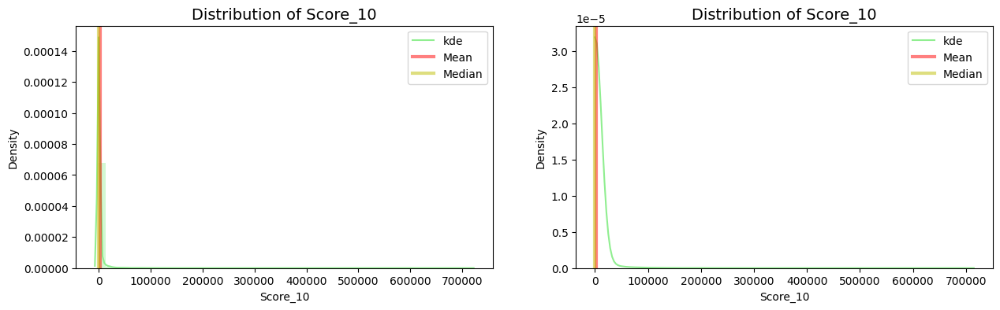

Feature: Score_9
Skew: 12.58
Mean: 3231.88, Median: 71.00
Standard Deviation: 18118.77


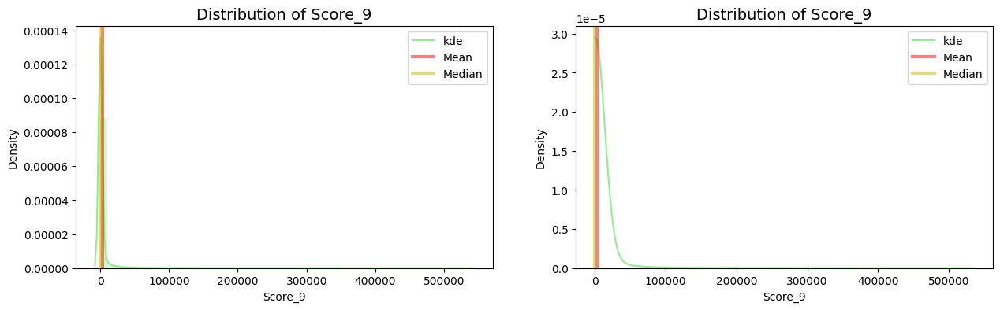

Feature: Score_8
Skew: 9.43
Mean: 4500.85, Median: 93.00
Standard Deviation: 19871.98


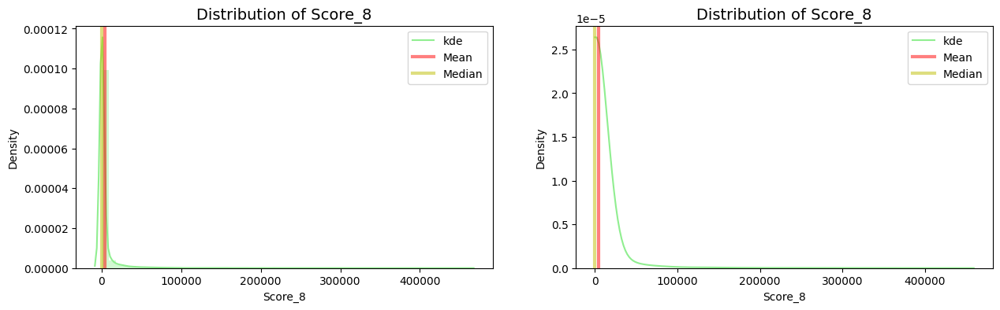

Feature: Score_7
Skew: 7.95
Mean: 3908.48, Median: 142.00
Standard Deviation: 14120.81


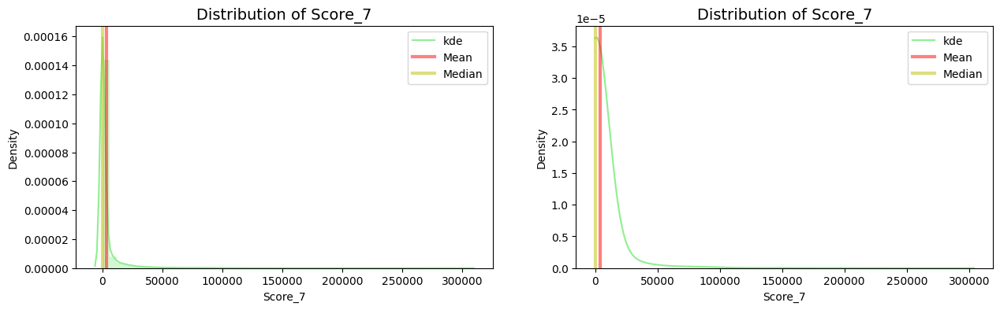

Feature: Score_6
Skew: 8.54
Mean: 1921.65, Median: 146.00
Standard Deviation: 6391.17


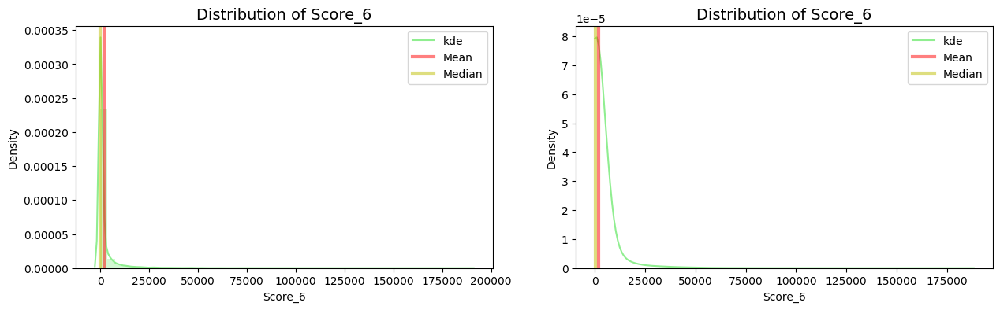

Feature: Score_5
Skew: 10.85
Mean: 966.19, Median: 113.00
Standard Deviation: 3213.89


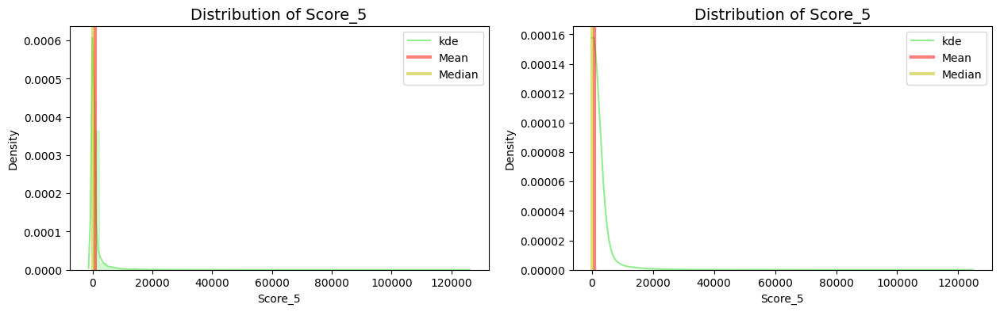

Feature: Score_4
Skew: 16.01
Mean: 433.34, Median: 50.00
Standard Deviation: 1706.39


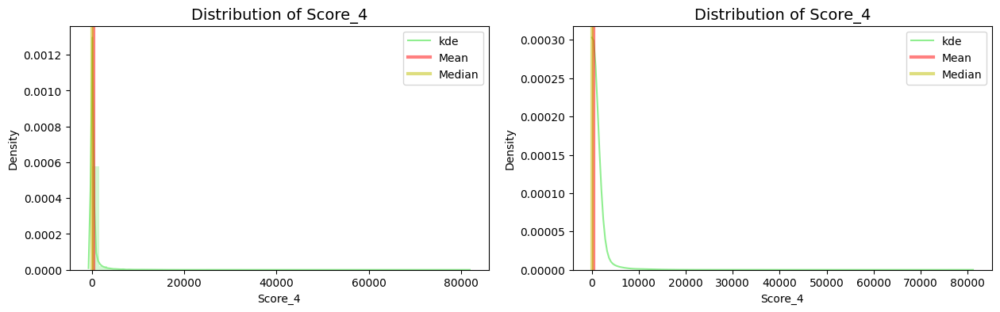

Feature: Score_3
Skew: 19.23
Mean: 199.96, Median: 27.00
Standard Deviation: 847.44


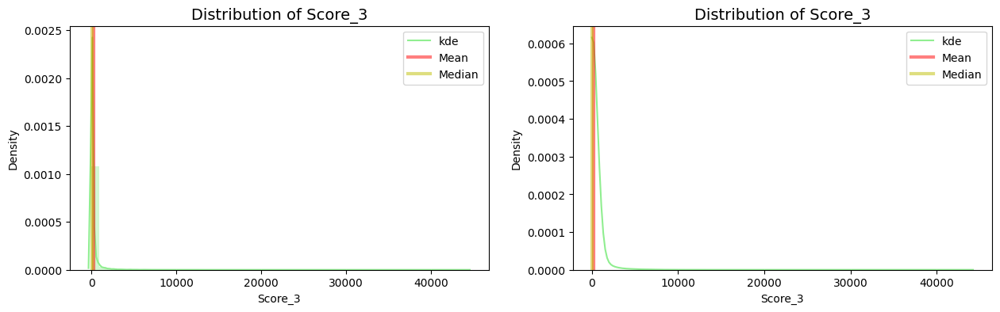

Feature: Score_2
Skew: 20.05
Mean: 118.94, Median: 18.00
Standard Deviation: 549.45


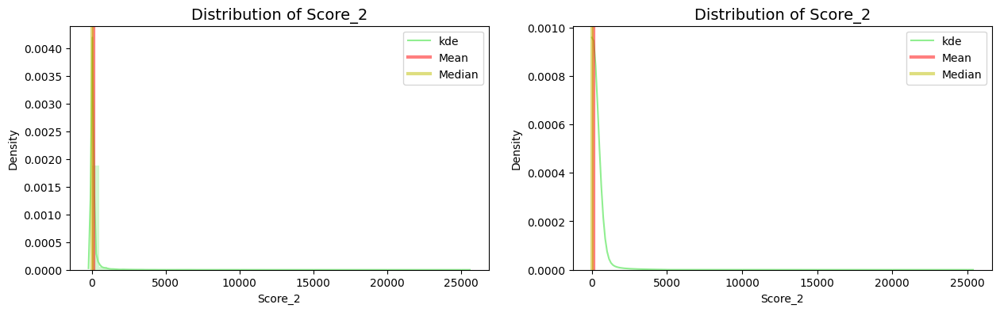

Feature: Score_1
Skew: 23.86
Mean: 120.88, Median: 16.00
Standard Deviation: 667.85


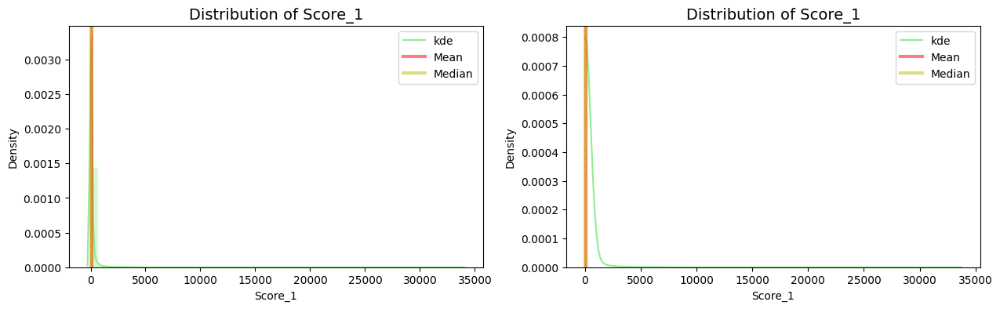

Feature: Score_Total
Skew: 9.82
Mean: 17899.91, Median: 715.00
Standard Deviation: 74891.42


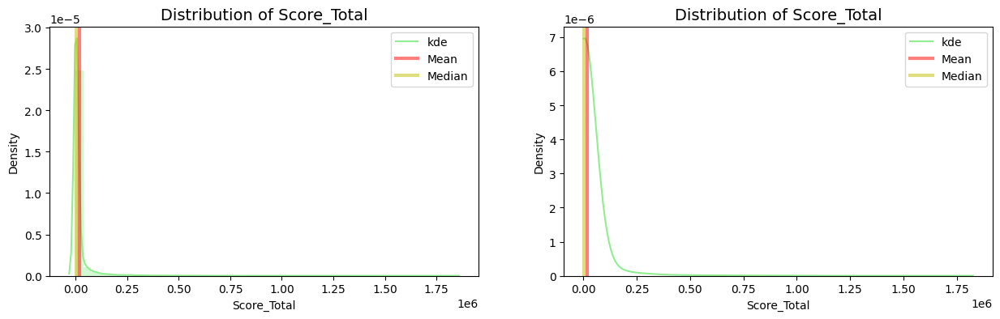

In [69]:
for col in numerical_cols:
    print('Feature:', col)
    print('Skew:', round(anime[col].skew(), 2))
    print('Mean: {:.2f}, Median: {:.2f}'.format(anime[col].mean(), anime[col].median()))
    print('Standard Deviation: {:.2f}'.format(anime[col].std()))
    
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    sns.distplot(anime[col], axlabel = col, color = "lightgreen");
    plt.axvline(anime[col].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
    plt.axvline(anime[col].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
    plt.title("Distribution of " + col, size = 14)
    plt.legend(["kde", "Mean", "Median"])
    
    plt.subplot(1, 2, 2)
    sns.kdeplot(data = anime, x = col, bw_adjust = 5, cut = 0, color = "lightgreen")
    plt.axvline(anime[col].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
    plt.axvline(anime[col].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
    plt.title("Distribution of " + col, size = 14)
    plt.legend(["kde", "Mean", "Median"])
    plt.show()

Also, to check from another perspective, it was created a "`hist plot and boxplot`" with numerical features.

Feature: Anime_ID
Skew: -0.05


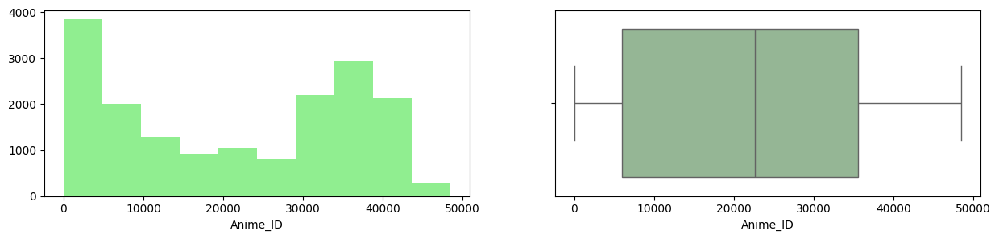

Feature: Score
Skew: -0.28


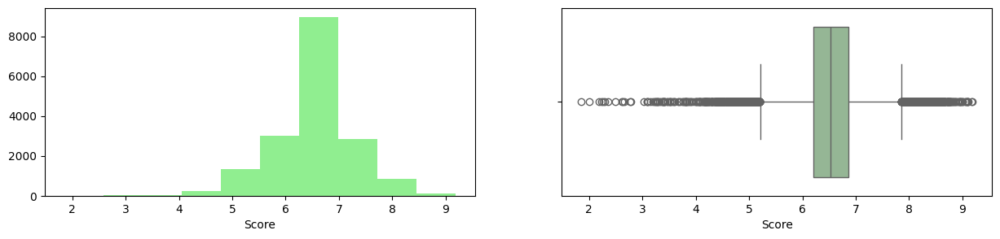

Feature: Episodes
Skew: 32.36


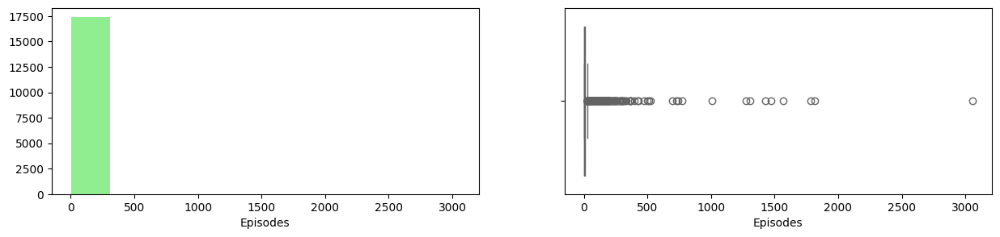

Feature: Ranked
Skew: 0.0


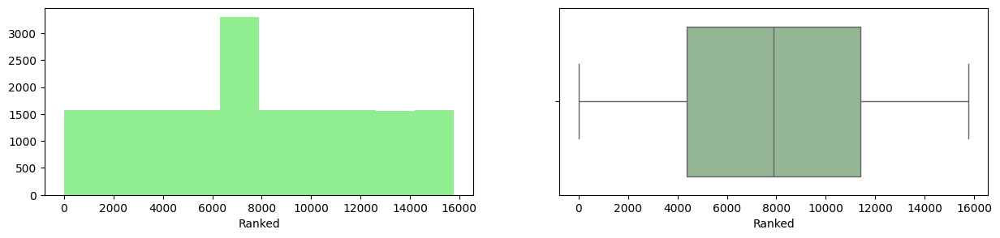

Feature: Popularity
Skew: 0.0


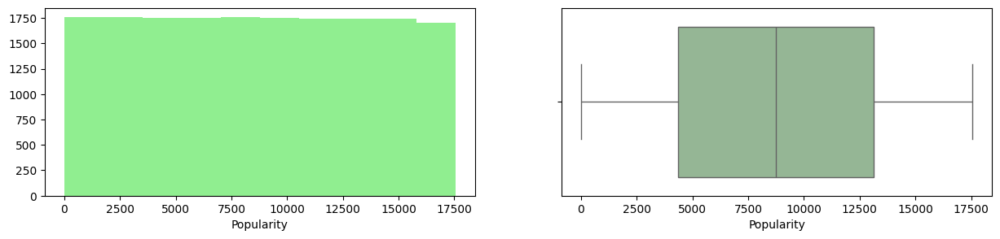

Feature: Members
Skew: 8.08


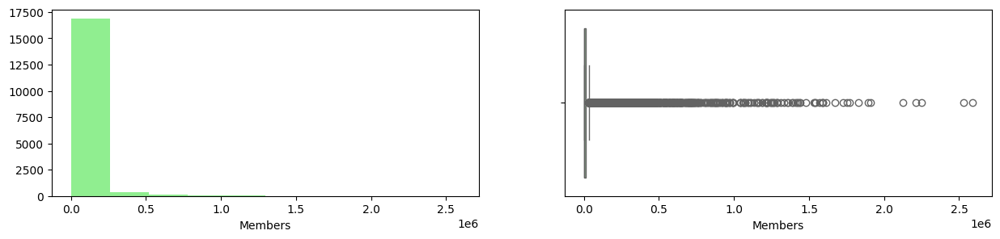

Feature: Favorites
Skew: 22.9


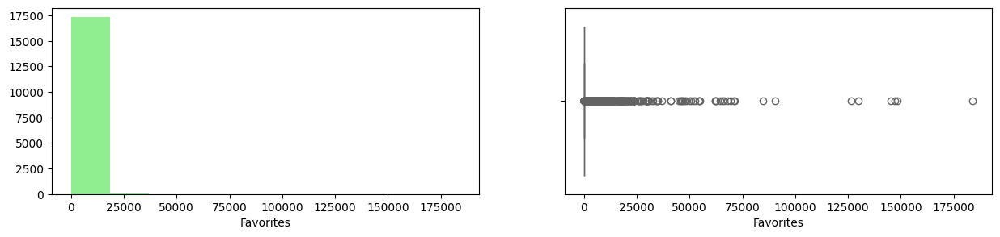

Feature: Watching
Skew: 29.01


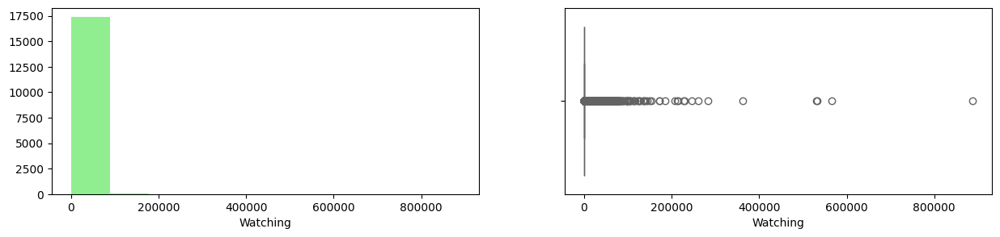

Feature: Completed
Skew: 9.66


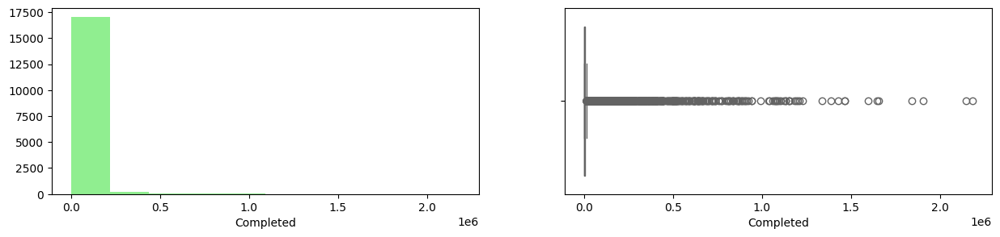

Feature: On_Hold
Skew: 14.73


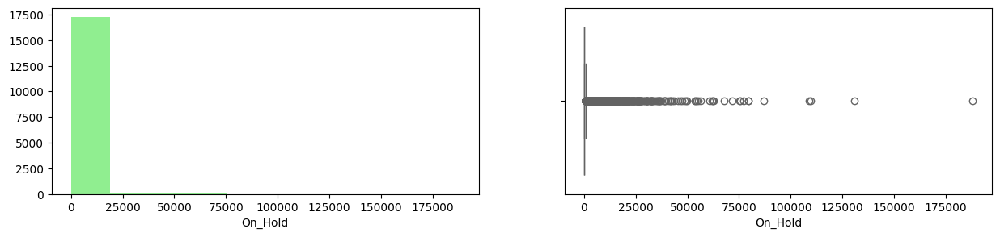

Feature: Dropped
Skew: 12.63


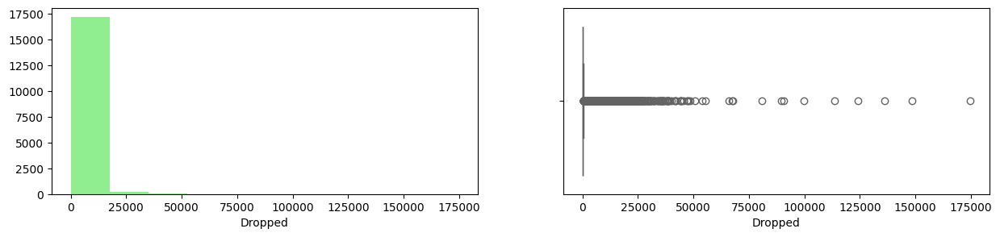

Feature: Plan_to_Watch
Skew: 5.65


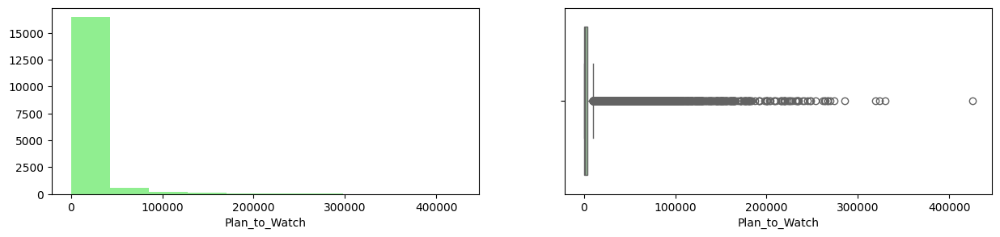

Feature: Score_10
Skew: 18.78


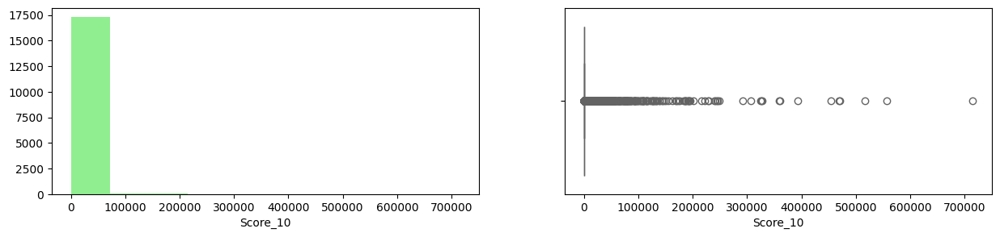

Feature: Score_9
Skew: 12.58


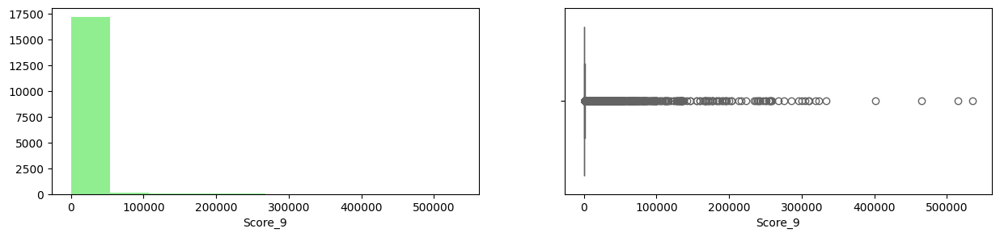

Feature: Score_8
Skew: 9.43


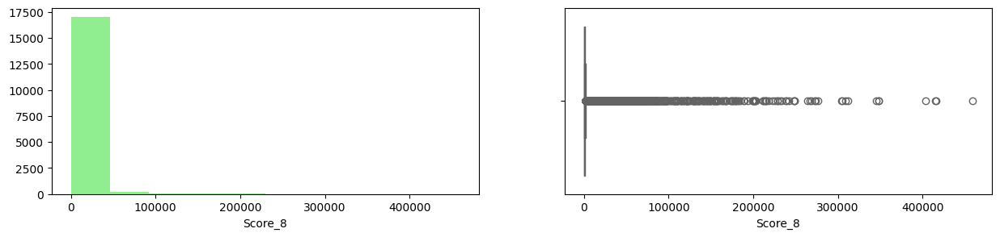

Feature: Score_7
Skew: 7.95


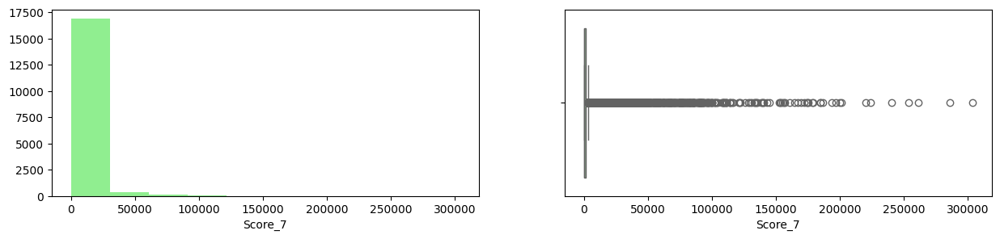

Feature: Score_6
Skew: 8.54


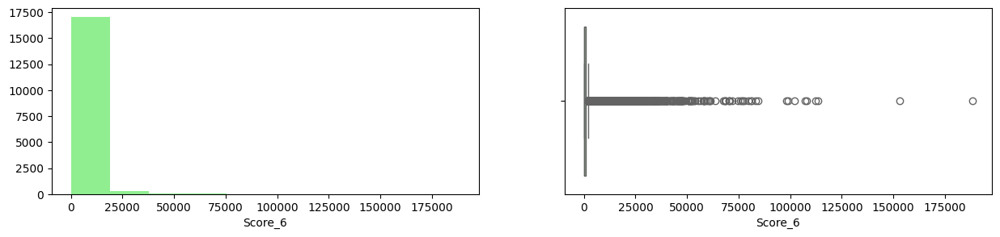

Feature: Score_5
Skew: 10.85


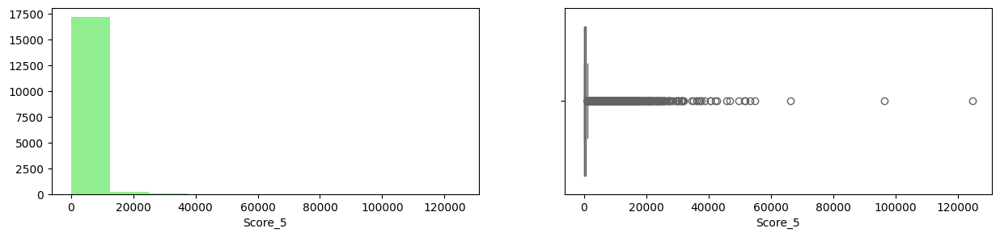

Feature: Score_4
Skew: 16.01


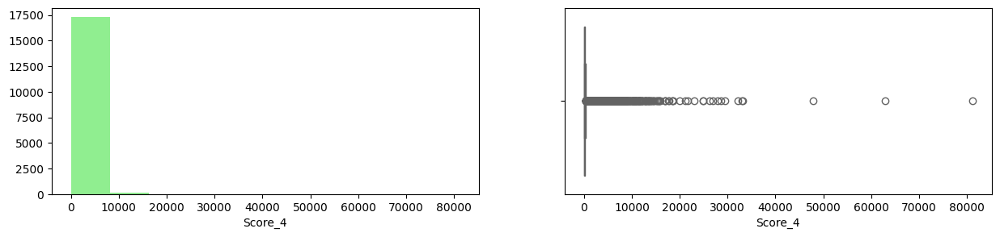

Feature: Score_3
Skew: 19.23


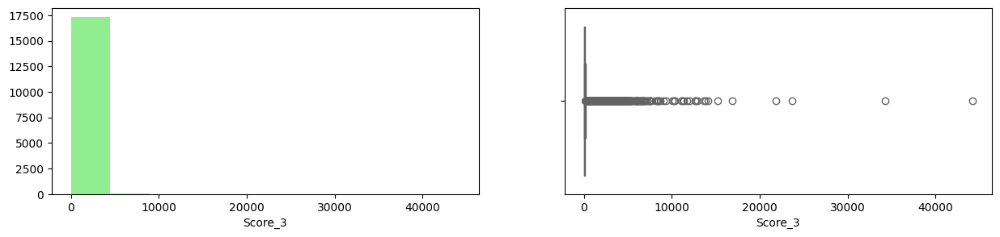

Feature: Score_2
Skew: 20.05


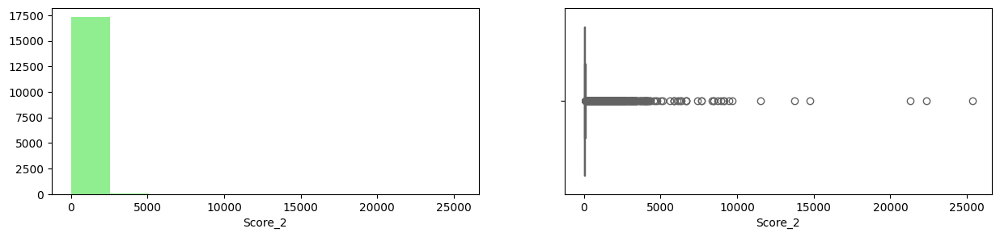

Feature: Score_1
Skew: 23.86


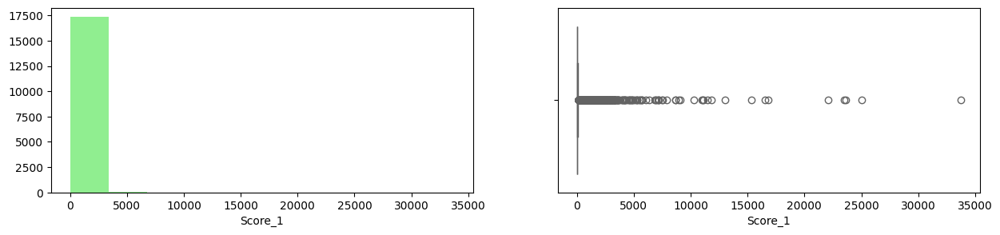

Feature: Score_Total
Skew: 9.82


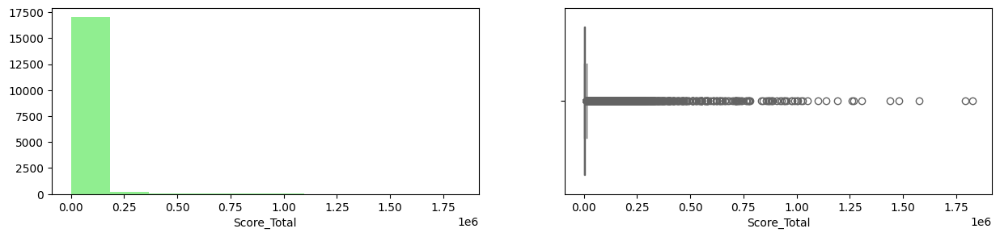

In [70]:
for col in numerical_cols:
    print("Feature: " + col)
    print('Skew:', round(anime[col].skew(), 2))
    
    plt.figure(figsize = (15, 3))
    
    plt.subplot(1, 2, 1)
    anime[col].hist(grid = False, color = "lightgreen")
    plt.xlabel(col)
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x = anime[col], color = "darkseagreen")
    plt.show()

Next created a "`countplot`" to visualise all categorical features, it opted to remove the description of all features using "plt.xticks([])" once there were too many values to show and turned the result into a big mess, in this case, the main goal is to show how the values are in the categorical features.

Bar plot for all categorical variables in the dataset:



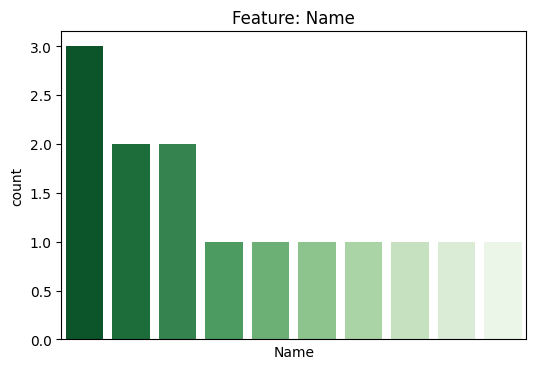

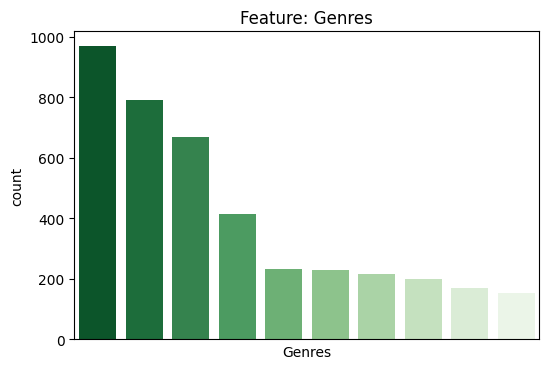

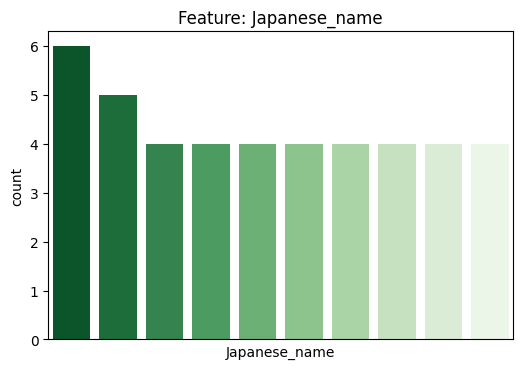

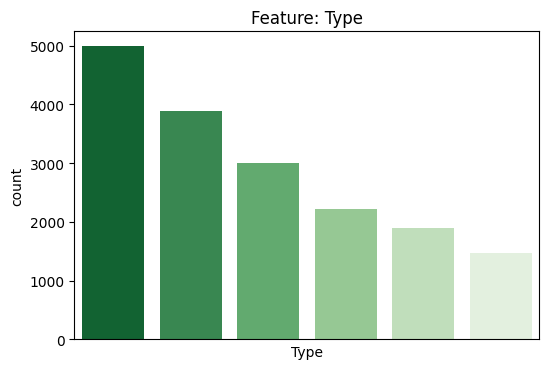

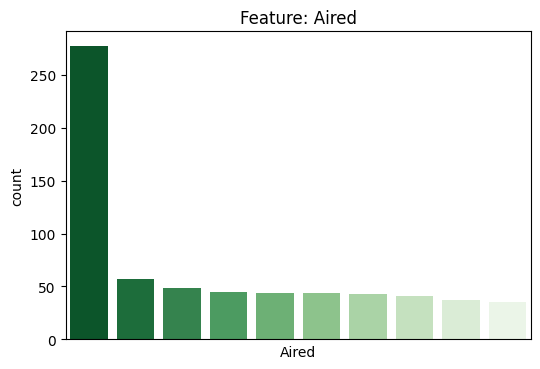

...

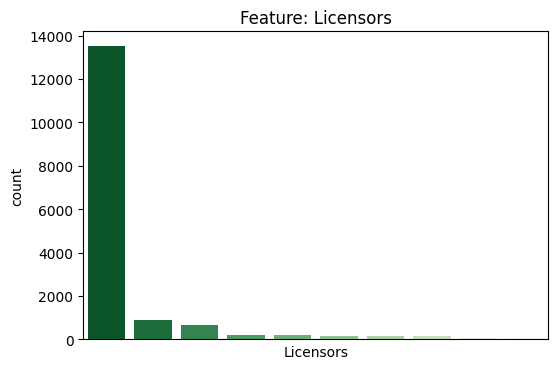

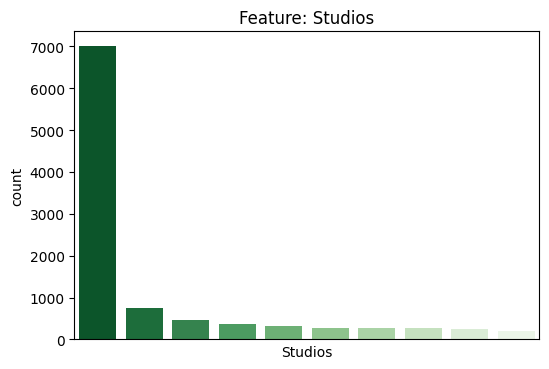

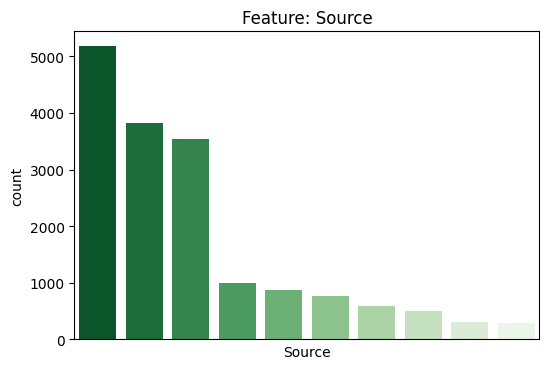

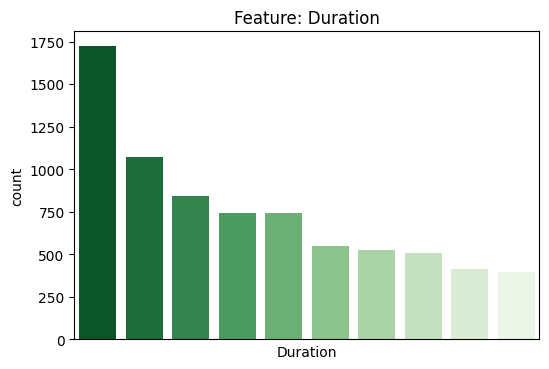

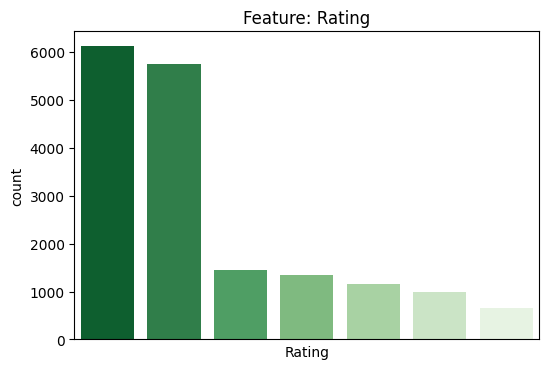

In [71]:
print("Bar plot for all categorical variables in the dataset:\n")

for col, i in zip(categorical_cols, range(len(categorical_cols))):
    plt.figure(figsize = (6, 4))
    sns.countplot(x = col, data = anime, palette = "Greens_r", order = anime[col].value_counts().nlargest(10).index);
    plt.title('Feature: ' + col)
    plt.xticks([])
    plt.show()

## 4.2 Analysis

Next, different graphs with several columns were created to analyse and better understand how the data information is distributed and perform analyses receiving simple answers, such as what are the top 10 genres, which is the largest studio that makes anime, or which is the best producers, best score, number of people who watched the anime, who are watching, who are on pause, who gave up or are planning to watch, and so on.

Next, checking with "`Head`" which features could be interesting to be analysed.

In [72]:
anime[['Name', 'Score', 'Genres', 'Type', 'Premiered', 'Producers', 'Studios', 
       'Source', 'Rating', 'Ranked', 'Popularity', 'Members', 'Favorites', 
       'Watching', 'Completed', 'On_Hold', 'Dropped', 'Plan_to_Watch']].head(3)

,Name,Score,Genres,Type,Premiered,Producers,Studios,Source,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch
0,Cowboy Bebop,8.78,Action Adventure Comedy Drama Sci_Fi Space,TV,Spring 1998,Bandai Visual,Sunrise,Original,R - 17+ (violence & profanity),28.0,39,1251960,61971,105808,718161,71513,26678,329800
1,Cowboy Bebop: Tengoku no Tobira,8.39,Action Drama Mystery Sci_Fi Space,Movie,Unknown,"Sunrise, Bandai Visual",Bones,Original,R - 17+ (violence & profanity),159.0,518,273145,1174,4143,208333,1935,770,57964
2,Trigun,8.24,Action Sci_Fi Adventure Comedy Drama Shounen,TV,Spring 1998,Victor Entertainment,Madhouse,Manga,PG-13 - Teens 13 or older,266.0,201,558913,12944,29113,343492,25465,13925,146918


Next, used a "`bar`" to plot the **Top 10 Genders between Animes**, The top 10 Genres are: "Comedy, Action, Fantasy, Adventure, Kids, Drama, Sci_Fi, Music, Shounen and Slice_of_Life".

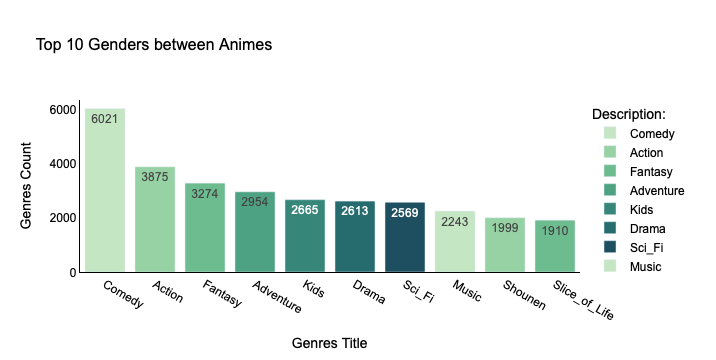

In [73]:
filter_anime_genres = anime_genres[numeric_anime_genres_cols].sum().nlargest(10).to_dict()

fig = px.bar(x = filter_anime_genres.keys(), y = filter_anime_genres.values(),
             text_auto = '.4', title = "Top 10 Genders between Animes",
             labels = {"x": "Genres Title", "y": "Genres Count"},
             color = filter_anime_genres.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Types of Animes**, they are: "TV, OVA, Movie, Special, ONA and Music"

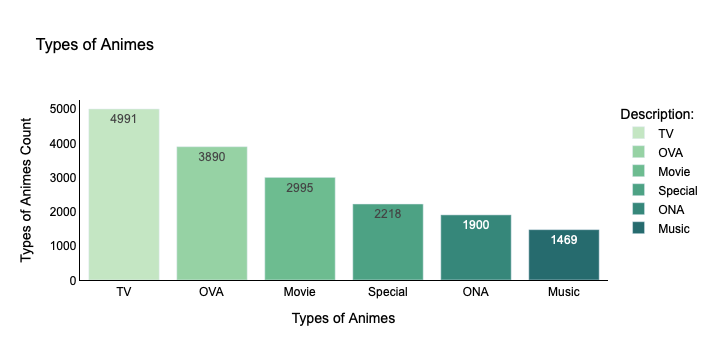

In [74]:
types_anime = anime["Type"].value_counts().to_dict()

fig = px.bar(x = types_anime.keys(), y = types_anime.values(),
             text_auto = ".6", title = "Types of Animes",
             labels = {"x": "Types of Animes", "y": "Types of Animes Count"},
             color = types_anime.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of Animes** with the highest score acquired by the community, they are: "Maou Gakuin no Futekigousha, Hinamatsuri, Youkoso! Ecolo Shima, Fullmetal Alchemist: Brotherhood and Shingeki no Kyojin: The Final Season".

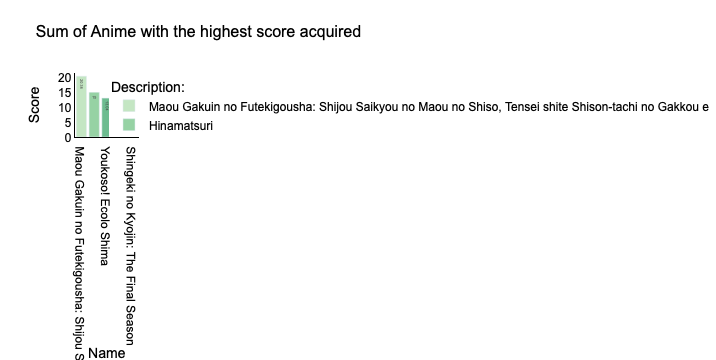

In [75]:
filter_score = anime.groupby("Name")["Score"].sum().nlargest(5)
filter_score = filter_score.to_frame().reset_index()

fig = px.bar(filter_score, x = "Name", y = "Score", 
             text_auto = ".6", title = "Sum of Anime with the highest score acquired",
             labels = {"x": "Title of Animes", "y": "Score of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the animes that received the most ratings from 1 to 10** by the community, they are: "Death Note, Shingeki no Kyojin, Sword Art Online, One Punch Man and Fullmetal Alchemist: Brotherhood".

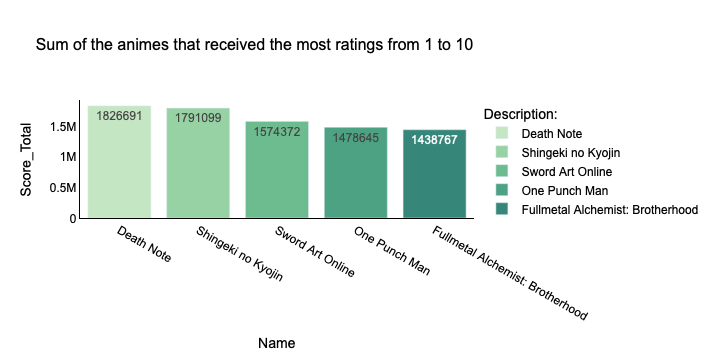

In [76]:
filter_score_total = anime.groupby("Name")["Score_Total"].sum().nlargest(5)
filter_score_total = filter_score_total.to_frame().reset_index()

fig = px.bar(filter_score_total, x = "Name", y = "Score_Total", 
             text_auto = ".10", title = "Sum of the animes that received the most ratings from 1 to 10",
             labels = {"x": "Title of Animes", "y": "Score of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Top 5 Sum of the animes that received the highest Score: 10** by the community, they are: "Fullmetal Alchemist: Brotherhood, Death Note, Kimi no Na wa., Shingeki no Kyojin and Steins;Gate".

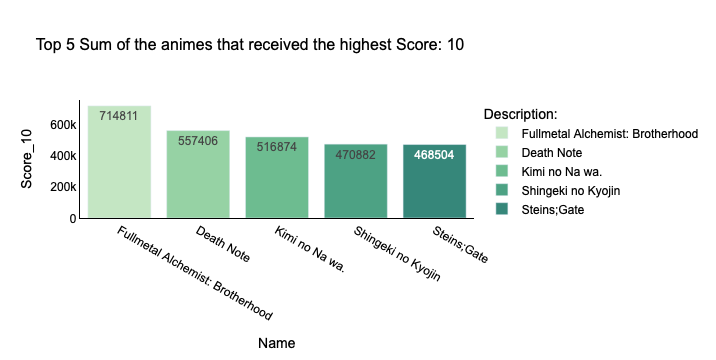

In [77]:
filter_score_10 = anime.groupby("Name")["Score_10"].sum().nlargest(5)
filter_score_10 = filter_score_10.to_frame().reset_index()

fig = px.bar(filter_score_10, x = "Name", y = "Score_10", 
             text_auto = ".10", title = "Top 5 Sum of the animes that received the highest Score: 10",
             labels = {"x": "Title of Animes", "y": "Score of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Top 5 Sum of the animes that received the worst Score: 1** by the community, they are: "Boku no Pico, School Days, Pupa, Sword Art Online and Hametsu no Mars".

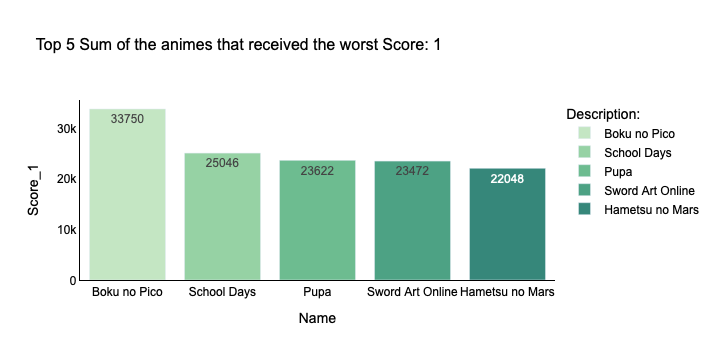

In [78]:
filter_score_1 = anime.groupby("Name")["Score_1"].sum().nlargest(5)
filter_score_1 = filter_score_1.to_frame().reset_index()

fig = px.bar(filter_score_1, x = "Name", y = "Score_1", 
             text_auto = ".10", title = "Top 5 Sum of the animes that received the worst Score: 1",
             labels = {"x": "Title of Animes", "y": "Score of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Top 5 Producers** of Animes ignoring "Unknown" values if exist, they are: "NHK, Pink Pineapple, Sanrio, Bandai Visual and Fuji TV".

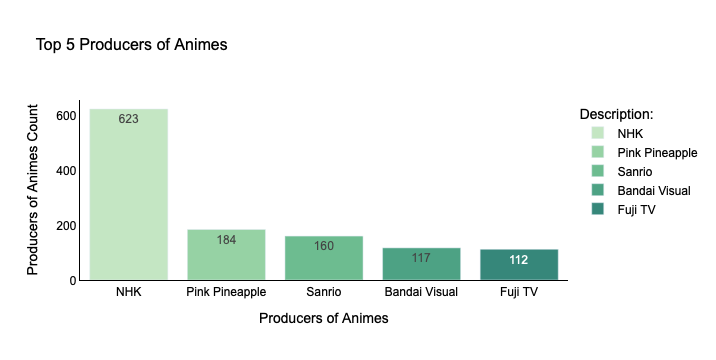

In [79]:
filter_producers = anime["Producers"][anime["Producers"] != "Unknown"].value_counts().nlargest(5).to_dict()

fig = px.bar(x = filter_producers.keys(), y = filter_producers.values(),
             text_auto = '.3', title = "Top 5 Producers of Animes",
             labels = {"x": "Producers of Animes", "y": "Producers of Animes Count"},
             color = filter_producers.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Top 5 Studios** of Animes ignoring "Unknown" values if exist, they are: "Toei Animation, Sunrise, J.C.Staff, Madhouse and TMS Entertainment".

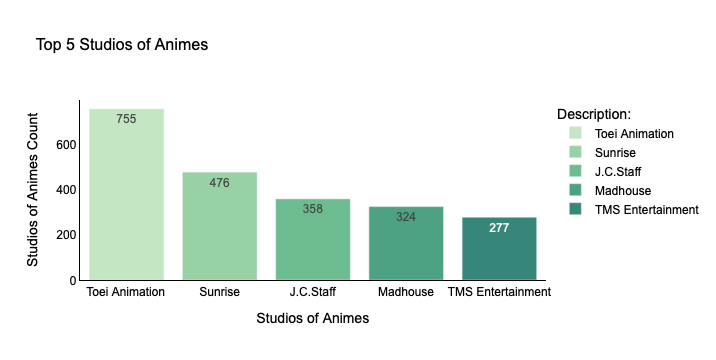

In [80]:
filter_studios = anime["Studios"][anime["Studios"] != "Unknown"].value_counts().nlargest(5).to_dict()

fig = px.bar(x = filter_studios.keys(), y = filter_studios.values(),
             text_auto = '.3', title = "Top 5 Studios of Animes",
             labels = {"x": "Studios of Animes", "y": "Studios of Animes Count"},
             color = filter_studios.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Top Sources** of Animes ignoring "Unknown" values if exist, they are: "Original, Manga, Visual novel, Game, Light novel, Other, Novel, Music, 4-koma manga, Web manga, Picture book, Book, Card game, Digital manga and Radio".

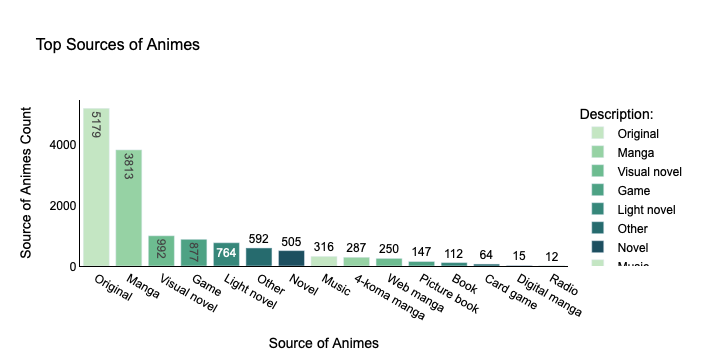

In [81]:
filter_source = anime["Source"][anime["Source"] != "Unknown"].value_counts().to_dict()

fig = px.bar(x = filter_source.keys(), y = filter_source.values(),
             text_auto = '.4', title = "Top Sources of Animes",
             labels = {"x": "Source of Animes", "y": "Source of Animes Count"},
             color = filter_source.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Rating description of Anime's most used** ignoring "Unknown" values if exist, they are: "PG-13 - Teens 13 or older, G - All Age, PG - Children, Rx - Hentai, R - 17+ (violence & profanity) and R+ - Mild Nudity".

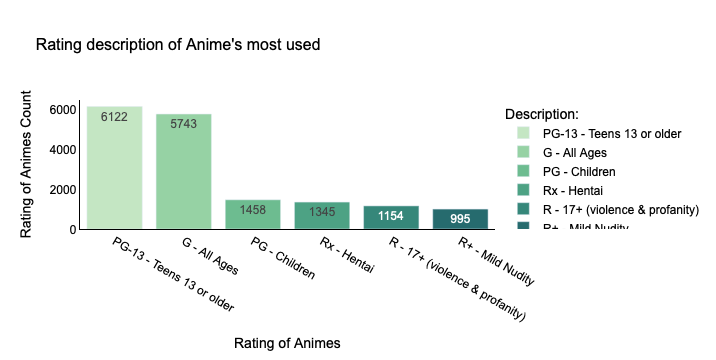

In [82]:
filter_rating = anime["Rating"][anime["Rating"] != "Unknown"].value_counts().to_dict()

fig = px.bar(x = filter_rating.keys(), y = filter_rating.values(),
             text_auto = '.4', title = "Rating description of Anime's most used",
             labels = {"x": "Rating of Animes", "y": "Rating of Animes Count"},
             color = filter_rating.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes with the highest Popularity acquired** by the community, they are: "Youkoso! Ecolo Shima, Yama no Susume: Next Summit, Tsuki to Laika to Nosferatu, Scarlet Nexus and Mieruko-chan".

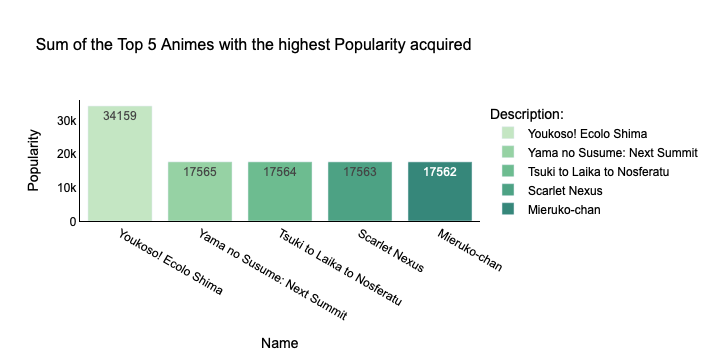

In [83]:
filter_ranked = anime.groupby("Name")["Popularity"].sum().nlargest(5)
filter_ranked = filter_ranked.to_frame().reset_index()

fig = px.bar(filter_ranked, x = "Name", y = "Popularity", 
             text_auto = '.6', title = "Sum of the Top 5 Animes with the highest Popularity acquired",
             labels = {"x": "Title of Animes", "y": "Popularity of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes with the highest Members acquired** by the community, they are: "Death Note, Shingeki no Kyojin, Fullmetal Alchemist: Brotherhood, Sword Art Online and One Punch Man".

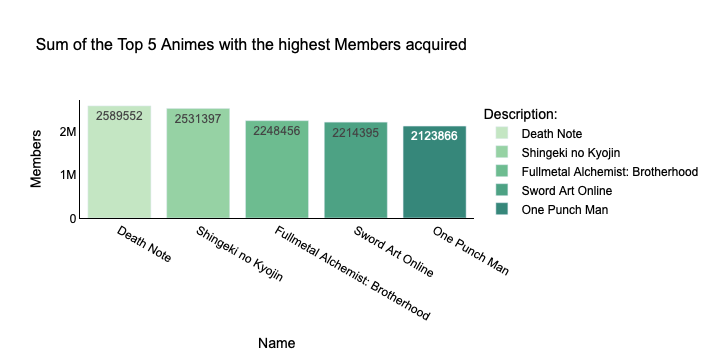

In [84]:
filter_members = anime.groupby("Name")["Members"].sum().nlargest(5)
filter_members = filter_members.to_frame().reset_index()

fig = px.bar(filter_members, x = "Name", y = "Members", 
             text_auto = '.10', title = "Sum of the Top 5 Animes with the highest Members acquired",
             labels = {"x": "Title of Animes", "y": "Members of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes with the highest Popularity acquired** by the community, they are: "Fullmetal Alchemist: Brotherhood, Steins;Gate, Hunter x Hunter (2011), Death Note and Shingeki no Kyojin".

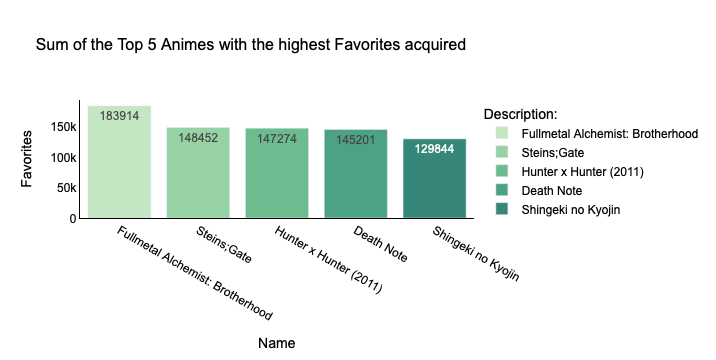

In [85]:
filter_favorites = anime.groupby("Name")["Favorites"].sum().nlargest(5)
filter_favorites = filter_favorites.to_frame().reset_index()

fig = px.bar(filter_favorites, x = "Name", y = "Favorites", 
             text_auto = '.10', title = "Sum of the Top 5 Animes with the highest Favorites acquired",
             labels = {"x": "Title of Animes", "y": "Favorites of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 animes being watched by users**, they are: "One Piece, Shingeki no Kyojin: The Final Season, Jujutsu Kaisen (TV), Black Clover and Naruto: Shippuuden".

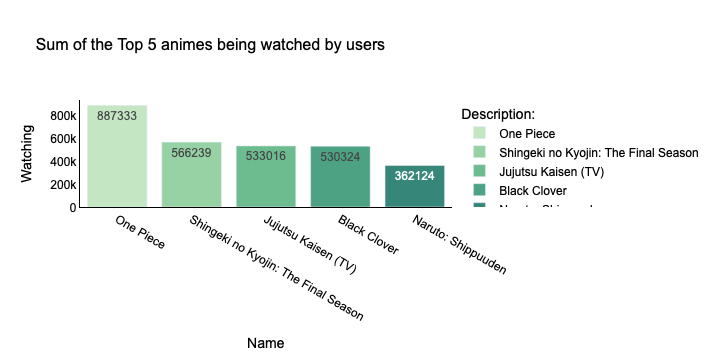

In [86]:
filter_watching = anime.groupby("Name")["Watching"].sum().nlargest(5)
filter_watching = filter_watching.to_frame().reset_index()

fig = px.bar(filter_watching, x = "Name", y = "Watching", 
             text_auto = '.10', title = "Sum of the Top 5 animes being watched by users",
             labels = {"x": "Title of Animes", "y": "Watching of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 animes watched by users**, they are: "Shingeki no Kyojin, Death Note, Sword Art Online, One Punch Man and Boku no Hero Academia".

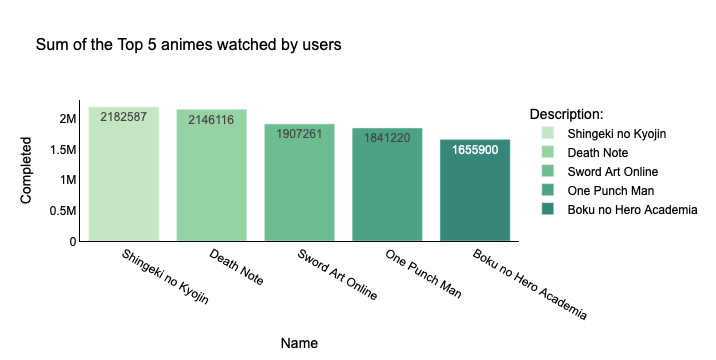

In [87]:
filter_completed = anime.groupby("Name")["Completed"].sum().nlargest(5)
filter_completed = filter_completed.to_frame().reset_index()

fig = px.bar(filter_completed, x = "Name", y = "Completed", 
             text_auto = '.10', title = "Sum of the Top 5 animes watched by users",
             labels = {"x": "Title of Animes", "y": "Completed of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes On Hold by Users**, they are: "One Piece, Bleach, Naruto: Shippuuden, Fairy Tail and Gintama".

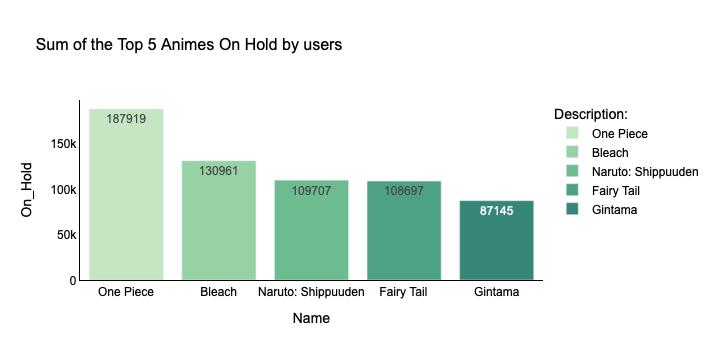

In [88]:
filter_on_hold = anime.groupby("Name")["On_Hold"].sum().nlargest(5)
filter_on_hold = filter_on_hold.to_frame().reset_index()

fig = px.bar(filter_on_hold, x = "Name", y = "On_Hold", 
             text_auto = '.10', title = "Sum of the Top 5 Animes On Hold by users",
             labels = {"x": "Title of Animes", "y": "On Hold of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes Dropped by Users**, they are: "Bleach, Fairy Tail, One Piece, Naruto: Shippuuden and Boruto: Naruto Next Generations".

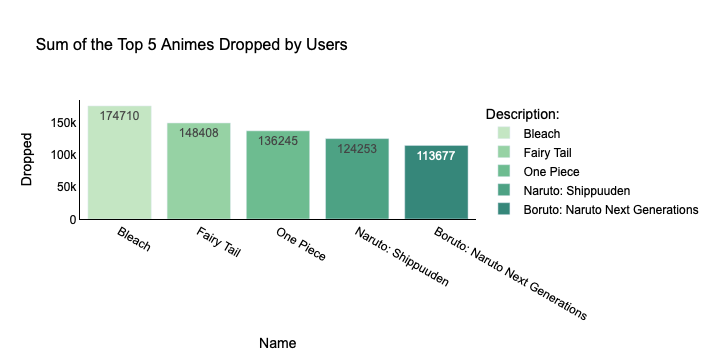

In [89]:
filter_droppeds = anime.groupby("Name")["Dropped"].sum().nlargest(5)
filter_droppeds = filter_droppeds.to_frame().reset_index()

fig = px.bar(filter_droppeds, x = "Name", y = "Dropped", 
             text_auto = '.10', title = "Sum of the Top 5 Animes Dropped by Users",
             labels = {"x": "Title of Animes", "y": "Dropped of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Sum of the Top 5 Animes plan to watch by users**, they are: "Steins;Gate, Cowboy Bebop, Fullmetal Alchemist: Brotherhood, Psycho-Pass and Kimetsu no Yaiba Movie: Mugen Ressha-hen".

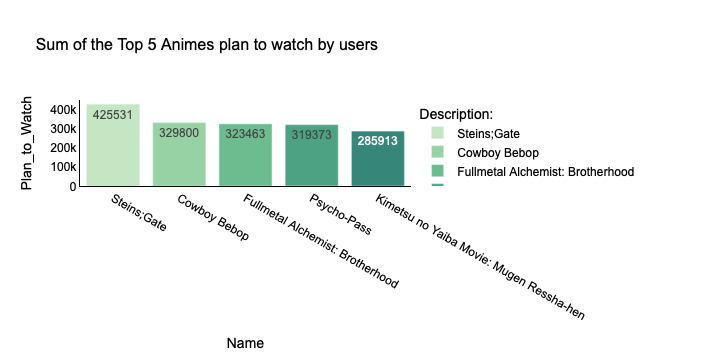

In [90]:
filter_plan_towatch = anime.groupby("Name")["Plan_to_Watch"].sum().nlargest(5)
filter_plan_towatch = filter_plan_towatch.to_frame().reset_index()

fig = px.bar(filter_plan_towatch, x = "Name", y = "Plan_to_Watch", 
             text_auto = '.10', title = "Sum of the Top 5 Animes plan to watch by users",
             labels = {"x": "Title of Animes", "y": "Plan to Watch of Animes Count"},
             color = "Name", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, used a "`treemap`" to plot the **Total of Score per Type of Animes**, they are: "TV, OVA, Movie, Special, ONA and Music". 

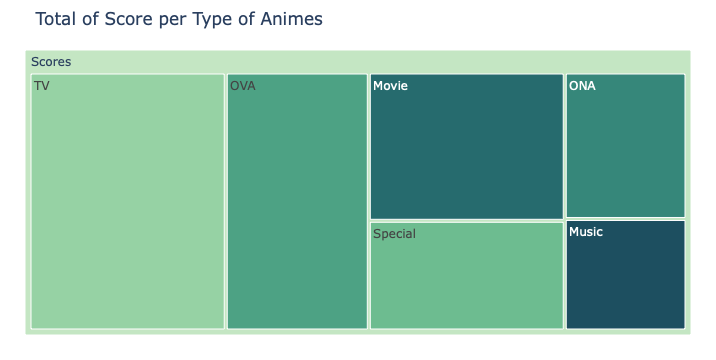

In [91]:
fig = px.treemap(anime, path = [px.Constant("Scores"), 'Type'], values = 'Score',
                 title = "Total of Score per Type of Animes",
                 color = 'Type', color_discrete_sequence = px.colors.sequential.Blugrn_r)

fig.update_layout(margin = dict(t = 50, l = 25, r = 25, b = 25))

fig.show()

Next, used a "`treemap`" to plot the **Total of Genres by Animes**, The top 5 Genres are: "Comedy, Action, Fantasy, Adventure and Kids".

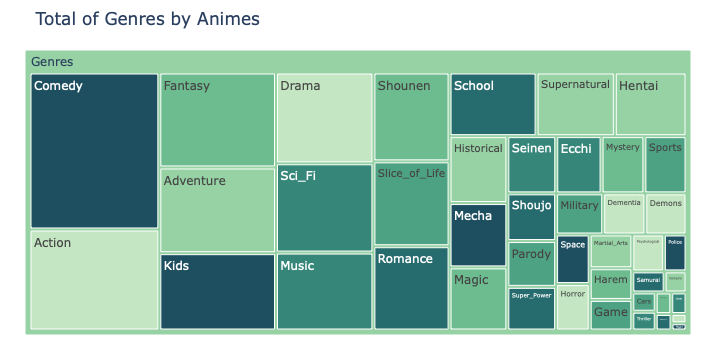

In [92]:
fig = px.treemap(anime, path = [px.Constant("Genres"), list(counts.keys())], values = counts.values(),
                 title = "Total of Genres by Animes",
                 color = list(counts.keys()), color_discrete_sequence = px.colors.sequential.Blugrn)

fig.update_layout(margin = dict(t = 50, l = 25, r = 25, b = 25))

fig.show()

Next, plotting the **Average of Score by Source**, they are: "Original, Manga, Visual novel, Game, Light novel, Other, Novel, Music, 4-koma manga, Web manga, Picture book, Book, Card game, Digital manga and Radio".

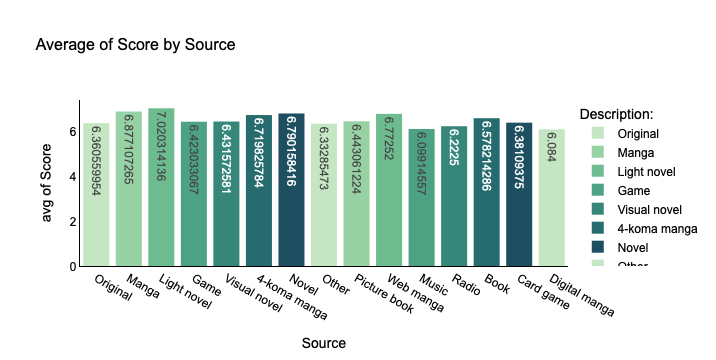

In [93]:
filter_source_hist = anime[["Source", "Score"]][anime["Source"] != "Unknown"]

fig = px.histogram(filter_source_hist, x = 'Source', y = 'Score', histfunc = 'avg',
                   text_auto = '.10', title = "Average of Score by Source",
                   labels = {"x": "Souce of Animes", "y": "Average of Score Count"},
                   color = "Source", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting the **Average of Score by Type**, they are: "TV, Movie, OVA, Special, ONA and Music".

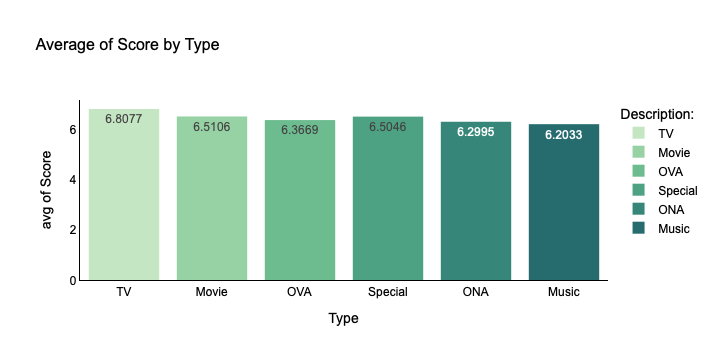

In [94]:
fig = px.histogram(anime, x = "Type", y = "Score", histfunc = 'avg',
                   text_auto = '.5', title = "Average of Score by Type",
                   labels = {"x": "Types of Animes", "y": "Types of Animes Count"},
                   color = "Type", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, plotting a "`pie chart`" with the **Top 5 Producers** of Animes ignoring "Unknown" values if exist, they are: "NHK, Pink Pineapple, Sanrio, Bandai Visual and Fuji TV".

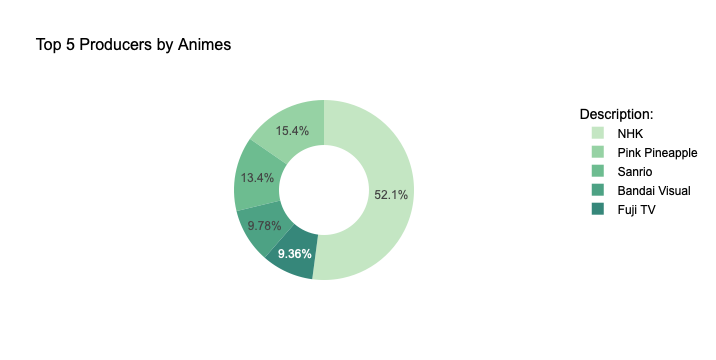

In [95]:
filter_producers = anime["Producers"][anime["Producers"] != "Unknown"].value_counts().nlargest(5).to_dict()

labels = filter_producers.keys()
values = filter_producers.values()

fig = px.pie(anime, names = labels, values = values,
            title = "Top 5 Producers by Animes", 
            color_discrete_sequence = px.colors.sequential.Blugrn, hole = 0.5)

graph_patterns()

fig.show()

Next, plotting a "`box plot`" with the **Popularity Distribution** of Animes.

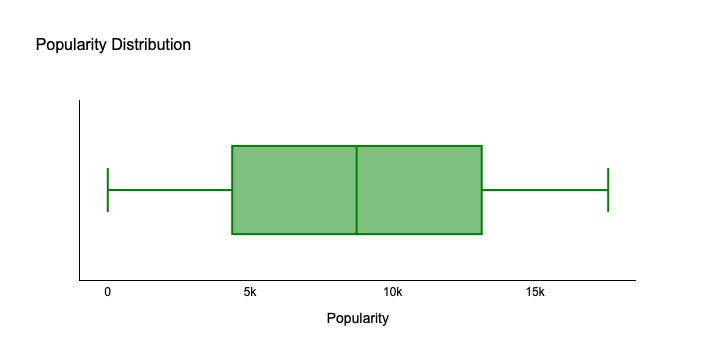

In [96]:
fig = px.box(anime, x = "Popularity", title = 'Popularity Distribution')
fig.update_traces(marker = dict(color = 'green'))

graph_patterns()

fig.show()

# 5. Machine Learning - Recommendation System

- Discuss and explain the purpose of a **recommendation system** for online retail business in machine
learning.
- Briefly compare **Content** and **Collaborative** filtering using any dataset of your choice (Datasets used in the class tutorials or exercises are not allowed to use in this CA2).
- Train and test machine learning models for the **user-user and item-item** collaborative filtering.
- Justify your recommendations for the considered scenario by providing a conceptual insight.

The Recommendation System is useful for companies and customers, as it helps to make decisions on big options that are sometimes not easy and turn into a waste of time, for example, for customers it is simple to receive recommendations based on their history, as we already know what they like and we can offer similar content/products/items based on their tastes, for companies, they could do a customer study to be carried out likes, sales, popularity, usage, patterns, preferences, actions, tastes analysed and so on, with the results, it will be possible to offer more of this content/products/items and similar ones, also never run out of stock if it is a tangible product or item turning this beneficial for both parties.

## 5.1 Content-Based Recommender System

Creating a recommendation using Content-Based Recommender System, in this case the Genre column will be used, but the following columns could be used: Type, Producers, Licensors, Studios, Source and Rating.

First, defining a "`TF-IDF`" Vectorizer Object to remove/separate English stop words/words whose name is "tfidf", next applying in the feature "Genres" and get its shape. Also checked about the parameter "stop_words" in the article "TfidfVectorizer" (scikit-learn developers, 2024), 

In [97]:
tfidf = TfidfVectorizer(stop_words = "english")

tfidf_matrix = tfidf.fit_transform(anime["Genres"])

tfidf_matrix.shape

(17463, 43)

Next, printing the values that were got after applying "TfidfVectorizer".

In [98]:
print(tfidf.get_feature_names_out())

['action' 'adventure' 'cars' 'comedy' 'dementia' 'demons' 'drama' 'ecchi'
 'fantasy' 'game' 'harem' 'hentai' 'historical' 'horror' 'josei' 'kids'
 'magic' 'martial_arts' 'mecha' 'military' 'music' 'mystery' 'parody'
 'police' 'psychological' 'romance' 'samurai' 'school' 'sci_fi' 'seinen'
 'shoujo' 'shoujo_ai' 'shounen' 'shounen_ai' 'slice_of_life' 'space'
 'sports' 'super_power' 'supernatural' 'thriller' 'vampire' 'yaoi' 'yuri']


Exactly 43 values, and their respective names as prepared before in the topic "3.4 Preparing Genres Feature to Machine Learning"

Next, printing the respective ID and values of it.

In [99]:
print(list(enumerate(tfidf.get_feature_names_out())))

[(0, 'action'), (1, 'adventure'), (2, 'cars'), (3, 'comedy'), (4, 'dementia'), (5, 'demons'), (6, 'drama'), (7, 'ecchi'), (8, 'fantasy'), (9, 'game'), (10, 'harem'), (11, 'hentai'), (12, 'historical'), (13, 'horror'), (14, 'josei'), (15, 'kids'), (16, 'magic'), (17, 'martial_arts'), (18, 'mecha'), (19, 'military'), (20, 'music'), (21, 'mystery'), (22, 'parody'), (23, 'police'), (24, 'psychological'), (25, 'romance'), (26, 'samurai'), (27, 'school'), (28, 'sci_fi'), (29, 'seinen'), (30, 'shoujo'), (31, 'shoujo_ai'), (32, 'shounen'), (33, 'shounen_ai'), (34, 'slice_of_life'), (35, 'space'), (36, 'sports'), (37, 'super_power'), (38, 'supernatural'), (39, 'thriller'), (40, 'vampire'), (41, 'yaoi'), (42, 'yuri')]


Next, print the "tfidf_matrix" with two columns of information. 

In [100]:
print(tfidf_matrix[:2])

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 11 stored elements and shape (2, 43)>
  Coords	Values
  (0, 0)	0.3347279676616152
  (0, 1)	0.3709759263911154
  (0, 3)	0.2758590987730036
  (0, 6)	0.3873582877215716
  (0, 28)	0.3896263438419832
  (0, 35)	0.6102300192921236
  (1, 0)	0.3193788987942683
  (1, 6)	0.369595836988484
  (1, 28)	0.3717598905965558
  (1, 35)	0.5822477067997714
  (1, 21)	0.5330836969517889


It is possible to check the values using the method ".todense()"

In [101]:
tfidf_matrix.todense()[0]

matrix([[0.33472797, 0.37097593, 0.        , 0.2758591 , 0.        ,
         0.        , 0.38735829, 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        , 0.38962634, 0.        ,
         0.        , 0.        , 0.        , 0.        , 0.        ,
         0.61023002, 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        , 0.        ]])

Next, it will compute a similarity score to check the similarity between the genres, in this case, instead of using "cosine_similarities()" to calculate, it will use "linear_kernel()" based on "TF-IDF scores", using linear_kernel keep the compute faster, also could be used others similarity metrics such as "manhattan, euclidean, Pearson, cosine similarity scores" and so on.

"Similarity Measure

- Pearson Correlation Coefficient: It measures the linear correlation between two variables and is commonly used in recommendation systems.
- Cosine Similarity: It measures the cosine of the angle between two vectors and is widely used in recommendation systems due to its ability to handle sparse data.
- Jaccard Similarity: It measures the similarity between two sets and is often used in recommendation systems for binary data.
- Euclidean Distance: It measures the straight-line distance between two points in a multi-dimensional space and is often used in recommendation systems.
- Manhattan Distance: It measures the absolute differences between two points in a multi-dimensional space and is often used in recommendation systems." (Gaurav, 2023).

Learned from the article "Step By Step Content-Based Recommendation System" (Gaurav, 2023)

In [102]:
linear_kernel_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)
print(linear_kernel_similarities)

[[1.         0.75022354 0.69879805 ... 0.         0.33879523 0.22886752]
 [0.75022354 1.         0.43970648 ... 0.19515229 0.         0.21837272]
 [0.69879805 0.43970648 1.         ... 0.         0.37721822 0.25482353]
 ...
 [0.         0.19515229 0.         ... 1.         0.         0.        ]
 [0.33879523 0.         0.37721822 ... 0.         1.         0.        ]
 [0.22886752 0.21837272 0.25482353 ... 0.         0.         1.        ]]


Next, creating a few functions for the Recommendation Engine, "get_name_from_index", "get_index_from_name", "matching_score", "find_closest_name", and finally the function to recommend titles of animes called "`contents_based_recommender`".

In [103]:
def get_name_from_index(index):
    return anime[anime.index == index]['Name'].values[0]
    
def get_index_from_name(name):
    return anime[anime.Name == name].index.values[0]

def matching_score(a, b):
    return fuzz.ratio(a, b)

def find_closest_name(name):
    leven_scores = list(enumerate(anime['Name'].apply(matching_score, b = name)))
    sorted_leven_scores = sorted(leven_scores, key = lambda x: x[1], reverse = True)
    closest_name = get_name_from_index(sorted_leven_scores[0][0])
    distance_score = sorted_leven_scores[0][1]
    return closest_name, distance_score

In [104]:
def contents_based_recommender(animes, how_many):
    closest_name, distance_score = find_closest_name(animes)
    if distance_score == 100:
        anime_index = get_index_from_name(closest_name)
        anime_list = list(enumerate(linear_kernel_similarities[int(anime_index)]))
        similar_animes = list(filter(lambda x : x[0] != int(anime_index), sorted(anime_list, key = lambda x : x[1], reverse = True)))

        print('Here\'s the list of animes similar to '+'\033[1m'+str(closest_name)+'\033[0m'+'.\n')

    for i,s in similar_animes[:how_many]: 
        print(get_name_from_index(i))

The function "contents_based_recommender" is expected to receive two values, first the Title of the Anime and second the number of titles you want to be recommended, an example is below:

In [105]:
contents_based_recommender('Dragon Ball', 10)

Here's the list of animes similar to Dragon Ball.

Dragon Ball Z
Dragon Ball Z Movie 11: Super Senshi Gekiha!! Katsu no wa Ore da
Dragon Ball GT: Gokuu Gaiden! Yuuki no Akashi wa Suushinchuu
Dragon Ball Kai
Dragon Ball Z: Atsumare! Gokuu World
Dragon Ball Z: Summer Vacation Special
Dragon Ball Kai (2014)
Doraemon Movie 35: Nobita no Space Heroes
Shin Atashin'chi
Dragon Ball Z Movie 14: Kami to Kami


### 5.1.1 Recommender System with Count Vectorizer and Cosine Similarity

Next, an example of a Recommender System using "CountVectorizer" instead to use "TfidfVectorizer" to vectorise Object and remove/separate English stop words/words.

In [106]:
cv = CountVectorizer(stop_words = "english")

cv_matrix = cv.fit_transform(anime["Genres"])

cv_matrix.shape

(17463, 43)

Next, printing the values that were got after applying "CountVectorizer".

In [107]:
print(cv.get_feature_names_out())

['action' 'adventure' 'cars' 'comedy' 'dementia' 'demons' 'drama' 'ecchi'
 'fantasy' 'game' 'harem' 'hentai' 'historical' 'horror' 'josei' 'kids'
 'magic' 'martial_arts' 'mecha' 'military' 'music' 'mystery' 'parody'
 'police' 'psychological' 'romance' 'samurai' 'school' 'sci_fi' 'seinen'
 'shoujo' 'shoujo_ai' 'shounen' 'shounen_ai' 'slice_of_life' 'space'
 'sports' 'super_power' 'supernatural' 'thriller' 'vampire' 'yaoi' 'yuri']


Exactly 43 values, and their respective names as prepared before in the topic "3.4 Preparing Genres Feature to Machine Learning"

Next, it will compute a similarity score to check the similarity between the genres, in this case, using "cosine_similarities()" to calculate.

In [108]:
cosine_similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)
print(cosine_similarities)

[[1.         0.75022354 0.69879805 ... 0.         0.33879523 0.22886752]
 [0.75022354 1.         0.43970648 ... 0.19515229 0.         0.21837272]
 [0.69879805 0.43970648 1.         ... 0.         0.37721822 0.25482353]
 ...
 [0.         0.19515229 0.         ... 1.         0.         0.        ]
 [0.33879523 0.         0.37721822 ... 0.         1.         0.        ]
 [0.22886752 0.21837272 0.25482353 ... 0.         0.         1.        ]]


Different from before, instead of creating a few functions for the Recommendation Engine, it will create just one function to recommend titles of animes called "`anime_recommendations`". 

Also, the function it were updated to receive two values as before, first the Title of the Anime and second the number of titles you want to be recommended, an example is below:

In [109]:
indices = pd.Series(anime.index, index = anime['Name'])

def anime_recommendations(title, how_many):
    idx = indices[title]
    sim_scores = list(enumerate(cosine_similarities[idx]))
    sim_scores = sorted(sim_scores, key = lambda x: x[1], reverse = True)
    sim_scores = sim_scores[1:how_many+1]
    anime_indices = [i[0] for i in sim_scores]

    return anime['Name'].iloc[anime_indices]

In [110]:
anime_recommendations('Dragon Ball', 10)

734                                          Dragon Ball Z
819      Dragon Ball Z Movie 11: Super Senshi Gekiha!! ...
892      Dragon Ball GT: Gokuu Gaiden! Yuuki no Akashi ...
4426                                       Dragon Ball Kai
4714                  Dragon Ball Z: Atsumare! Gokuu World
8762                Dragon Ball Z: Summer Vacation Special
8774                                Dragon Ball Kai (2014)
9326               Dragon Ball Z Movie 15: Fukkatsu no "F"
10623                                    Dragon Ball Super
7186                  Dragon Ball Z Movie 14: Kami to Kami
Name: Name, dtype: object

Similar to before using "TfidfVectorizer and linear_kernel" and next "CountVectorizer and cosine_similarity", both resulted in the same titles, the only thing that could be different should be the score numbers and time to run it in performance matters.

Also, the second function, "anime_recommendations", shows the ID of the title in case it needs to use it.

## 5.2 Collaborative Filtering

For this scenario, it will be necessary to import the second data frame, which has "`user_id, anime_id and rating features`". It will be named "`anime_rating`" after loading the data set "`rating_complete.csv`" from the folder "animes_data" using the command "`.read_csv()`", also used the method "`time`" to get an idea of ​​how long it takes to import the database.

In [111]:
start_time = time.time()

# anime_synopsis = pd.read_csv("animes_data/anime_with_synopsis.csv")
# anime_list = pd.read_csv("animes_data/animelist.csv") #Too large
anime_rating = pd.read_csv("animes_data/rating_complete.csv",#)
                           nrows = 50000)
# anime_status = pd.read_csv("animes_data/watching_status.csv")

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 0.01 seconds.
CPU times: user 0 ns, sys: 1e+03 ns, total: 1e+03 ns
Wall time: 2.15 μs


To load the entire database with **57633278** observations, it takes approximately **4.23 seconds**, but will be used just **50000** observations from the whole database, which takes approximately **0.01 seconds** to import, it opted to use just part of the data frame once the original data with "57633278" is too large and the algorithm takes a long time to run, and every time it was tested the program always stopped working and crash.

Next, it uses the commands to get the "`Head, Shape, Null Values and Types`" information about the data frame.

In [112]:
anime_rating.head()

,user_id,anime_id,rating
0,0,430,9
1,0,1004,5
2,0,3010,7
3,0,570,7
4,0,2762,9


In [113]:
anime_rating.shape

(50000, 3)

In [114]:
anime_rating.isnull().sum()

user_id     0
anime_id    0
rating      0
dtype: int64

In [115]:
anime_rating.dtypes

user_id     int64
anime_id    int64
rating      int64
dtype: object

Next, checking the information about the "user_id 0", such as the animes he gave a rating.

In [116]:
anime_rating[anime_rating["user_id"] == 0].head()

,user_id,anime_id,rating
0,0,430,9
1,0,1004,5
2,0,3010,7
3,0,570,7
4,0,2762,9


The example below it was learned from the article "Item-based Collaborative Filtering : Build Your own Recommender System!" (Saumyab271, 2021), to get the information of items that the user liked and rated. 

In [117]:
anime_sort_des = anime_rating.sort_values(['user_id', 'rating'], ascending = [True, False])
f_animes_liked = anime_sort_des[anime_sort_des['user_id'] == 0].anime_id
f_animes_liked = f_animes_liked.tolist()
f_animes_liked = f_animes_liked[:]

print("Items liked by user:", f_animes_liked)

Items liked by user: [578, 1571, 415, 2236, 430, 2762, 121, 356, 3418, 459, 431, 164, 2034, 199, 419, 3010, 570, 1250, 1829, 1894, 2547, 169, 2543, 466, 433, 2913, 1689, 68, 600, 1047, 2248, 4086, 1004, 448, 174]


Next it will be created a matrix with "`anime_id as index, user_id as column and rating as values`" based on the article "Overview of Item-Item Collaborative Filtering Recommendation System" (chiang, 2022) and "Collaborative Filtering in Recommender System: An Overview" (Evelyn, 2023) read to get more familiar with Collaborative Filtering, next, filling the NaN values with 0 and printing it.

In [118]:
user_matrix = anime_rating.pivot_table(index = 'anime_id', columns = 'user_id', values = 'rating')
user_matrix = user_matrix.fillna(0)
user_matrix

user_id,0,1,2,3,4,5,6,7,8,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,27,28,29,30,31,32,33,34,35,36,37,38,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,61,62,63,64,65,66,67,68,70,71,72,73,74,75,77,78,79,80,81,82,83,84,85,87,88,89,90,91,92,93,94,95,97,99,101,102,103,104,105,107,108,110,111,112,113,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,133,134,135,136,137,138,139,141,143,145,146,147,148,149,150,152,153,154,155,156,157,158,160,162,163,164,165,166,167,169,170,171,172,173,174,177,178,179,181,182,184,185,186,187,188,189,190,192,193,194,195,196,197,198,199,201,202,204,205,207,208,209,210,211,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,235,237,238,239,240,241,243,244,245,246,247,248,249,251,252,253,254,255,257,258,259,260,262,263,264,265,266,267,268,269,270,272,273,274,275,276,277,278,281,282,283,284,285,286,287,288,289,290,291,292,293,294,296,297,298,299,300,301,302,303,304,306,307,308,310,311,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,338,339,340,341,343,344,345,346
anime_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,9.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,9.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,9.0,0.0,9.0,10.0,0.0,0.0,0.0,7.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,10.0,0.0,0.0,10.0,8.0,0.0,9.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,9.0,0.0,9.0,0.0,0.0,10.0,0.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,10.0,9.0,0.0,0.0,0.0,6.0,9.0,6.0,0.0,0.0,0.0,6.0,9.0,10.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,10.0,0.0,0.0,0.0,0.0,10.0,0.0,9.0,6.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,9.0,10.0,0.0,0.0,10.0,0.0,0.0,0.0,7.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,8.0,10.0,9.0,0.0,0.0,0.0,9.0,8.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,6.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,9.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,10.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,10.0,9.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0

Next, creating an csr_matrix from the "user_matrix".

In [119]:
csr_sample = csr_matrix(user_matrix.values)

Applying KNN NearestNeighbors in the "csr_sample" results.

In [120]:
knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute', n_neighbors = 3, n_jobs = -1)
knn.fit(csr_sample)

NearestNeighbors(algorithm='brute', metric='cosine', n_jobs=-1, n_neighbors=3)

"Next, for each item being liked by the user1, we recommend 2 similar items. The number of similar items to be recommended can vary depending on the need of the system" (Saumyab271, 2021) also add ".tolist()" to for the indices values being a list and ".append" to add the distance values in "distances_result".

In [121]:
distances_result = []
indices_result = []

for i in f_animes_liked:
    distances, indices = knn.kneighbors(csr_sample[i], n_neighbors = 3)
    indices = indices.flatten().tolist()
    indices = indices[1:]
    indices_result.extend(indices)
    distances_result.append(distances)
    
print("Items to be recommended:", indices_result)

Items to be recommended: [1690, 2145, 1964, 2257, 837, 597, 343, 411, 877, 530, 3484, 3365, 1340, 232, 3964, 3042, 1894, 3755, 786, 102, 1360, 451, 165, 736, 1266, 2013, 199, 163, 460, 884, 3095, 3229, 468, 494, 735, 874, 863, 1138, 3755, 2529, 1841, 2148, 912, 2010, 91, 92, 466, 574, 133, 1077, 509, 702, 1595, 1911, 955, 67, 240, 84, 343, 411, 1856, 855, 879, 880, 207, 901, 728, 532, 273, 272]


Next, trying an Anime ID to check the name and if exists.

In [122]:
anime["Name"][anime["Anime_ID"] == 67]

48    Basilisk: Kouga Ninpou Chou
Name: Name, dtype: object

Once, confirmed it was created a "`for loop`" to run in the anime database to print the title of animes instead of merging both databases once there was no need.

In [123]:
for index, observation in anime.iterrows():
    if observation["Anime_ID"] in indices_result:
        print(observation["Anime_ID"], observation["Name"])

67 Basilisk: Kouga Ninpou Chou
84 Mobile Suit Gundam 0083: Stardust Memory
91 Mobile Suit Gundam Wing: Endless Waltz
92 After War Gundam X
102 Aishiteruze Baby★★
133 Green Green
163 Power Stone
165 RahXephon
199 Sen to Chihiro no Kamikakushi
207 Lodoss-tou Senki
232 Cardcaptor Sakura
240 Genshiken
272 Noir
273 Mahoutsukai ni Taisetsu na Koto
343 Tsukuyomi: Moon Phase
411 Gun x Sword
451 InuYasha Movie 3: Tenka Hadou no Ken
460 One Piece Movie 2: Nejimaki-jima no Daibouken
466 One Piece: Taose! Kaizoku Ganzack
468 Innocence
509 I My Me! Strawberry Eggs
530 Bishoujo Senshi Sailor Moon
532 Bishoujo Senshi Sailor Moon S
574 Rean no Tsubasa
597 Neko no Ongaeshi
736 Keiraku no Houteishiki Level-C
786 Pugyuru
837 Kyou no 5 no 2
855 Strawberry Panic
863 Joshikousei: Girl's High
874 Digimon Tamers
877 Nana
879 Simoun
880 Aa! Megami-sama!: Sorezore no Tsubasa
884 Shin Angyo Onshi
901 Dragon Ball Z Movie 08: Moetsukiro!! Nessen, Ressen, Chougekisen
912 Ninkuu
1138 Medarot
1266 Yoroiden Samurai Tr

Getting a random recommendation using "np.random.choice"

In [124]:
query_index = np.random.choice(user_matrix.shape[0])
anime[anime["Anime_ID"] == query_index]

,Anime_ID,Name,Score,Genres,Japanese_name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch,Score_10,Score_9,Score_8,Score_7,Score_6,Score_5,Score_4,Score_3,Score_2,Score_1,Score_Total


Getting a recommendation using "kneighbors"

In [125]:
distances, indices = knn.kneighbors(user_matrix.iloc[query_index,:].values.reshape(1, -1), n_neighbors = 3)

query_index_knn = user_matrix.index[query_index].tolist()

anime[anime["Anime_ID"] == query_index_knn]

,Anime_ID,Name,Score,Genres,Japanese_name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch,Score_10,Score_9,Score_8,Score_7,Score_6,Score_5,Score_4,Score_3,Score_2,Score_1,Score_Total
14485,37779,Yakusoku no Neverland,8.65,Sci_Fi Mystery Horror Psychological Thriller S...,約束のネバーランド,TV,12.0,"Jan 10, 2019 to Mar 29, 2019",Winter 2019,"Aniplex, Dentsu, A-1 Pictures, Fuji TV, Shueis...",Aniplex of America,CloverWorks,Manga,22 min. per ep.,R - 17+ (violence & profanity),55.0,55,1133952,32542,78900,863136,17950,12852,161114,169589.0,258096.0,202613.0,66705.0,15825.0,5198.0,2055.0,790.0,373.0,1041.0,722285.0


Test Recommender

In [126]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(user_matrix.index[query_index]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, user_matrix.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for 37779:

1: 35760, with distance of 0.32720503386288935:
2: 38000, with distance of 0.3776071058826662:


In [127]:
anime[anime["Anime_ID"] == 1014]

,Anime_ID,Name,Score,Genres,Japanese_name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch,Score_10,Score_9,Score_8,Score_7,Score_6,Score_5,Score_4,Score_3,Score_2,Score_1,Score_Total
919,1014,Chicchana Yukitsukai Sugar Specials,7.02,Slice_of_Life Magic Comedy Shoujo,ちっちゃな雪使いシュガー特別編,Special,2.0,"Aug 21, 2003 to Aug 28, 2003",Unknown,"Kadokawa Shoten, Broccoli, TBS, Pioneer LDC","Sentai Filmworks, Geneon Entertainment USA",J.C.Staff,Original,24 min. per ep.,G - All Ages,3554.0,6547,4875,14,94,3188,103,94,1396,148.0,236.0,412.0,652.0,367.0,217.0,52.0,24.0,7.0,13.0,2128.0


### 5.2.1 Collaborative Filtering - Item to Item

Learned after read the article "Overview of Item-Item Collaborative Filtering Recommendation System" (chiang, 2022), checking the similarity using "squareform" and "pdist".

In [128]:
distance_mtx = squareform(pdist(user_matrix, 'cosine'))
similarity_mtx = 1 - distance_mtx

Next, it makes predictions of the rating of the user 0 on item 5.

In [129]:
user_to_predict = 0
item_to_predict = 5

user2_ratings = user_matrix.iloc[:, user_to_predict - 1]
item3_similarity = similarity_mtx[item_to_predict - 1]

numerator = np.dot(user2_ratings, item3_similarity)
denom = item3_similarity[user2_ratings > 0].sum()
prediction = numerator / denom

print(prediction)

8.404520561721988


"Building the Recommendation System

In order to make the item-based model into a recommendation system, we calculate all ratings of the specific user. For instance, we want to recommend items to user 2, and we calculate all predicted ratings and select the top n items that user 2 might like." (chiang, 2022).

In [130]:
def calculate_user_rating(user_id, similarity_mtx, user_matrix):
    user_rating = user_matrix.iloc[:, user_id - 1]
    pred_rating = deepcopy(user_rating)
    
    default_rating = user_rating[user_rating > 0].mean()
    numerate = np.dot(similarity_mtx, user_rating)
    corr_sim = similarity_mtx[:, user_rating > 0]
    
    for i, ix in enumerate(pred_rating):
        temp = 0
        if ix < 1:
            w_r = numerate[i]
            sum_w = corr_sim[i,:].sum()
            if w_r == 0 or sum_w == 0:
                temp = default_rating
            else:
                temp = w_r / sum_w
            pred_rating.iloc[i] = temp
    return pred_rating


def recommendation_to_user(user_id, top_n, similarity_mtx, user_matrix):
    user_rating = user_matrix.iloc[:, user_id - 1]
    pred_rating = calculate_user_rating(user_id, similarity_mtx, user_matrix)

    top_item = sorted(range(1,len(pred_rating)), key = lambda i: -1*pred_rating.iloc[i])
    top_item = list(filter(lambda x: user_rating.iloc[x] == 0, top_item))[:top_n]
    res = []
    for i in top_item:
        res.append(tuple([i, pred_rating.iloc[i].tolist()]))
    
    return res

recommendation_to_user(0, 10, similarity_mtx, user_matrix)

[(4341, 9.696854622687109),
 (5380, 9.4979594996157),
 (5443, 9.42142590772852),
 (1095, 9.368089040087526),
 (1298, 9.368089040087526),
 (1430, 9.357120166737197),
 (1590, 9.33876781534462),
 (61, 9.279728271339808),
 (452, 9.279728271339808),
 (652, 9.279728271339808)]

"Therefore, we will recommend the following 10 items to user 2 followed by the predicted rating." (chiang, 2022).

### 5.2.2 Collaborative Filtering - User to User

For this scenario, it will be necessary to import the second data frame, which has "`user_id, anime_id and rating features`". It will be named "`anime_rating`" after loading the data set "`rating_complete.csv`" from the folder "animes_data" using the command "`.read_csv()`", also used the method "`time`" to get an idea of ​​how long it takes to import the database.

Create a new data frame called "Mean" to save the "mean" value of the ratings, next merged in a new data frame called "Rating_avg" and finally created a new featured called "adg_rating".

In [131]:
start_time = time.time()

anime_rating = pd.read_csv("animes_data/rating_complete.csv", nrows = 50000)
Mean = anime_rating.groupby(by = "user_id", as_index = False)['rating'].mean()

Rating_avg = pd.merge(anime_rating, Mean, on = 'user_id')
Rating_avg['adg_rating'] = Rating_avg['rating_x'] - Rating_avg['rating_y']

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 0.01 seconds.
CPU times: user 1 μs, sys: 0 ns, total: 1 μs
Wall time: 2.86 μs


It takes approximately **0.02 seconds** to load, also using a sample like before of **50000** observations and plotting it below.

In [132]:
Rating_avg.head(2)

,user_id,anime_id,rating_x,rating_y,adg_rating
0,0,430,9,7.4,1.6
1,0,1004,5,7.4,-2.4


Next, it will be created two "pivot_table" matrices, the first one called "check" with "user_id as index, anime_id as column and rating_x as values", the second one called "final" with "user_id as index, anime_id as column and adg_rating as values", next, filling the NaN values.

In [133]:
check = pd.pivot_table(Rating_avg, values = 'rating_x', index = 'user_id', columns = 'anime_id')
final = pd.pivot_table(Rating_avg, values = 'adg_rating', index = 'user_id', columns = 'anime_id')

In [134]:
final_anime = final.fillna(final.mean(axis = 0))
final_user = final.apply(lambda row: row.fillna(row.mean()), axis = 1)

Next, user similarity on replacing NAN by user avg and item(anime)

In [135]:
b = cosine_similarity(final_user)
np.fill_diagonal(b, 0)
similarity_with_user = pd.DataFrame(b, index = final_user.index)
similarity_with_user.columns=final_user.index

cosine = cosine_similarity(final_anime)
np.fill_diagonal(cosine, 0 )
similarity_with_anime = pd.DataFrame(cosine, index = final_anime.index)
similarity_with_anime.columns=final_user.index

Next, created a function called "find_n_neighbours" to identify the top "n" neighbours or similar entities for each entity in a data frame.

In [136]:
def find_n_neighbours(df, n):
    order = np.argsort(df.values, axis = 1)[:, :n]
    df = df.apply(lambda x: pd.Series(x.sort_values(ascending = False)
           .iloc[:n].index, 
          index=['top{}'.format(i) for i in range(1, n+1)]), axis=1)
    return df

Next, applying it to get the top 30 neighbours for each user.

In [137]:
sim_user_30_u = find_n_neighbours(similarity_with_user, 30)
sim_user_30_m = find_n_neighbours(similarity_with_anime, 30)

Next, created a function called "User_item_score" to calculate a score representing the predicted rating that a user (specified by the 'user' parameter) would give to a particular item (specified by the 'item' parameter).

In [138]:
def User_item_score(user, item):
    a = sim_user_30_m[sim_user_30_m.index==user].values
    b = a.squeeze().tolist()
    c = final_anime.loc[:,item]
    d = c[c.index.isin(b)]
    f = d[d.notnull()]
    avg_user = Mean.loc[Mean['user_id'] == user,'rating'].values[0]
    index = f.index.values.squeeze().tolist()
    corr = similarity_with_anime.loc[user,index]
    fin = pd.concat([f, corr], axis=1)
    fin.columns = ['adg_score','correlation']
    fin['score']=fin.apply(lambda x:x['adg_score'] * x['correlation'],axis=1)
    nume = fin['score'].sum()
    deno = fin['correlation'].sum()
    final_score = avg_user + (nume/deno)
    return final_score

Trying to get a score with the user ID 1 and anime ID 22.

In [139]:
score = User_item_score(1, 22)

print("score (u,i) is",score)

score (u,i) is 8.535184994245279


The score **8.53**, represents the predicted rating that user 1 would give to anime 22. 

In [140]:
Rating_avg = Rating_avg.astype({"anime_id": str})
Anime_user = Rating_avg.groupby(by = 'user_id')['anime_id'].apply(lambda x:','.join(x))

Next, it created a new function called "User_item_score1" to recommend animes to a user based on collaborative filtering.

In [141]:
def User_item_score1(user):
    Anime_seen_by_user = check.columns[check[check.index==user].notna().any()].tolist()
    a = sim_user_30_m[sim_user_30_m.index==user].values
    b = a.squeeze().tolist()
    d = Anime_user[Anime_user.index.isin(b)]
    l = ','.join(d.values)
    Anime_seen_by_similar_users = l.split(',')
    Animes_under_consideration = list(set(Anime_seen_by_similar_users)-set(list(map(str, Anime_seen_by_user))))
    Animes_under_consideration = list(map(int, Animes_under_consideration))
    score = []
    for item in Animes_under_consideration:
        c = final_anime.loc[:,item]
        d = c[c.index.isin(b)]
        f = d[d.notnull()]
        avg_user = Mean.loc[Mean['user_id'] == user,'rating'].values[0]
        index = f.index.values.squeeze().tolist()
        corr = similarity_with_anime.loc[user,index]
        fin = pd.concat([f, corr], axis=1)
        fin.columns = ['adg_score','correlation']
        fin['score']=fin.apply(lambda x:x['adg_score'] * x['correlation'],axis=1)
        nume = fin['score'].sum()
        deno = fin['correlation'].sum()
        final_score = avg_user + (nume/deno)
        score.append(final_score)
    data = pd.DataFrame({'Anime_ID':Animes_under_consideration,'score':score})
    top_5_recommendation = data.sort_values(by = 'score', ascending = False).head(5)
    Anime_Name = top_5_recommendation.merge(anime, how = 'inner', on = 'Anime_ID')
    Anime_Names = Anime_Name.Name.values.tolist()
    return Anime_Names

Next, it is possible to recommend animes to the user, it left the command below commented out, once when the entire document is run the program waits for feedback from the user. In order not to stop the program in this part, a default value has been left to continue. If you want to enter values, just delete the line "user = 34" and uncomment the first line.

In [142]:
# user = int(input("Enter the user ID to whom you want to recommend: "))
user = 34
predicted_animes = User_item_score1(user)

print("\nThe Recommendations for User ID", user, "are:\n")

for i in predicted_animes:
    print(i)


The Recommendations for User ID 34 are:

Hunter x Hunter (2011)
Steins;Gate
Gintama
Gintama'
Shingeki no Kyojin Season 3 Part 2


After using, "Content-Based Recommender System and Collaborative Filtering" it was noted that each of them has a form of recommendations, and the input form also varies based on the database, "Content-Based" was good for recommending items based on genres, titles, studios, producers, user's profile, etc., which already exist in the database without any activities of the user, "Collaborative" on the other hand, is different, it recommends based on user activities, user behaviour, in this case, based on their ratings can be recommended products, or also it can be recommended base on activities from user to user.

Also, the recommendations for the actual scenario were partially favourable where the databases have a lot of information, such as user IDs, anime IDs, user ratings, and so on. that is essential for some analyses using Content-Based and Collaborative Filtering, this dataset made it possible to explore and create various analyses, unfortunately, the time is short to explore it dipper, but a few analysis was carried out as far as possible, although, the variety for this database is immense and can be updated and explored.

# 6. Machine Learning - Market Basket Analysis

- Perform **Market Basket Analysis** on the chosen dataset by using **Apriori and FP growth** algorithms.
- Can you **express** major **similarities/divergence** between these models?
- **Compare and contrast** the machine learning **results** obtained based on both algorithms.

## 6.1 Apriori Algorithm

For this scenario, it will be necessary to import the third data frame, which has "`user_id, anime_id, rating, watching_status and watched_episodes features`". It will be named "`anime_list`" after loading the data set "`animelist.csv`" from the folder "animes_data" using the command "`.read_csv()`", also used the method "`time`" to get an idea of ​​how long it takes to import the database.

In [143]:
start_time = time.time()

anime_list = pd.read_csv("animes_data/animelist.csv", nrows = 50000)

end_time = time.time()
print("Imported in {:.2f} seconds.".format(end_time - start_time))
%time

Imported in 0.01 seconds.
CPU times: user 1e+03 ns, sys: 1 μs, total: 2 μs
Wall time: 2.86 μs


watching_status

- 1	Currently Watching
- 2	Completed
- 3	On Hold
- 4	Dropped
- 6	Plan to Watch

To load the entire database with **109224747** observations, it takes approximately **11.61 seconds**, but will be used just **50000** observations from the whole database, which takes approximately **0.02 seconds** to import, it opted to use just part of the data frame once the original data with "109224747" is too large and the algorithm takes a long time to run, and every time it was tested the program always stopped working and crash.

Next, it uses the commands to get the "`Head, Shape, Null Values and Types`" information about the data frame.

In [144]:
anime_list.head()

,user_id,anime_id,rating,watching_status,watched_episodes
0,0,67,9,1,1
1,0,6702,7,1,4
2,0,242,10,1,4
3,0,4898,0,1,1
4,0,21,10,1,0


In [145]:
anime_list.shape

(50000, 5)

In [146]:
anime_list.isnull().sum()

user_id             0
anime_id            0
rating              0
watching_status     0
watched_episodes    0
dtype: int64

In [147]:
anime_list.dtypes

user_id             int64
anime_id            int64
rating              int64
watching_status     int64
watched_episodes    int64
dtype: object

Next, checking the "`Head`" of the data set using the status 2 Completed, that it will be carried out for analysis.

In [148]:
anime_list[anime_list["watching_status"] == 2]

,user_id,anime_id,rating,watching_status,watched_episodes
11,0,68,6,2,23
12,0,1689,6,2,3
13,0,2913,6,2,40
14,0,1250,7,2,26
15,0,356,9,2,24
...,...,...,...,...,...
49995,178,8129,7,2,11
49996,178,39017,7,2,12
49997,178,633,6,2,13
49998,178,2034,6,2,24


Creating a small matrix using "anime_id and user_id" by "watched_episodes" for all data with status 2 Completed from the feature "watching_status".

In [149]:
basket_Apriori = (anime_list[anime_list["watching_status"] == 2]
                  .groupby(['anime_id', 'user_id'])['watched_episodes']
                  .sum().unstack().reset_index().fillna(0).set_index('anime_id'))

Next, enconding the values "0 to False and 1 to True", once the "`apriori()`" method does not work with numerical values, just booleans.

In [150]:
def encode_units(x):
    if x <= False:
        return False
    if x >= True:
        return True

basket_sets = basket_Apriori.applymap(encode_units)

Next, generating the frequent items using "min_support" as **0.06** it was tested with other values, and it opted to keep it once the results were good enough.

In [151]:
frequent_itemsets = apriori(basket_sets, min_support = 0.06, use_colnames = True)

print(frequent_itemsets)

     support   itemsets
0   0.066093        (3)
1   0.065254        (6)
2   0.209610       (17)
3   0.142467       (19)
4   0.085187       (21)
5   0.141418       (42)
6   0.083089       (44)
7   0.075535       (46)
8   0.061057       (47)
9   0.103651       (53)
10  0.067982       (60)
11  0.104490       (73)
12  0.082249       (85)
13  0.073437       (90)
14  0.063575      (110)
15  0.140789      (111)
16  0.109526      (112)
17  0.088754      (121)
18  0.074066      (135)
19  0.091691      (145)
20  0.128200      (146)
21  0.104910      (147)
22  0.160302      (153)
23  0.060638      (155)
24  0.108477      (156)
25  0.152329      (172)
26  0.064834      (173)
27  0.080361      (174)
28  0.064415   (73, 17)
29  0.071758  (17, 111)
30  0.067562  (17, 153)
31  0.082459  (17, 172)


Next, created two "`for loops`" to print all values into "itemsets" values, and next the second print the ID an Anime Title.

In [152]:
frequent_itemsets_index = []

for index, observation in frequent_itemsets.iterrows():
    x = observation["itemsets"]
    for i in x:
        frequent_itemsets_index.append(i)
        
print(frequent_itemsets_index, "\n")

for index, observation in anime.iterrows():
    if observation["Anime_ID"] in frequent_itemsets_index:
        print(observation["Anime_ID"], observation["Name"])

[3, 6, 17, 19, 21, 42, 44, 46, 47, 53, 60, 73, 85, 90, 110, 111, 112, 121, 135, 145, 146, 147, 153, 155, 156, 172, 173, 174, 73, 17, 17, 111, 17, 153, 17, 172] 

6 Trigun
17 Hungry Heart: Wild Striker
19 Monster
21 One Piece
44 Rurouni Kenshin: Meiji Kenkaku Romantan - Tsuioku-hen
46 Rurouni Kenshin: Meiji Kenkaku Romantan - Ishinshishi e no Chinkonka
47 Akira
53 Ai Yori Aoshi
60 Chrno Crusade
73 Full Metal Panic! The Second Raid
85 Mobile Suit Zeta Gundam
90 Mobile Suit Gundam Wing
110 Chuuka Ichiban!
111 Corrector Yui
112 Chou Henshin Cosprayers
121 Fullmetal Alchemist
135 Hikaru no Go
145 Kareshi Kanojo no Jijou
146 Kono Minikuku mo Utsukushii Sekai
147 Kimi ga Nozomu Eien
153 Juuni Kokuki
155 X/1999
156 X
173 Tactics
174 Tenjou Tenge


Next, generating the rules using "`association_rules`" with their corresponding support, confidence and lift.

In [153]:
rules = association_rules(frequent_itemsets, metric = "support", min_threshold = 0.06)
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808
1,(17),(73),0.209610,0.104490,0.064415,0.307307,2.941017,0.042512,1.292795
2,(17),(111),0.209610,0.140789,0.071758,0.342342,2.431600,0.042248,1.306472
3,(111),(17),0.140789,0.209610,0.071758,0.509687,2.431600,0.042248,1.612012
4,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081


In [154]:
rules = association_rules(frequent_itemsets, metric = "confidence", min_threshold = 0.06)
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808
1,(17),(73),0.209610,0.104490,0.064415,0.307307,2.941017,0.042512,1.292795
2,(17),(111),0.209610,0.140789,0.071758,0.342342,2.431600,0.042248,1.306472
3,(111),(17),0.140789,0.209610,0.071758,0.509687,2.431600,0.042248,1.612012
4,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081


In [155]:
rules = association_rules(frequent_itemsets, metric = "lift", min_threshold = 0.06)
rules.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808
1,(17),(73),0.209610,0.104490,0.064415,0.307307,2.941017,0.042512,1.292795
2,(17),(111),0.209610,0.140789,0.071758,0.342342,2.431600,0.042248,1.306472
3,(111),(17),0.140789,0.209610,0.071758,0.509687,2.431600,0.042248,1.612012
4,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081


Next, using it with the function time to measure the time spent to run it, in this case: Association rules calculated in **0.01** seconds.

In [156]:
start_time = time.time()

frequent_itemsets = apriori(basket_sets, min_support = 0.06, use_colnames = True)

rules = association_rules(frequent_itemsets, metric = "confidence", min_threshold = 0.06)

end_time = time.time()

calculation_time = end_time - start_time

print("Association rules calculated in {:.2f} seconds.".format(calculation_time))

Association rules calculated in 0.00 seconds.


## 6.2 FP Growth Algorithm

Creating a small matrix using "anime_id and user_id" by "watched_episodes" for all data with status 2 Completed from the feature "watching_status".

In [157]:
basket_FPGrowth = (anime_list[anime_list["watching_status"] == 2]
          .groupby(['anime_id', 'user_id'])['watched_episodes']
          .sum().unstack().reset_index().fillna(0)
          .set_index('anime_id'))

Next, enconding the values "0 to False and 1 to True", once the "`fpgrowth()`" method does not work with numerical values, just booleans.

In [158]:
def encode_units(x):
    if x <= False:
        return False
    if x >= True:
        return True

basket_sets = basket_FPGrowth.applymap(encode_units)

Next, generating the frequent items using "min_support" as **0.06** it was tested with other values, and it opted to keep it once the results were good enough.

In [159]:
frequent_itemsets = fpgrowth(basket_sets, min_support = 0.06, use_colnames = True)

print(frequent_itemsets)

     support   itemsets
0   0.160302      (153)
1   0.152329      (172)
2   0.142467       (19)
3   0.109526      (112)
4   0.108477      (156)
5   0.104910      (147)
6   0.104490       (73)
7   0.103651       (53)
8   0.083089       (44)
9   0.082249       (85)
10  0.080361      (174)
11  0.067982       (60)
12  0.066093        (3)
13  0.065254        (6)
14  0.140789      (111)
15  0.091691      (145)
16  0.061057       (47)
17  0.064834      (173)
18  0.063575      (110)
19  0.088754      (121)
20  0.060638      (155)
21  0.209610       (17)
22  0.128200      (146)
23  0.085187       (21)
24  0.075535       (46)
25  0.074066      (135)
26  0.073437       (90)
27  0.141418       (42)
28  0.067562  (17, 153)
29  0.082459  (17, 172)
30  0.064415   (73, 17)
31  0.071758  (17, 111)


Next, created two "`for loops`" to print all values into "itemsets" values, and next the second print the ID an Anime Title.

In [160]:
frequent_itemsets_index = []
for index, observation in frequent_itemsets.iterrows():
    x = observation["itemsets"]
    for i in x:
        frequent_itemsets_index.append(i)
        
print(frequent_itemsets_index, "\n")

for index, observation in anime.iterrows():
    if observation["Anime_ID"] in frequent_itemsets_index:
        print(observation["Anime_ID"], observation["Name"])

[153, 172, 19, 112, 156, 147, 73, 53, 44, 85, 174, 60, 3, 6, 111, 145, 47, 173, 110, 121, 155, 17, 146, 21, 46, 135, 90, 42, 17, 153, 17, 172, 73, 17, 17, 111] 

6 Trigun
17 Hungry Heart: Wild Striker
19 Monster
21 One Piece
44 Rurouni Kenshin: Meiji Kenkaku Romantan - Tsuioku-hen
46 Rurouni Kenshin: Meiji Kenkaku Romantan - Ishinshishi e no Chinkonka
47 Akira
53 Ai Yori Aoshi
60 Chrno Crusade
73 Full Metal Panic! The Second Raid
85 Mobile Suit Zeta Gundam
90 Mobile Suit Gundam Wing
110 Chuuka Ichiban!
111 Corrector Yui
112 Chou Henshin Cosprayers
121 Fullmetal Alchemist
135 Hikaru no Go
145 Kareshi Kanojo no Jijou
146 Kono Minikuku mo Utsukushii Sekai
147 Kimi ga Nozomu Eien
153 Juuni Kokuki
155 X/1999
156 X
173 Tactics
174 Tenjou Tenge


Next, generating the rules using "`association_rules`" with their corresponding support, confidence and lift.

In [161]:
rules_fp = association_rules(frequent_itemsets, metric = "support", min_threshold = 0.06)
rules_fp.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081
1,(153),(17),0.160302,0.209610,0.067562,0.421466,2.010718,0.033961,1.366195
2,(17),(172),0.209610,0.152329,0.082459,0.393393,2.582525,0.050529,1.397398
3,(172),(17),0.152329,0.209610,0.082459,0.541322,2.582525,0.050529,1.723193
4,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808


In [162]:
rules_fp = association_rules(frequent_itemsets, metric = "confidence", min_threshold = 0.06)
rules_fp.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081
1,(153),(17),0.160302,0.209610,0.067562,0.421466,2.010718,0.033961,1.366195
2,(17),(172),0.209610,0.152329,0.082459,0.393393,2.582525,0.050529,1.397398
3,(172),(17),0.152329,0.209610,0.082459,0.541322,2.582525,0.050529,1.723193
4,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808


In [163]:
rules_fp = association_rules(frequent_itemsets, metric = "lift", min_threshold = 0.06)
rules_fp.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(17),(153),0.209610,0.160302,0.067562,0.322322,2.010718,0.033961,1.239081
1,(153),(17),0.160302,0.209610,0.067562,0.421466,2.010718,0.033961,1.366195
2,(17),(172),0.209610,0.152329,0.082459,0.393393,2.582525,0.050529,1.397398
3,(172),(17),0.152329,0.209610,0.082459,0.541322,2.582525,0.050529,1.723193
4,(73),(17),0.104490,0.209610,0.064415,0.616466,2.941017,0.042512,2.060808


Next, using it with the function time to measure the time spent to run it, in this case: Association rules calculated in **0.03** seconds.

In [164]:
start_time = time.time()

frequent_itemsets = fpgrowth(basket_sets, min_support = 0.06, use_colnames = True)

rules_fp = association_rules(frequent_itemsets, metric = "confidence", min_threshold = 0.06)

end_time = time.time()

calculation_time = end_time - start_time

print("Association rules calculated in {:.2f} seconds.".format(calculation_time))

Association rules calculated in 0.02 seconds.


For the test applied using Market Basket Analysis with "Apriori and FP growth" algorithms, there did not appear to be any visible divergences using the two methods. There is possibly significance in computational performance issues. Both methods are similar, except for the word "apriori being changed to fpgrowth". Both are quite similar, but the results using "support, confidence and lift" between apriori and fpgrowth are different, sometimes they appear to be the same, but they are significantly different from each other. 

# 7. Interactive Dashboard

- Create an **interactive Dashboard** aimed at younger adults (18 - 35 years) with specific features to summarise **the most important aspects** of the data and identify through your visualisation why this dataset is suitable for Machine Learning models in an online retail business.
- Explain **how** your **dashboard is designed** with this demographic in mind.

## 7.1 Interactive Dashboard - Tkinter

An attempt using Panel Dashboard was created but was deleted because it was not possible to go very deep with this library then next, it was used  Tkinter to create a visualisation with Windows, but it would be very manual and require a lot of time to create a decent visualisation. Also, the visualisation is not becoming very interesting, so the attempt to use Tkinter was kept for visualisation and future upgrades with improvements to create an acceptable dashboard using this library.

Next, an attempt at a layout using Tkinter will be created, read more about "Tkinter" in the articles "How To Clear Out A Frame In The Tkinter?" (GeeksforGeeks, 2024), "Python GUI Programming With Tkinter" (Amos, 2022) and in the documentation "tkinter — Python interface to Tcl/Tk" (Python Software Foundation, 2024).

First, it created the functions to use in it.

In [165]:
# Functions

# Clean function
def clean():
    for widget in results_label.winfo_children():
        widget.destroy()
    results_label.config(text = "")

def df_shape():
    clean()
    res = anime.shape[0]
    results_label.config(text = res)

def graphic():
    clean()
    figure = plt.figure(figsize = (18, 6), dpi = 100)
    ax = figure.add_subplot(111)
    ax.bar(list(counts.keys()), counts.values(), color = 'lightgreen')
    ax.tick_params(axis = "x", rotation = 90)
    ax.set_xlabel('Genres')
    ax.set_ylabel('Counts')
    
    bar = FigureCanvasTkAgg(figure, master = results_label)
    bar.get_tk_widget().pack(side = tk.LEFT, fill = tk.BOTH)

    plt.show()

def recommend():
    text = tk.Entry(results_label, width = 25)
    text.grid(column = 0, row = 1)
    def send(result):
        result = text.get()
        contents_based_recommender(result, 20) 
    text.bind("<Return>", send)

Next, start to use the windows, with the steps: 
- Creating the Main window
- Frame Button Actions
- Frame Results
- Actions in Frame Button Actions
- Results

In [166]:
# Main window
main = tk.Tk()
main.title("Interactive Dashboard")
main.geometry('1000x700')

# Frame Button Actions
frm_buttons_actions = tk.Frame(main, relief = tk.RAISED, bd = 1)
frm_buttons_actions.pack(side = "left", fill = "y")

# Frame Results
frm_results = tk.Frame(main, relief = tk.RAISED, bd = 1)
frm_results.pack(side = "right", fill = "both", expand = True)

# Actions in Frame Button Actions
btn_shape = tk.Button(frm_buttons_actions, text = "Shape", command = df_shape)
btn_shape.grid(row = 0, column = 0, sticky = "ew", padx = 5, pady = 5)

btn_graphic = tk.Button(frm_buttons_actions, text = "Graphic", command = graphic)
btn_graphic.grid(row = 1, column = 0, sticky = "ew", padx = 5, pady = 5)

btn_recommend = tk.Button(frm_buttons_actions, text = "Recommend", command = recommend)
btn_recommend.grid(row = 2, column = 0, sticky = "ew", padx = 5, pady = 5)

btn_clear = tk.Button(frm_buttons_actions, text = "Clean", command = clean)
btn_clear.grid(row = 3, column = 0, sticky = "ew", padx = 5, pady = 5)

# Results
results_label = tk.Label(frm_results, font = ("Arial", 16))
results_label.pack(pady = 20, padx = 20)

main.mainloop()

## 7.2 Interactive Dashboard - Simple Dash Plotly

Next, it will create a simple dash plotly to get used to it, read about Interactive Dashboard using Dash Plotly in the articles "Dash in 20 Minutes" (Plotly, 2024a) and "Dash Layout" (Plotly, 2024b), inspired by the Explore Dash examples in "Data Visualization & Dashboards" (Plotly, 2024c).

Checking the "`Head and columns`" of the data to decide, with features could be interesting in the Dash.

In [167]:
anime.head(2)

,Anime_ID,Name,Score,Genres,Japanese_name,Type,Episodes,Aired,Premiered,Producers,Licensors,Studios,Source,Duration,Rating,Ranked,Popularity,Members,Favorites,Watching,Completed,On_Hold,Dropped,Plan_to_Watch,Score_10,Score_9,Score_8,Score_7,Score_6,Score_5,Score_4,Score_3,Score_2,Score_1,Score_Total
0,1,Cowboy Bebop,8.78,Action Adventure Comedy Drama Sci_Fi Space,カウボーイビバップ,TV,26.0,"Apr 3, 1998 to Apr 24, 1999",Spring 1998,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min. per ep.,R - 17+ (violence & profanity),28.0,39,1251960,61971,105808,718161,71513,26678,329800,229170.0,182126.0,131625.0,62330.0,20688.0,8904.0,3184.0,1357.0,741.0,1580.0,641705.0
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,Action Drama Mystery Sci_Fi Space,カウボーイビバップ 天国の扉,Movie,1.0,"Sep 1, 2001",Unknown,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr. 55 min.,R - 17+ (violence & profanity),159.0,518,273145,1174,4143,208333,1935,770,57964,30043.0,49201.0,49505.0,22632.0,5805.0,1877.0,577.0,221.0,109.0,379.0,160349.0


In [168]:
anime.columns

Index(['Anime_ID', 'Name', 'Score', 'Genres', 'Japanese_name', 'Type',
       'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors', 'Studios',
       'Source', 'Duration', 'Rating', 'Ranked', 'Popularity', 'Members',
       'Favorites', 'Watching', 'Completed', 'On_Hold', 'Dropped',
       'Plan_to_Watch', 'Score_10', 'Score_9', 'Score_8', 'Score_7', 'Score_6',
       'Score_5', 'Score_4', 'Score_3', 'Score_2', 'Score_1', 'Score_Total'],
      dtype='object')

Choose the features "Type and Source", next checking their values counts.

In [169]:
print(anime['Type'].value_counts(dropna = False))
print(anime['Source'].value_counts(dropna = False))

Type
TV         4991
OVA        3890
Movie      2995
Special    2218
ONA        1900
Music      1469
Name: count, dtype: int64
Source
Original         5179
Manga            3813
Unknown          3538
Visual novel      992
Game              877
Light novel       764
Other             592
Novel             505
Music             316
4-koma manga      287
Web manga         250
Picture book      147
Book              112
Card game          64
Digital manga      15
Radio              12
Name: count, dtype: int64


Plotting it in a "histogram" graphic.

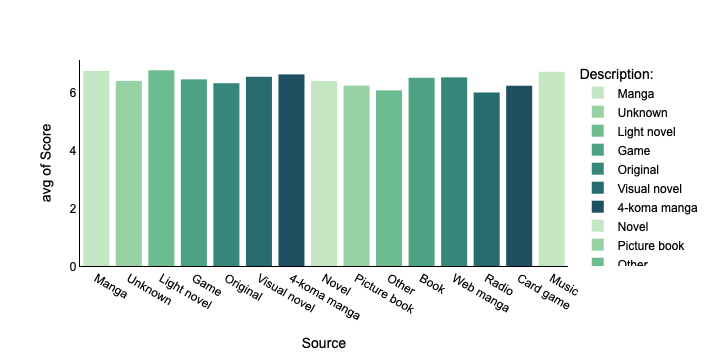

In [170]:
msk = anime["Type"] == "Special"

fig = px.histogram(anime[msk], x = 'Source', y = 'Score', histfunc = 'avg',
            color = "Source", color_discrete_sequence = px.colors.sequential.Blugrn)

graph_patterns()

fig.show()

Next, creating the Interactive Dashboard.

Note: All code has been left commented out, as the main code with the main dashboard is in the next topic.

- Step #1: Preparing to build the Dash app
- Step #2: Building the layout of the dashboard
- Step #3: Adding interactivity to the dashboard
- Step #4: Running the dashboard

In [171]:
# # Step #1: Preparing to build the Dash app
# app = Dash()

# # Step #2: Building the layout of the dashboard
# dropdown = dcc.Dropdown(options = anime["Type"].unique(), value = "Special")

# app.layout = html.Div(children = [
#     html.H1(children = "Types of Animes by Source"),
#     dropdown, dcc.Graph(id = "score_graph")
# ])

# # Step #3: Adding interactivity to the dashboard
# @app.callback(
#     Output(component_id = "score_graph", component_property = "figure"),
#     Input(component_id = dropdown, component_property = "value")
# )

# def update_graph(selected):
#     filtered = anime[anime["Type"] == selected]
#     bar_fig = px.histogram(filtered, x = "Source", y = "Score", histfunc = "avg", 
#                           title = f'Types of Animes by Source by {selected}', 
#                           color = "Source", color_discrete_sequence = px.colors.sequential.Blugrn)
#     graph_patterns()
#     return bar_fig

# # Step #4: Running the dashboard
# if __name__ == "__main__":
#     app.run_server(debug = True)

## 7.3 Interactive Dashboard - Dash Plotly

Inspired by the Explore Dash examples in "Data Visualization & Dashboards" (Plotly, 2024c) example of "IMDb Analysis for Movies & Series - Visualize and analyze IMDB data for top movies and series and get recommendations based on your taste." by "Information Technology Institute (ITI)" (Mohamed Elsayed, 2024), for more information: "Check out the IMDb Dashboard: [link](https://lnkd.in/dguZg8cH) (Mohamed Elsayed, 2024), GitHub repository: [link](https://lnkd.in/dw6sDzTp) (Mahmoud2227, 2024) and Linkedin publication: [link](https://www.linkedin.com/posts/mohamed-elsayed-319a24204_dataanalysis-datascience-webscraping-activity-7189033970657857537-K1Ay/)" (Elsayed, 2024a). 

Next, it was created a decent Interactive Dashboard.

First, installing the "`dash_bootstrap_components`" dependencies using pip install.

In [172]:
# pip install dash_bootstrap_components

Next, it were created a function called "generate_visualizations" to be responsible for plotting 4 graphics.

In [173]:
def generate_visualizations():
    # First Graphic
    tot_score = px.treemap(anime, path = [px.Constant("Scores"), 'Type'], 
                           values = 'Score',
                           title = "Total of Score per Type of Animes",
                           color = 'Type', 
                           color_discrete_sequence = px.colors.sequential.Blugrn_r)
    
    tot_score.update_layout(margin = dict(t = 50, l = 25, r = 25, b = 25))

    # Second Graphic
    filter_anime_genres = anime_genres[numeric_anime_genres_cols].sum().nlargest(10).to_dict()

    top_genders = px.bar(x = filter_anime_genres.keys(), y = filter_anime_genres.values(),
                 text_auto = '.4', title = "Top 10 Genders between Animes",
                 labels = {"x": "Genres Title", "y": "Genres Count"},
                 color = filter_anime_genres.keys(), color_discrete_sequence = px.colors.sequential.Blugrn)
    top_genders.update_layout(plot_bgcolor = "white", paper_bgcolor = "white")
    graph_patterns()

     # Third Graphic
    filter_producers = anime["Producers"][anime["Producers"] != "Unknown"].value_counts().nlargest(5).to_dict()

    labels = filter_producers.keys()
    values = filter_producers.values()
    
    top_producers = px.pie(anime, names = labels, values = values,
                           title = "Top 5 Producers by Animes", 
                           color_discrete_sequence = px.colors.sequential.Blugrn, hole = 0.5)
    
    graph_patterns()

    # Fourth Graphic
    box_popularity = px.box(anime, x = "Popularity", title = 'Popularity Distribution')
    box_popularity.update_traces(marker = dict(color = 'green'))
    box_popularity.update_layout(plot_bgcolor = "white", paper_bgcolor = "white")
    graph_patterns()
    
    return tot_score, top_genders, top_producers, box_popularity

The Interactive Dash below was built following these steps:

- Step #1: Preparing to build the Dash app / Initialize the app
- Step #2: Building the layout of the dashboard
    - Building the layout Style
    - dropdown options to recommend
    - Getting some values to present it
    - Building the layout of the App
- Step #3: Adding interactivity to the dashboard
    - Function to get recommendations
    - Callback to update image container based on dropdown selection
    - tabs-content
- Step #4: Running the dashboard

In [174]:
# Step #1: Preparing to build the Dash app / Initialize the app
app = Dash(__name__, external_stylesheets = [dbc.themes.BOOTSTRAP], title = 'Animes Data Analysis Dashboard')
server = app.server

# Step #2: Building the layout of the dashboard
def generate_stats_card (title, value, image_path):
    return html.Div(
        dbc.Card([
            dbc.CardImg(src = image_path, top=True, style = {'width': '50px','alignSelf': 'center'}),
            dbc.CardBody([
                html.P(value, className = "card-value", style = {'margin': '0px', 'fontSize': '17px', 'fontWeight': 'bold'}),
                html.H4(title, className = "card-title", style = {'margin': '0px', 'fontSize': '13px', 'fontWeight': 'bold'})
            ], style = {'textAlign': 'center'}),
        ], style={'paddingBlock':'10px', "backgroundColor":'#a1c987', 'border':'none', 'borderRadius':'10px'})
    )
    
# Building the layout Style
tab_style = {
    'idle':{
        'borderRadius': '10px',
        'padding': '0px',
        'marginInline': '5px',
        'display':'flex',
        'alignItems':'center',
        'justifyContent':'center',
        'fontWeight': 'bold',
        'backgroundColor': '#a1c987',
        'border':'none'
    },
    'active':{
        'borderRadius': '10px',
        'padding': '0px',
        'marginInline': '5px',
        'display':'flex',
        'alignItems':'center',
        'justifyContent':'center',
        'fontWeight': 'bold',
        'border':'none',
        'textDecoration': 'underline',
        'backgroundColor': '#a1c987'
    }
}

# dropdown options to recommend 
MAX_OPTIONS_DISPLAY = 3300
dropdown_options_anime = [{'label': title, 'value': title} for title in anime['Name'][:MAX_OPTIONS_DISPLAY]]

offcanvas = html.Div([
    dbc.Button("Anime Recommendation", id = "open-anime-offcanvas", 
               n_clicks = 0, style = {'backgroundColor': '#a1c987', 'color': 'black', 'fontWeight': 'bold', 'border': 'none'}
    ), # dbc.Button
    dbc.Offcanvas(html.Div([
        dcc.Dropdown(id = 'anime-dropdown', options = dropdown_options_anime,
                     placeholder = 'Select an anime...', searchable = True,
                     style = {'color':'black'}
                    ), # dcc.Dropdown
            dcc.Loading(html.Div(id = 'anime-recommendation-content'), 
                        type = 'circle', color = '#a1c987', style = {'marginTop': '60px'})
    ]), # html.Div
                  id = "anime-recommendation-offcanvas",
                  title = "Anime Recommendations", is_open = False, 
                  style = {'backgroundColor': "white", 'color': '#a1c987'}
        ) # dbc.Offcanvas
], style = {'display': 'flex', 'justifyContent': 'space-between', 'marginTop': '20px', 'marginLeft': '20px'}) # offcanvas

# Getting some values to present it
num_of_animes = anime["Name"].nunique()
num_of_genders = len(unique_genres)
num_of_members = anime["Members"].sum()
num_of_members = f"{(num_of_members / 1000000):.1f}m"
num_of_studios = anime["Studios"].nunique()

# Building the layout of the App
app.layout = html.Div([
    dbc.Container([
        dbc.Row([
            dbc.Col(html.Img(src = "./assets/animes.png", width = 100), width = 2), # dbc.Col
            dbc.Col(
                dcc.Tabs(id = 'graph-tabs', value = 'overview', children = [
                    dcc.Tab(label = 'Overview', value = 'overview', style = tab_style['idle'], selected_style = tab_style['active']),
                ], style = {'marginTop': '20px', 'marginLeft': '20px'})
                , width = 6), # dbc.Col
            dbc.Col(offcanvas, width = 4)
        ]), # dbc.Row - First Row
        dbc.Row([
            dbc.Col(generate_stats_card("Animes", num_of_animes, "./assets/otaku.png"), width = 3),
            dbc.Col(generate_stats_card("Genders", num_of_genders, "./assets/cartoon.png"), width = 3),
            dbc.Col(generate_stats_card("Members", num_of_members, "./assets/gundam.png"), width = 3),
            dbc.Col(generate_stats_card("Studios", num_of_studios, "./assets/studios.png"), width = 3),
        ], style = {'marginBlock': '10px'}), # dbc.Row - Second Row
        dbc.Row([
            dcc.Tabs(id = 'tabs', value = 'anime', children=[
                dcc.Tab(label = 'Anime', value = 'anime', style = {'border':'1px line white', 'backgroundColor':'black', 'color': '#809e6d', 'fontWeight': 'bold'},
                        selected_style = {'border':'1px solid white','backgroundColor':'black','color': '#a1c987','fontWeight': 'bold', 'textDecoration': 'underline'})
            ], style = {'padding': '0px'})
        ]), # dbc.Row - Third Row
        dbc.Row([
            dcc.Loading([
                html.Div(id = 'tabs-content')
            ], type = 'default', color = '#809e6d')
        ]), # dbc.Row - Fourth Row
    ], style = {'padding': '0px'}) # dbc.Container
], style = {'backgroundColor': 'white', 'minHeight': '100vh'}) # app.layout


# Step #3: Adding interactivity to the dashboard
@app.callback(
    Output("anime-recommendation-offcanvas", "is_open"),
    Input("open-anime-offcanvas", "n_clicks"),
    [State("anime-recommendation-offcanvas", "is_open")],
)
def toggle_offcanvas_anime(n1, is_open):
    if n1:
        return not is_open
    return is_open

# Function to get recommendations
def get_recommendations(df, indices, title, cosine_sim):
    idx = indices[title]
    sim_scores = list(enumerate(cosine_sim[idx]))  # Get the pairwsie similarity scores of all animes with that anime
    sim_scores = sorted(sim_scores, key = lambda x: x[1], reverse = True) # Sort the animes based on the similarity scores
    sim_scores = sim_scores[1:6] # Get the scores of the 10 most similar animes
    anime_indices = [i[0] for i in sim_scores] # Get the anime indices
    return anime['Name'].iloc[anime_indices] # Return the top 10 most similar animes

# Callback to update image container based on dropdown selection
@app.callback(
    Output('anime-recommendation-content', 'children'),
    [Input('anime-dropdown', 'value')]
)
def update_recommendation_anime(selected_anime):
    tfidf = TfidfVectorizer(stop_words = "english")
    tfidf_matrix = tfidf.fit_transform(anime["Genres"])
    cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

    indices = pd.Series(anime.index, index = anime['Name']).drop_duplicates()

    if selected_anime:
        x = []
        for i in range(0, 5):
            x.append(anime[anime["Name"] == get_recommendations(anime, indices, selected_anime, cosine_sim).iloc[i]][["Name"]])
    else:
        return []
    
    return html.Div(children=[
            dcc.Link(f"{i+1} - {data['Name'].values[0]}", href = "", style={'display':'block','color':'#809e6d','marginBlock':'10px'}
                    ,target='_blank') for i, data in enumerate(x)
    ],style = {'marginTop': '10px','textAlign': 'center', 'color': '#809e6d'})


# tabs-content
@app.callback(
    Output('tabs-content', 'children'),
    [Input('graph-tabs', 'value'),Input('tabs', 'value')]
)
def update_tab(tab, tab2):
    fig1, fig2, fig3, fig4 = generate_visualizations()
    return html.Div([
        html.Div([
            dcc.Graph(id = 'graph1', figure = fig1),
        ], style={'width': '50%', 'display': 'inline-block'}),
        html.Div([
            dcc.Graph(id= ' graph2', figure = fig2),
        ], style={'width': '50%', 'display': 'inline-block'}),
        html.Div([
            dcc.Graph(id = 'graph3', figure = fig3),
        ], style={'width': '50%', 'display': 'inline-block'}),
        html.Div([
            dcc.Graph(id = 'graph4', figure = fig4),
        ], style={'width': '50%', 'display': 'inline-block'})
    ])

# Step #4: Running the dashboard
if __name__ == "__main__":
    app.run_server(debug = True)

It was not easy and simple to create this visualisation, first, it was necessary to understand how the organisation of codes works using Plotly Dash. Thanks the previous example helped to clarify that there are four steps to be followed:

- Step #1: Preparing to build the Dash app
- Step #2: Building the layout of the dashboard
- Step #3: Adding interactivity to the dashboard
- Step #4: Running the dashboard

Based on these steps, the panel was created for younger adults (18 - 35 years) old, important features were chosen to compose this layout as a main overview to present to the user, showing the number of animes, genres, members and studios composed in this base, also graphics such as Total of Score per Type of Animes, Top 10 Genders between Animes, Top 5 Producers by Animes and Popularity Distribution was important to complete the overview of it.

Instead of creating external .py files (python extension), it was decided to leave the functions internally, for example, the "generate_visualizations" function could be created in an external file and imported, but it was decided to keep everything within the same document to keep it centralised, with only the images that are in an external folder being imported into the document.

An option for recommendations within the visualisation was also created if it is of interest to the user. The buttons are limited to an overview of all types of anime within the database, but new improvements can be created to show different aspects of the database and present them to the public.

The dataset is suitable for Machine Learning models in an online retail business, once there are important features like Anime ID, User ID, Score, Ratings, Genders, Type, Producers, Studios, Popularity and so on, with this information, it is possible to create recommendations using content-based recommender and collaborative filtering user-user and item-item, also for the use of Market Basket Analysis using Apriori and FP Growth Algorithm and a huge range of graphics visualisation.

Regarding visualisations using Plotly, a standard was created to keep all graphs created in the same visualisation standard, using font size 16 for titles, font family "Arial", font colour in "black", positions and proportions in the same alignment and green colouring.

Opted to use a green range of colour once, "In color psychology, colors made up of long wavelengths are considered "arousing or warm," whereas colors such as green that have shorter wavelengths are "relaxing or cool." Whereas our eyes must adjust to see colors with longer wavelengths, they don't need to adjust at all to see cool colors." (Cherry, 2023), also "Green Is Calming, Green Is Healthful, Green Is Natural, Green Is Optimistic" (Cherry, 2023).

The dashboard was created part by part, creating each element, testing and saving. When an error was found, it looked for the solution, reading the code and understanding more about the block codes to get solutions. Based on the creation block by block, all the final code was created. For example, first, the main layout block was created, then the icons and buttons by rows and columns, testing colours, size, etc. After the visualisation was done, the values ​​were created to be put internally as results. 

Then, the dropdown for recommendations was created. However, the recommendations were quite challenging, so the graphs were created first and then tested one by one. After the graphs were finished, it focused on the recommendations, where the functions were tested outside the main code. The main problem was that the "dcc.Link" function, which was expecting link data, but since the database does not have this information, it was commented out as nothing, and so everything worked correctly. 

However, updates can be made to the design and upgrades to improve the dashboard. Unfortunately, there is not enough time to test Streamlit. So the panel was created using Plotly Dash with the focus of showing people a little more about anime and its popularity, the number of members who follow and watch anime, also the number of active studios creating anime, and, last but not least, recommendations which would be the main point for a new and old user, and the whole community.

---

# Information

Recommendation data from 320.0000 users and 16.000 animes at myanimelist.net

This dataset contains information about 17.562 anime and the preference from 325.772 different users. In particular, this dataset contain:

- The anime list per user. Include dropped, complete, plan to watch, currently watching and on hold.
- Ratings given by users to the animes that they has watched completely.
- Information about the anime like genre, stats, studio, etc.
- HTML with anime information to do data scrapping. These files contain information such as reviews, synopsis, information about the staff, anime statistics, genre, etc.
Also, the code used to collect the data is available at github: https://github.com/Hernan4444/MyAnimeList-Database.

**Warning: this dataset includes information about anime for adults (hentai).**

The data was scrapped between February 26th and March 20th.

- The "html" folder contain 1 zip per anime (17.562 different anime). Each zip contains different HTML pages scrapped from MyAnimeList. The scrapped pages are:
1. Main page
2. Reviews
3. Recommendations
4. Stats
5. Characters & Staff

I uploaded 2 files as example to don't increase the size of this dataset. All HTML files are in this link: https://drive.google.com/drive/folders/12ghJk-sWyXXORoLBUpPirK4YdtIaZPV_?usp=sharing

**Acknowledgements**

Thanks to:

1. MyAnimeList for providing anime data.
2. Jikan API for provide users preference.
3. Pontificia Universidad Católica de Chile for provide servers to run the code.


Inspiration

1. Have an HTML files to experience the scraping exercise without the delay of each requests.
2. Experiment with different types of recommended. For instance, collaborative filtering or based on context like stats, genre, seiyus, reviews, synopsis, etc.
3. Use this information to build a better anime recommended system.
4. Identifying which feature allows us to build the best anime recommended system.

Ideas to the future

Build the same dataset with manga and novel.

# Data Dictionary

"`animelist.csv`" have the list of all animes register by the user with the respective score, watching status and numbers of episodes watched. This dataset contains 109 Million row, 17.562 different animes and 325.772 different users. The file have the following columns:
- user_id: non identifiable randomly generated user id.
- anime_id: MyAnimeList ID of the anime. (e.g. 1).
- score: score between 1 to 10 given by the user. 0 if the user didn't assign a score. (e.g. 10)
- watching_status: state ID from this anime in the anime list of this user. (e.g. 2)
- watched_episodes: numbers of episodes watched by the user. (e.g. 24)

"`watching_status.csv`" describe every possible status of the column: "`watching_status`" in animelist.csv.

"`rating_complete.csv`" is a subset of "`animelist.csv`". This dataset only considers animes that the user has watched completely (watching_status==2) and gave it a score (score!=0). This dataset contains 57 Million ratings applied to 16.872 animes by 310.059 users. This file have the following columns:

- user_id: non identifiable randomly generated user id.
- anime_id: - MyAnimelist ID of the anime that this user has rated.
- rating: rating that this user has assigned.

"`anime.csv`" contain general information of every anime (17.562 different anime) like genre, stats, studio, etc. This file have the following columns:

- MAL_ID: MyAnimelist ID of the anime. (e.g. 1)
- Name: full name of the anime. (e.g. Cowboy Bebop)
- Score: average score of the anime given from all users in MyAnimelist database. (e.g. 8.78)
- Genres: comma separated list of genres for this anime. (e.g. Action, Adventure, Comedy, Drama, Sci-Fi, Space)
- English name: full name in english of the anime. (e.g. Cowboy Bebop)
- Japanese name: full name in japanses of the anime. (e.g. カウボーイビバップ)
- Type: TV, movie, OVA, etc. (e.g. TV)
- Episodes': number of chapters. (e.g. 26)
- Aired: broadcast date. (e.g. Apr 3, 1998 to Apr 24, 1999)
- Premiered: season premiere. (e.g. Spring 1998)
- Producers: comma separated list of produducers (e.g. Bandai Visual)
- Licensors: comma separated list of licensors (e.g. Funimation, Bandai Entertainment)
- Studios: comma separated list of studios (e.g. Sunrise)
- Source: Manga, Light novel, Book, etc. (e.g Original)
- Duration: duration of the anime per episode (e.g 24 min. per ep.)
- Rating: age rate (e.g. R - 17+ (violence & profanity))
- Ranked: position based in the score. (e.g 28)
- Popularity: position based in the the number of users who have added the anime to their list. (e.g 39)
- Members: number of community members that are in this anime's "group". (e.g. 1251960)
- Favorites: number of users who have the anime as "favorites". (e.g. 61,971)
- Watching: number of users who are watching the anime. (e.g. 105808)
- Completed: number of users who have complete the anime. (e.g. 718161)
- On-Hold: number of users who have the anime on Hold. (e.g. 71513)
- Dropped: number of users who have dropped the anime. (e.g. 26678)
- Plan to Watch': number of users who plan to watch the anime. (e.g. 329800)
- Score-10': number of users who scored 10. (e.g. 229170)
- Score-9': number of users who scored 9. (e.g. 182126)
- Score-8': number of users who scored 8. (e.g. 131625)
- Score-7': number of users who scored 7. (e.g. 62330)
- Score-6': number of users who scored 6. (e.g. 20688)
- Score-5': number of users who scored 5. (e.g. 8904)
- Score-4': number of users who scored 4. (e.g. 3184)
- Score-3': number of users who scored 3. (e.g. 1357)
- Score-2': number of users who scored 2. (e.g. 741)
- Score-1': number of users who scored 1. (e.g. 1580)

# References

Abdu Musowir U (2023). Language Translation with Python: A Beginner’s Guide using googletrans library. [online] Medium. Available at: https://medium.com/@musowir_u/language-translation-with-python-a-beginners-guide-using-googletrans-library-6df86223a7b5 [Accessed 22 Nov. 2024].

Amos, D. (2022). Python GUI Programming With Tkinter – Real Python. [online] realpython.com. Available at: https://realpython.com/python-gui-tkinter/ [Accessed Nov. 2024].

Andryw Marques (2024). Pandas DataFrame: Show All Columns/Rows | Built In. [online] builtin.com. Available at: https://builtin.com/data-science/pandas-show-all-columns [Accessed 21 Nov. 2024].

Berukoff, T. (2023). Conquer Missing Data: Harnessing Pandas’ Techniques for Enhanced Analysis. [online] Medium. Available at: https://medium.com/@taylorberukoff/conquer-missing-data-harnessing-pandas-techniques-for-enhanced-analysis-5df017327ea5 [Accessed 22 Nov. 2024].

Cherry, K. (2023). How Does the Color Green Impact Mood and Behavior? [online] Verywell Mind. Available at: https://www.verywellmind.com/color-psychology-green-2795817 [Accessed Nov. 2024].

chiang, J. (2022). Overview of Item-Item Collaborative Filtering Recommendation System. [online] Geek Culture. Available at: https://medium.com/geekculture/overview-of-item-item-collaborative-filtering-recommendation-system-64ee15b24bb8 [Accessed 18 Nov. 2024].

Elsayed, M. (2024a). Mohamed Elsayed on LinkedIn: #dataanalysis #datascience #webscraping #machinelearning #plotly #dash… | 23 comments. [online] Linkedin.com. Available at: https://www.linkedin.com/posts/mohamed-elsayed-319a24204_dataanalysis-datascience-webscraping-activity-7189033970657857537-K1Ay/ [Accessed 24 Nov. 2024].

Evelyn (2023). Collaborative Filtering in Recommender System: An Overview. [online] Medium. Available at: https://medium.com/@evelyn.eve.9512/collaborative-filtering-in-recommender-system-an-overview-38dfa8462b61 [Accessed Nov. 2024].

Gaurav, P. (2023). Step By Step Content-Based Recommendation System. [online] Medium. Available at: https://medium.com/@prateekgaurav/step-by-step-content-based-recommendation-system-823bbfd0541c [Accessed Nov. 2024].

GeeksforGeeks (2018). Python | Pandas Series.str.get_dummies(). [online] GeeksforGeeks. Available at: https://www.geeksforgeeks.org/python-pandas-series-str-get_dummies/ [Accessed 24 Nov. 2024].

GeeksforGeeks (2024). How To Clear Out A Frame In The Tkinter? [online] GeeksforGeeks. Available at: https://www.geeksforgeeks.org/how-to-clear-out-a-frame-in-the-tkinter/ [Accessed 19 Nov. 2024].

Itamar Turner-Trauring (2019). Reducing Pandas memory usage #1: lossless compression. [online] Python⇒Speed. Available at: https://pythonspeed.com/articles/pandas-load-less-data/ [Accessed Nov. 2024].

Mahmoud2227 (2024). GitHub - Mahmoud2227/IMDB-Dashboard. [online] GitHub. Available at: https://github.com/Mahmoud2227/IMDB-Dashboard [Accessed Nov. 2024].

Mohamed Elsayed (2024b). IMDB Data Analysis Dashboard. [online] mahmoud2227.pythonanywhere.com. Available at: https://mahmoud2227.pythonanywhere.com/ [Accessed Nov. 2024].

Plotly (2016). Layout.xaxis. [online] Plotly.com. Available at: https://plotly.com/python/reference/layout/xaxis/#layout-xaxis-showline [Accessed Nov. 2024].

Plotly (2024a). Dash in 20 Minutes Tutorial | Dash for Python Documentation | Plotly. [online] dash.plotly.com. Available at: https://dash.plotly.com/tutorial [Accessed Nov. 2024].

Plotly (2024b). Part 2. Layout | Dash for Python Documentation | Plotly. [online] dash.plotly.com. Available at: https://dash.plotly.com/layout [Accessed Nov. 2024].

Plotly (2024c). Plotly Dash App Examples. [online] plotly.com. Available at: https://plotly.com/examples/ [Accessed Nov. 2024].

Plotly (2024d). Setting the Font, Title, Legend Entries, and Axis Titles. [online] plotly.com. Available at: https://plotly.com/python/figure-labels/ [Accessed Nov. 2024].

Python Software Foundation (2024). tkinter — Python interface to Tcl/Tk. [online] Python documentation. Available at: https://docs.python.org/3.13/library/tkinter.html [Accessed Nov. 2024].

Saumyab271 (2021). Item-based Collaborative Filtering. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2021/05/item-based-collaborative-filtering-build-your-own-recommender-system/ [Accessed 18 Nov. 2024].

scikit-learn developers (2024). TfidfVectorizer. [online] scikit-learn. Available at: https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html [Accessed Nov. 2024].

The Pandas Development Team (2024). pandas.Series.str.contains — pandas 1.4.2 documentation. [online] pandas.pydata.org. Available at: https://pandas.pydata.org/docs/reference/api/pandas.Series.str.contains.html [Accessed Nov. 2024].

Valdivieso, H. (2020). Anime Recommendation Database 2020. [online] Kaggle.com. Available at: https://www.kaggle.com/datasets/hernan4444/anime-recommendation-database-2020?select=anime.csv [Accessed 13 Nov. 2024].

W3Schools (2024). Pandas DataFrame iterrows() Method. [online] www.w3schools.com. Available at: https://www.w3schools.com/python/pandas/ref_df_iterrows.asp [Accessed 18 Nov. 2024].

Zach (2022). Pandas: How to Check if Column Contains String. [online] Statology. Available at: https://www.statology.org/pandas-check-if-column-contains-string/ [Accessed Nov. 2024].